### Capstone Project - Problem Statement
Great Learning PGP - ARTIFICIAL INTELLIGENCE & MACHINE LEARNING culminates with a Capstone Project. 
Automatic Ticket Assignment is given as the final capstone project.

This Project involves “Natural Language Processing” and consists of analyzing ticket short desctiption and description and other relevant features to arrive at a model to automatically assign a ticket to one of the Groups

• DOMAIN: Automatic Ticketing System.

• CONTEXT: One of the key activities of any IT function is to “Keep the lights on” to ensure there is no impact to the Business operations. IT
leverages Incident Management process to achieve the above Objective. An incident is something that is unplanned interruption to an IT
service or reduction in the quality of an IT service that affects the Users and the Business. The main goal of Incident Management process is
to provide a quick fix / workarounds or solutions that resolves the interruption and restores the service to its full capacity to ensure no
business impact. In most of the organisations, incidents are created by various Business and IT Users, End Users/ Vendors if they have
access to ticketing systems, and from the integrated monitoring systems and tools. Assigning the incidents to the appropriate person or unit
in the support team has critical importance to provide improved user satisfaction while ensuring better allocation of support resources. The
assignment of incidents to appropriate IT groups is still a manual process in many of the IT organisations. Manual assignment of incidents is
time consuming and requires human efforts. There may be mistakes due to human errors and resource consumption is carried out
ineffectively because of the misaddressing. On the other hand, manual assignment increases the response and resolution times which result
in user satisfaction deterioration / poor customer service.

• Business Domain Value: In the support process, incoming incidents are analysed and assessed by organisations support teams to
fulfill the request. In many organisations, better allocation and effective usage of the valuable support resources will directly result in
substantial cost savings. Currently the incidents are created by various stakeholders (Business Users, IT Users and Monitoring Tools) within IT
Service Management Tool and are assigned to Service Desk teams (L1 / L2 teams). This team will review the incidents for right ticket
categorization, priorities and then carry out initial diagnosis to see if they can resolve. Around ~54% of the incidents are resolved by L1 / L2
teams. Incase L1 / L2 is unable to resolve, they will then escalate / assign the tickets to Functional teams from Applications and
Infrastructure (L3 teams). Some portions of incidents are directly assigned to L3 teams by either Monitoring tools or Callers / Requestors. L3
teams will carry out detailed diagnosis and resolve the incidents. Around ~56% of incidents are resolved by Functional / L3 teams. Incase if
vendor support is needed, they will reach out for their support towards incident closure. L1 / L2 needs to spend time reviewing Standard
Operating Procedures (SOPs) before assigning to Functional teams (Minimum ~25-30% of incidents needs to be reviewed for SOPs before
ticket assignment). 15 min is being spent for SOP review for each incident. Minimum of ~1 FTE effort needed only for incident assignment to
L3 teams. During the process of incident assignments by L1 / L2 teams to functional groups, there were multiple instances of incidents
getting assigned to wrong functional groups. Around ~25% of Incidents are wrongly assigned to functional teams. Additional effort needed
for Functional teams to re-assign to right functional groups. During this process, some of the incidents are in queue and not addressed
timely resulting in poor customer service. Guided by powerful AI techniques that can classify incidents to right functional groups can help
organizations to reduce the resolving time of the issue and can focus on more productive tasks.

#### Objectives of the project:

*   Load and clean files for analysis
*   Exploratory analysis on data present in the files
*   Build frequency plots and word clouds to pictorially represent the data
*   Understand the specifics of each text column and be able to tokenize the words
*   Complete Feature Engineering to decide on features required for model
*   Complete Hypothesis testing, if required
*   Build Models aimed at predicting Assignment Group
*   Finalize on one best and accurate model











### Install and Import necessary libraries and load the input data file

In [ ]:
!pip install nlpaug

import nltk
nltk.download('averaged_perceptron_tagger')

nltk.download('wordnet')

import nlpaug
import nlpaug.augmenter.word as naw

     |████████████████████████████████| 410 kB 7.2 MB/s 
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


In [ ]:
!pip install googletrans==3.1.0a0

     |████████████████████████████████| 55 kB 3.3 MB/s 
     |████████████████████████████████| 1.3 MB 18.5 MB/s 
     |████████████████████████████████| 42 kB 1.7 MB/s 
     |████████████████████████████████| 65 kB 4.7 MB/s 
     |████████████████████████████████| 53 kB 3.0 MB/s 
  Created wheel for googletrans: filename=googletrans-3.1.0a0-py3-none-any.whl size=16367 sha256=b38fc4db7f6d04bf6e8a5b3ad20c30035bdab19e6cb6947a1651babcb49c9769
  Stored in directory: /root/.cache/pip/wheels/0c/be/fe/93a6a40ffe386e16089e44dad9018ebab9dc4cb9eb7eab65ae
Successfully built googletrans


In [ ]:
from googletrans import Translator
import googletrans
translator = Translator()

In [ ]:
!pip install transformers

     |████████████████████████████████| 4.0 MB 9.8 MB/s 
     |████████████████████████████████| 77 kB 9.0 MB/s 
     |████████████████████████████████| 596 kB 77.4 MB/s 
     |████████████████████████████████| 880 kB 61.4 MB/s 
     |████████████████████████████████| 6.6 MB 76.0 MB/s 
  Created wheel for sacremoses: filename=sacremoses-0.0.53-py3-none-any.whl size=895260 sha256=12a10434a0227c9e2be9dd74b58df8050356f59d055c6412cc26fd7061c4f3ce
  Stored in directory: /root/.cache/pip/wheels/87/39/dd/a83eeef36d0bf98e7a4d1933a4ad2d660295a40613079bafc9
Successfully built sacremoses
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
from transformers import TFBertModel, BertTokenizer

In [ ]:
import sys

!pip3 install catboost

     |████████████████████████████████| 76.6 MB 65 kB/s 


In [ ]:
import os
import re
import gc
import time
import string
import unicodedata
import sys
import pickle
import numpy

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats

from imblearn.over_sampling import RandomOverSampler

from sklearn import metrics as skl_metrics
from sklearn.metrics import classification_report, accuracy_score, f1_score, recall_score, precision_score, confusion_matrix

from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV, RandomizedSearchCV
from sklearn.experimental import enable_halving_search_cv  # noqa
from sklearn.model_selection import HalvingGridSearchCV

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import BaggingClassifier, AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier


from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, TfidfTransformer
from sklearn.cluster import MiniBatchKMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder

import nltk
from nltk.corpus import wordnet,stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import torch
import torch.nn as nn
import torch.nn.functional as F

import keras
import keras.backend as K
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_datasets as tfds
from tensorflow.keras.preprocessing.text import Tokenizer
from keras.preprocessing import sequence
from tensorflow.keras.preprocessing.sequence import pad_sequences
import tensorflow.keras.layers as L
from tensorflow.keras import layers, callbacks
from keras.layers import Embedding, Flatten, LSTM, Dense, SpatialDropout1D, Dropout, Bidirectional, SimpleRNN, Activation, Input
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint  
from keras.initializers import Constant
from tensorflow.keras.optimizers import SGD, Adam
from keras.models import load_model,Sequential
from tensorflow.keras.losses import SparseCategoricalCrossentropy
import keras.metrics as metrics
from tensorflow.keras.utils import to_categorical
from keras.utils.np_utils import to_categorical

from tqdm import tqdm
from google.colab import drive

import warnings
warnings.filterwarnings('ignore')

In [ ]:
## NLTK Downloads
import nltk
nltk.download('stopwords')
stop = set(stopwords.words('english')) 
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

#### Connect Google drive to access data file

In [ ]:
drive.mount('/content/drive/', force_remount=True)

Mounted at /content/drive/


In [ ]:
RUN_HPT_ML_Models = False


#### Read the datafile - excel file from google drive

In [ ]:
# Read the data from EXCEL
incidents = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/00_Capstone Project/input_data.xlsx')
# incidents = pd.read_excel('/content/drive/MyDrive/AIML/Projects/Capstone/Data/NLP_Input_Data.xlsx')
incidents.head(10)

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0
5,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0
6,event: critical:HostName_221.company.com the v...,event: critical:HostName_221.company.com the v...,jyoqwxhz clhxsoqy,GRP_1
7,ticket_no1550391- employment status - new non-...,ticket_no1550391- employment status - new non-...,eqzibjhw ymebpoih,GRP_0
8,unable to disable add ins on outlook,unable to disable add ins on outlook,mdbegvct dbvichlg,GRP_0
9,ticket update on inplant_874773,ticket update on inplant_874773,fumkcsji sarmtlhy,GRP_0


### Perform all the necessary Data Analysis and Data visualization

In [ ]:
incidents.shape

(8500, 4)

In [ ]:
incidents.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


In [ ]:
incidents["Assignment group"].nunique(),incidents["Assignment group"].unique()


(74, array(['GRP_0', 'GRP_1', 'GRP_3', 'GRP_4', 'GRP_5', 'GRP_6', 'GRP_7',
        'GRP_8', 'GRP_9', 'GRP_10', 'GRP_11', 'GRP_12', 'GRP_13', 'GRP_14',
        'GRP_15', 'GRP_16', 'GRP_17', 'GRP_18', 'GRP_19', 'GRP_2',
        'GRP_20', 'GRP_21', 'GRP_22', 'GRP_23', 'GRP_24', 'GRP_25',
        'GRP_26', 'GRP_27', 'GRP_28', 'GRP_29', 'GRP_30', 'GRP_31',
        'GRP_33', 'GRP_34', 'GRP_35', 'GRP_36', 'GRP_37', 'GRP_38',
        'GRP_39', 'GRP_40', 'GRP_41', 'GRP_42', 'GRP_43', 'GRP_44',
        'GRP_45', 'GRP_46', 'GRP_47', 'GRP_48', 'GRP_49', 'GRP_50',
        'GRP_51', 'GRP_52', 'GRP_53', 'GRP_54', 'GRP_55', 'GRP_56',
        'GRP_57', 'GRP_58', 'GRP_59', 'GRP_60', 'GRP_61', 'GRP_32',
        'GRP_62', 'GRP_63', 'GRP_64', 'GRP_65', 'GRP_66', 'GRP_67',
        'GRP_68', 'GRP_69', 'GRP_70', 'GRP_71', 'GRP_72', 'GRP_73'],
       dtype=object))

#### Find duplicates and Nulls ;  analyze the data for any significance or impact if they are dropped

In [ ]:
incidents[incidents.isnull().any(axis=1)]

,Short description,Description,Caller,Assignment group
2604,NaN,\n\nreceived from: ohdrnswl.rezuibdt@gmail.com...,ohdrnswl rezuibdt,GRP_34
3383,NaN,\n-connected to the user system using teamview...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn.\n-connected to t...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn.\n-connected to t...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn.\n-connected to t...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn.\n-connected to t...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,\n\nreceived from: eqmuniov.ehxkcbgj@gmail.com...,eqmuniov ehxkcbgj,GRP_0
4395,i am locked out of skype,NaN,viyglzfo ajtfzpkb,GRP_0


In [ ]:
incidents_subset = incidents[['Short description', 'Description', 'Caller','Assignment group']].copy()
duplicateIncidentRows = incidents_subset[incidents_subset.duplicated()]
duplicateIncidentRows

,Short description,Description,Caller,Assignment group
51,call for ecwtrjnq jpecxuty,call for ecwtrjnq jpecxuty,olckhmvx pcqobjnd,GRP_0
229,call for ecwtrjnq jpecxuty,call for ecwtrjnq jpecxuty,olckhmvx pcqobjnd,GRP_0
493,ticket update on inplant_872730,ticket update on inplant_872730,fumkcsji sarmtlhy,GRP_0
512,blank call //gso,blank call //gso,rbozivdq gmlhrtvp,GRP_0
667,job bkbackup_tool_powder_prod_full failed in j...,received from: monitoring_tool@company.com\n\n...,bpctwhsn kzqsbmtp,GRP_8
...,...,...,...,...
7836,probleme mit erpgui \tmqfjard qzhgdoua,probleme mit erpgui \tmqfjard qzhgdoua,tmqfjard qzhgdoua,GRP_24
8051,issue on pricing in distributor_tool,we have agreed price with many of the distribu...,hbmwlprq ilfvyodx,GRP_21
8093,reset passwords for prgthyuulla ramdntythanjes...,the,boirqctx bkijgqry,GRP_17
8347,blank call // loud noise,blank call // loud noise,rbozivdq gmlhrtvp,GRP_0


Drop duplicate rows from dataset, as they will not add any value to prediction

In [ ]:
incidents_newset = incidents.drop_duplicates(['Short description', 'Description', 'Caller', 'Assignment group'])

In [ ]:
incidents_newset.shape

(8416, 4)

In [ ]:
incidents_newset[incidents_newset.isnull().any(axis=1)]

,Short description,Description,Caller,Assignment group
2604,NaN,\n\nreceived from: ohdrnswl.rezuibdt@gmail.com...,ohdrnswl rezuibdt,GRP_34
3383,NaN,\n-connected to the user system using teamview...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn.\n-connected to t...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn.\n-connected to t...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn.\n-connected to t...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn.\n-connected to t...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,\n\nreceived from: eqmuniov.ehxkcbgj@gmail.com...,eqmuniov ehxkcbgj,GRP_0
4395,i am locked out of skype,NaN,viyglzfo ajtfzpkb,GRP_0


In [ ]:
incidents_newset.dropna(inplace=True)
incidents_newset.shape

(8407, 4)

#### Assignment group data distribution

In [ ]:
incidentnewset_groupby_Assignemntgrp = incidents_newset.groupby(['Assignment group']).size().reset_index(name='counts')
incidentnewset_groupby_Assignemntgrp

,Assignment group,counts
0,GRP_0,3925
1,GRP_1,31
2,GRP_10,140
3,GRP_11,30
4,GRP_12,257
...,...,...
69,GRP_71,2
70,GRP_72,2
71,GRP_73,1
72,GRP_8,645


In [ ]:
incidentnewset_groupby_Assignemntgrp.describe()

,counts
count,74.000000
mean,113.608108
std,459.710416
min,1.000000
25%,5.250000
50%,26.000000
75%,81.000000
max,3925.000000


Looking at the 75 percentile, most of the groups have less than 100 rows..


In [ ]:
incidentnewset_groupby_Assignemntgrp["count_perc"] = round((incidentnewset_groupby_Assignemntgrp["counts"]/incidents_newset.shape[0])*100,2)
incidentnewset_groupby_Assignemntgrp.sort_values(["count_perc"], axis=0, 
                 ascending=False, inplace=True) 

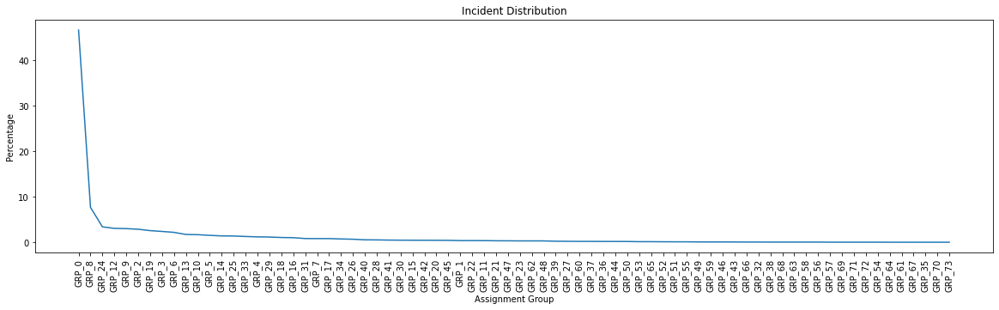

In [ ]:
plt.subplots(figsize = (20,5))
 
plt.plot(incidentnewset_groupby_Assignemntgrp["Assignment group"], incidentnewset_groupby_Assignemntgrp["count_perc"]) 
plt.xlabel('Assignment Group') 
plt.ylabel('Percentage') 
plt.xticks(rotation=90)
plt.title('Incident Distribution') 
  
 
plt.show()

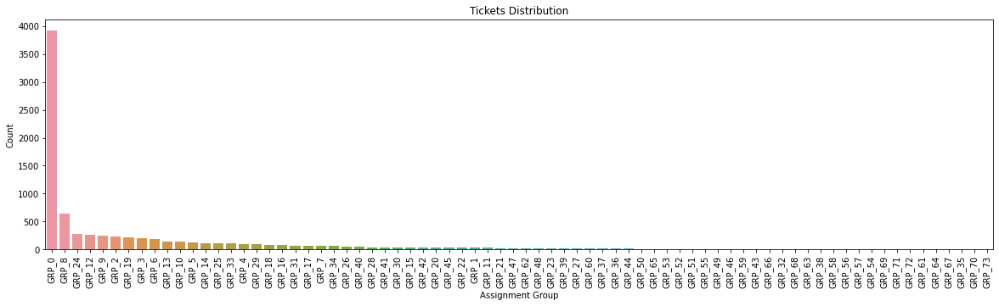

In [ ]:
plt.subplots(figsize = (20,5))

sns.countplot(x='Assignment group', data=incidents_newset,order = incidents_newset['Assignment group'].value_counts().index)
plt.xlabel('Assignment Group') 
plt.ylabel('Count') 
plt.xticks(rotation=90)
plt.title('Tickets Distribution')

plt.show()

In [ ]:
incidents_newset['Assignment group'].value_counts()

GRP_0     3925
GRP_8      645
GRP_24     285
GRP_12     257
GRP_9      252
          ... 
GRP_64       1
GRP_67       1
GRP_35       1
GRP_70       1
GRP_73       1
Name: Assignment group, Length: 74, dtype: int64

This is a long list of groups and the data is completely imbalanced

#### Caller data understanding

In [ ]:
incidents["Caller"].nunique()

2950

In [ ]:
incidentset_callergrp = incidents.groupby(['Caller']).size().reset_index(name='counts')
incidentset_callergrp

,Caller,counts
0,DEsowkrH sciejzNE,2
1,HdOuWxAt qfKdlJMx,1
2,ZkBogxib QsEJzdZO,151
3,abiuclvj brziktno,1
4,abtknpew ifcekjdb,1
...,...,...
2945,zylaexnv pvkzbduh,3
2946,zylwdbig wdkbztjp,1
2947,zymdwqsi jzvbthil,1
2948,zywoxerf paqxtrfk,9


In [ ]:
incidentset_callergrp.sort_values(["counts"], axis=0, ascending=False, inplace=True) 

In [ ]:
incidentset_callergrp.head(20)

,Caller,counts
182,bpctwhsn kzqsbmtp,810
2,ZkBogxib QsEJzdZO,151
646,fumkcsji sarmtlhy,134
1902,rbozivdq gmlhrtvp,87
1945,rkupnshb gsmzfojw,71
1044,jloygrwh acvztedi,64
2087,spxqmiry zpwgoqju,63
1587,oldrctiu bxurpsyi,57
1586,olckhmvx pcqobjnd,54
1098,jyoqwxhz clhxsoqy,51


In [ ]:
incidentnewset_groupby_Callergrp = incidents_newset.groupby(['Caller','Assignment group']).size().reset_index(name='counts')
incidentnewset_groupby_Callergrp

,Caller,Assignment group,counts
0,DEsowkrH sciejzNE,GRP_13,1
1,DEsowkrH sciejzNE,GRP_18,1
2,HdOuWxAt qfKdlJMx,GRP_0,1
3,ZkBogxib QsEJzdZO,GRP_1,1
4,ZkBogxib QsEJzdZO,GRP_10,2
...,...,...,...
4456,zylaexnv pvkzbduh,GRP_0,3
4457,zylwdbig wdkbztjp,GRP_0,1
4458,zymdwqsi jzvbthil,GRP_0,1
4459,zywoxerf paqxtrfk,GRP_0,9


In [ ]:
# how does this looks with in the biggest group Group 0 ? there are 126 specific calls, but they are across groups as well 
incidentnewset_groupby_Callergrp[incidentnewset_groupby_Callergrp['Assignment group'] == 'GRP_0'].counts.max()

126

In [ ]:
incidentnewset_groupby_Callergrp.sort_values(["counts"], axis=0, ascending=False, inplace=True) 

In [ ]:
incidentnewset_groupby_Callergrp.head(20)

,Caller,Assignment group,counts
308,bpctwhsn kzqsbmtp,GRP_8,346
309,bpctwhsn kzqsbmtp,GRP_9,153
983,fumkcsji sarmtlhy,GRP_0,126
304,bpctwhsn kzqsbmtp,GRP_5,95
306,bpctwhsn kzqsbmtp,GRP_6,88
2864,rbozivdq gmlhrtvp,GRP_0,71
295,bpctwhsn kzqsbmtp,GRP_10,60
10,ZkBogxib QsEJzdZO,GRP_8,54
2382,olckhmvx pcqobjnd,GRP_0,47
746,efbwiadp dicafxhv,GRP_0,45


In [ ]:
incidentnewset_groupby_Callergrp['counts']

308     346
309     153
983     126
304      95
306      88
       ... 
1744      1
1745      1
1747      1
1749      1
2230      1
Name: counts, Length: 4461, dtype: int64

In [ ]:
## is there any significance of the column caller?

## NO SIGNIFICANCE on the Caller feature, lets prove with Hypothesis testing in next section

##### Hypothesis Testing

Caller information does not have predictive power in deciding the Assignment Group of Ticket. We would like to prove Caller Group and Assignment Group are independent

H0 :- Caller and Assignment Group are independent Categorical values

In [ ]:
incidents_newset.head()

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [ ]:
dataset_table=pd.crosstab(incidents_newset['Caller'],incidents_newset['Assignment group'])
print(dataset_table)

Assignment group   GRP_0  GRP_1  GRP_10  GRP_11  GRP_12  GRP_13  GRP_14  \
Caller                                                                    
DEsowkrH sciejzNE      0      0       0       0       0       1       0   
HdOuWxAt qfKdlJMx      1      0       0       0       0       0       0   
ZkBogxib QsEJzdZO      0      1       2       0       0       0       2   
abiuclvj brziktno      0      0       0       0       0       0       0   
abtknpew ifcekjdb      1      0       0       0       0       0       0   
...                  ...    ...     ...     ...     ...     ...     ...   
zylaexnv pvkzbduh      3      0       0       0       0       0       0   
zylwdbig wdkbztjp      1      0       0       0       0       0       0   
zymdwqsi jzvbthil      1      0       0       0       0       0       0   
zywoxerf paqxtrfk      9      0       0       0       0       0       0   
zyxjagro vjgozhpn      2      0       0       0       0       0       0   

Assignment group   GRP_1

In [ ]:
dataset_table.values

array([[ 0,  0,  0, ...,  0,  0,  0],
       [ 1,  0,  0, ...,  0,  0,  0],
       [ 0,  1,  2, ...,  0, 54, 31],
       ...,
       [ 1,  0,  0, ...,  0,  0,  0],
       [ 9,  0,  0, ...,  0,  0,  0],
       [ 2,  0,  0, ...,  0,  0,  0]])

In [ ]:
#Observed Values
Observed_Values = dataset_table.values 
print("Observed Values :-\n",Observed_Values)

Observed Values :-
 [[ 0  0  0 ...  0  0  0]
 [ 1  0  0 ...  0  0  0]
 [ 0  1  2 ...  0 54 31]
 ...
 [ 1  0  0 ...  0  0  0]
 [ 9  0  0 ...  0  0  0]
 [ 2  0  0 ...  0  0  0]]


In [ ]:
val=stats.chi2_contingency(dataset_table)
val

(266024.5666133119,
 0.0,
 215131,
 array([[9.33745688e-01, 7.37480671e-03, 3.33055787e-02, ...,
         2.37896991e-04, 1.53443559e-01, 5.99500416e-02],
        [4.66872844e-01, 3.68740335e-03, 1.66527893e-02, ...,
         1.18948495e-04, 7.67217795e-02, 2.99750208e-02],
        [7.04977995e+01, 5.56797907e-01, 2.51457119e+00, ...,
         1.79612228e-02, 1.15849887e+01, 4.52622814e+00],
        ...,
        [4.66872844e-01, 3.68740335e-03, 1.66527893e-02, ...,
         1.18948495e-04, 7.67217795e-02, 2.99750208e-02],
        [4.20185560e+00, 3.31866302e-02, 1.49875104e-01, ...,
         1.07053646e-03, 6.90496015e-01, 2.69775187e-01],
        [9.33745688e-01, 7.37480671e-03, 3.33055787e-02, ...,
         2.37896991e-04, 1.53443559e-01, 5.99500416e-02]]))

In [ ]:
Expected_Values=val[3]
Expected_Values

array([[9.33745688e-01, 7.37480671e-03, 3.33055787e-02, ...,
        2.37896991e-04, 1.53443559e-01, 5.99500416e-02],
       [4.66872844e-01, 3.68740335e-03, 1.66527893e-02, ...,
        1.18948495e-04, 7.67217795e-02, 2.99750208e-02],
       [7.04977995e+01, 5.56797907e-01, 2.51457119e+00, ...,
        1.79612228e-02, 1.15849887e+01, 4.52622814e+00],
       ...,
       [4.66872844e-01, 3.68740335e-03, 1.66527893e-02, ...,
        1.18948495e-04, 7.67217795e-02, 2.99750208e-02],
       [4.20185560e+00, 3.31866302e-02, 1.49875104e-01, ...,
        1.07053646e-03, 6.90496015e-01, 2.69775187e-01],
       [9.33745688e-01, 7.37480671e-03, 3.33055787e-02, ...,
        2.37896991e-04, 1.53443559e-01, 5.99500416e-02]])

In [ ]:
no_of_rows=len(dataset_table.iloc[0:2,0])
no_of_columns=len(dataset_table.iloc[0,0:2])
ddof=(no_of_rows-1)*(no_of_columns-1)
print("Degree of Freedom:-",ddof)
alpha = 0.05

Degree of Freedom:- 1


In [ ]:
from scipy.stats import chi2
chi_square=sum([(o-e)**2./e for o,e in zip(Observed_Values,Expected_Values)])
chi_square_statistic=chi_square[0]+chi_square[1]

In [ ]:
print("chi-square statistic:-",chi_square_statistic)

chi-square statistic:- 3959.4060445528903


In [ ]:
#p-value
p_value=1-chi2.cdf(x=chi_square_statistic,df=ddof)
print('p-value:',p_value)
print('Significance level: ',alpha)
print('Degree of Freedom: ',ddof)
print('p-value:',p_value)

p-value: 0.0
Significance level:  0.05
Degree of Freedom:  1
p-value: 0.0


In [ ]:
if p_value<=alpha:
    print("Accept H0,There is no relationship between 2 categorical variables")
else:
    print("Reject H0,There is a relationship between 2 categorical variables")

Accept H0,There is no relationship between 2 categorical variables


There is no significance on the class labes based on the Caller data 

We can get rid of this column for modeling

###Pre Processing and Feature Engineering

#### Feature Engineering

Trying to simplify the problem statement as there are a lot of groups with very less number of training data

In [ ]:
print('\nSum of counts between 0 and 50 : ',incidentnewset_groupby_Assignemntgrp[(incidentnewset_groupby_Assignemntgrp.counts<=50) & (incidentnewset_groupby_Assignemntgrp.counts>0)].sum())
print('\n\nSum of counts between 50 and 100 : ',incidentnewset_groupby_Assignemntgrp[(incidentnewset_groupby_Assignemntgrp.counts<=100) & (incidentnewset_groupby_Assignemntgrp.counts>50)].sum())
print('\n\nSum of counts between 100 and 150 : ',incidentnewset_groupby_Assignemntgrp[(incidentnewset_groupby_Assignemntgrp.counts<=150) & (incidentnewset_groupby_Assignemntgrp.counts>100)].sum())
print('\n\nSum of counts between 150 and 200 : ',incidentnewset_groupby_Assignemntgrp[(incidentnewset_groupby_Assignemntgrp.counts<=200) & (incidentnewset_groupby_Assignemntgrp.counts>150)].sum())


Sum of counts between 0 and 50 :  Assignment group    GRP_40GRP_28GRP_41GRP_30GRP_15GRP_42GRP_20GRP_...
counts                                                            758
count_perc                                                       9.04
dtype: object


Sum of counts between 50 and 100 :  Assignment group    GRP_4GRP_29GRP_18GRP_16GRP_31GRP_7GRP_17GRP_34...
counts                                                            692
count_perc                                                       8.24
dtype: object


Sum of counts between 100 and 150 :  Assignment group    GRP_13GRP_10GRP_5GRP_14GRP_25GRP_33
counts                                              754
count_perc                                         8.96
dtype: object


Sum of counts between 150 and 200 :  Assignment group    GRP_3GRP_6
counts                     383
count_perc                4.56
dtype: object


In [ ]:
Orig_countBYgrp = pd.DataFrame(incidents_newset['Assignment group'].value_counts())
Orig_countBYgrp = Orig_countBYgrp.T
Orig_countBYgrp

,GRP_0,GRP_8,GRP_24,GRP_12,GRP_9,GRP_2,GRP_19,GRP_3,GRP_6,GRP_13,...,GRP_54,GRP_69,GRP_71,GRP_72,GRP_61,GRP_64,GRP_67,GRP_35,GRP_70,GRP_73
Assignment group,3925,645,285,257,252,241,215,200,183,145,...,2,2,2,2,1,1,1,1,1,1


In [ ]:
incidents_newset['Count'] = incidents_newset.apply(lambda row: Orig_countBYgrp[row['Assignment group']] , axis=1)
incidents_newset['New Assignment group'] =incidents_newset['Assignment group'] 
incidents_newset.loc[(incidents_newset['Count'] <= 200) & (incidents_newset['Count'] > 150) , "New Assignment group"] = "GRP_CC"
incidents_newset.loc[(incidents_newset['Count'] <= 150) & (incidents_newset['Count'] > 100) , "New Assignment group"] = "GRP_CL"
incidents_newset.loc[(incidents_newset['Count'] <= 100) & (incidents_newset['Count'] > 50) , "New Assignment group"] = "GRP_C"
incidents_newset.loc[(incidents_newset['Count'] <= 50) & (incidents_newset['Count'] > 0) , "New Assignment group"] = "GRP_L"

In [ ]:
incidents_newset.drop(columns='Count',inplace=True)
incidents_newset.head()

,Short description,Description,Caller,Assignment group,New Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,GRP_0
1,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0,GRP_0
2,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,GRP_0


In [ ]:
incidentnewset_groupby_NewAssignemntgrp = incidents_newset.groupby(['New Assignment group']).size().reset_index(name='new counts')
incidentnewset_groupby_NewAssignemntgrp

,New Assignment group,new counts
0,GRP_0,3925
1,GRP_12,257
2,GRP_19,215
3,GRP_2,241
4,GRP_24,285
5,GRP_8,645
6,GRP_9,252
7,GRP_C,692
8,GRP_CC,383
9,GRP_CL,754


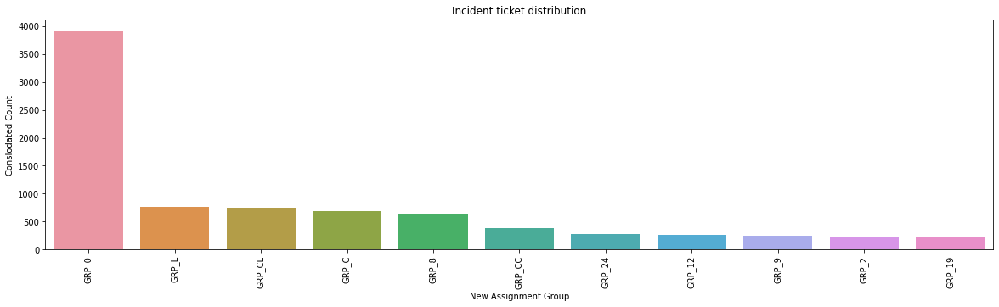

In [ ]:
plt.subplots(figsize = (20,5))

sns.countplot(x='New Assignment group', data=incidents_newset,order = incidents_newset['New Assignment group'].value_counts().index)
plt.xlabel('New Assignment Group') 
plt.ylabel('Conslodated Count') 
plt.xticks(rotation=90)
plt.title('Incident ticket distribution')

plt.show()

In [ ]:
# Lets ignore Group 0 for time being to understand the data spread which is 50% of the data
temp_data_without_grp0 = incidents_newset[incidents_newset["New Assignment group"] != 'GRP_0']
temp_data_without_grp0 

,Short description,Description,Caller,Assignment group,New Assignment group
6,event: critical:HostName_221.company.com the v...,event: critical:HostName_221.company.com the v...,jyoqwxhz clhxsoqy,GRP_1,GRP_L
17,"when undocking pc , screen will not come back","when undocking pc , screen will not come back",sigfdwcj reofwzlm,GRP_3,GRP_CC
32,duplication of network address.,\n\nreceived from: kxsceyzo.naokumlb@gmail.com...,kxsceyzo naokumlb,GRP_4,GRP_C
43,please reroute jobs on printer01 to printer02 ...,\n\nreceived from: yisohglr.uvteflgb@gmail.com...,yisohglr uvteflgb,GRP_5,GRP_CL
47,job Job_1424 failed in job_scheduler at: 10/31...,received from: monitoring_tool@company.com\n\n...,bpctwhsn kzqsbmtp,GRP_6,GRP_CC
...,...,...,...,...,...
8493,"erp fi - ob09, two accounts to be added","i am sorry, i have another two accounts that n...",ipwjorsc uboapexr,GRP_10,GRP_CL
8494,tablet needs reimaged due to multiple issues w...,tablet needs reimaged due to multiple issues w...,cpmaidhj elbaqmtp,GRP_3,GRP_CC
8495,emails not coming in from zz mail,\n\nreceived from: avglmrts.vhqmtiua@gmail.com...,avglmrts vhqmtiua,GRP_29,GRP_C
8498,machine nÃ£o estÃ¡ funcionando,i am unable to access the machine utilities to...,ufawcgob aowhxjky,GRP_62,GRP_L


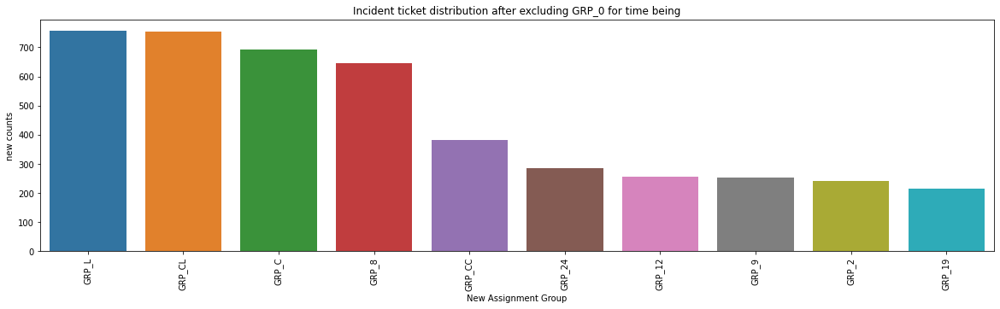

In [ ]:

plt.subplots(figsize = (20,5))

# plt.plot(temp_data_without_grp0["New Assignment group"], order = temp_data_without_grp0['New Assignment group'].value_counts().index) 
sns.countplot(x='New Assignment group', data=temp_data_without_grp0,order = temp_data_without_grp0['New Assignment group'].value_counts().index)
plt.xlabel('New Assignment Group') 
plt.ylabel('new counts') 
plt.xticks(rotation=90)

plt.title('Incident ticket distribution after excluding GRP_0 for time being') 
  

plt.show() 

Merging the short description and the Description columns to Full description column ensuring that the data is not repeated

In [ ]:
incidents_newset['Full Description'] = np.where(incidents_newset['Short description']==incidents_newset['Description'],incidents_newset['Description'], incidents_newset['Short description'] + ' '+ incidents_newset['Description'])

In [ ]:
incidents_newset.head(10)

,Short description,Description,Caller,Assignment group,New Assignment group,Full Description
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,GRP_0,login issue -verified user details.(employee# ...
1,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0,GRP_0,outlook \n\nreceived from: hmjdrvpb.komuaywn@g...
2,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0,GRP_0,cant log in to vpn \n\nreceived from: eylqgodm...
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,GRP_0,unable to access hr_tool page
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,GRP_0,skype error
5,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0,GRP_0,unable to log in to engineering tool and skype
6,event: critical:HostName_221.company.com the v...,event: critical:HostName_221.company.com the v...,jyoqwxhz clhxsoqy,GRP_1,GRP_L,event: critical:HostName_221.company.com the v...
7,ticket_no1550391- employment status - new non-...,ticket_no1550391- employment status - new non-...,eqzibjhw ymebpoih,GRP_0,GRP_0,ticket_no1550391- employment status - new non-...
8,unable to disable add ins on outlook,unable to disable add ins on outlook,mdbegvct dbvichlg,GRP_0,GRP_0,unable to disable add ins on outlook
9,ticket update on inplant_874773,ticket update on inplant_874773,fumkcsji sarmtlhy,GRP_0,GRP_0,ticket update on inplant_874773


In [ ]:
incident_df_final = incidents_newset.drop(columns=['Short description','Description','Caller'])
incident_df_final

,Assignment group,New Assignment group,Full Description
0,GRP_0,GRP_0,login issue -verified user details.(employee# ...
1,GRP_0,GRP_0,outlook \n\nreceived from: hmjdrvpb.komuaywn@g...
2,GRP_0,GRP_0,cant log in to vpn \n\nreceived from: eylqgodm...
3,GRP_0,GRP_0,unable to access hr_tool page
4,GRP_0,GRP_0,skype error
...,...,...,...
8495,GRP_29,GRP_C,emails not coming in from zz mail \n\nreceived...
8496,GRP_0,GRP_0,telephony_software issue
8497,GRP_0,GRP_0,vip2: windows password reset for tifpdchb pedx...
8498,GRP_62,GRP_L,machine nÃ£o estÃ¡ funcionando i am unable to ...


#### Text Pre-processing


In [ ]:
#Remove numbers
def removeNumbers(text):
    """ Removes integers """
    text = ''.join([i for i in text if not i.isdigit()])         
    return text

#Replace Contractions
contraction_patterns = [ (r'won\'t', 'will not'),(r'didn\'t', 'did not'),(r'didnt', 'did not'), (r'can\'t', 'cannot'),(r'cant', 'cannot'), (r'i\'m', 'i am'), (r'ain\'t', 'is not'), (r'(\w+)\'ll', '\g<1> will'), (r'(\w+)n\'t', '\g<1> not'),
                         (r'(\w+)\'ve', '\g<1> have'), (r'(\w+)\'s', '\g<1> is'), (r'(\w+)\'re', '\g<1> are'), (r'(\w+)\'d', '\g<1> would'), (r'&', 'and'), (r'dammit', 'damn it'), (r'dont', 'do not'), (r'wont', 'will not') ]
def replaceContraction(text):
    patterns = [(re.compile(regex), repl) for (regex, repl) in contraction_patterns]
    for (pattern, repl) in patterns:
        (text, count) = re.subn(pattern, repl, text)
    return text

#Remove Stopwords
stoplist = stopwords.words('english')
stoplist.remove('no')
stoplist.remove('not')
def stp_words(text):
    finalTokens = []
    tokens = nltk.word_tokenize(text)
    for w in tokens:
        if (w not in stoplist):
            finalTokens.append(w)
    text = " ".join(finalTokens)
    return text


#Remove mail related words
mail_words_list = ['hi','hello','com','gmail','cc','regards','thanks','xd','xf','x']
def mail_words(text):
    finalTokens = []
    tokens = nltk.word_tokenize(text)
    for w in tokens:
        if (w not in mail_words_list):
            finalTokens.append(w)
    text = " ".join(finalTokens)
    return text

remove_words_list = ['please','yes','no','na','per','sorry','wait','confirm','need','ticket','unable','able','user','usa','die','please','whenever','try','say','may','use','see','pm','am']
def remove_words(text):
    finalTokens = []
    tokens = nltk.word_tokenize(text)
    for w in tokens:
        if (w not in remove_words_list):
            finalTokens.append(w)
    text = " ".join(finalTokens)
    return text


#Lemmatization
stemmer = PorterStemmer() #set stemmer
lemmatizer = WordNetLemmatizer() # set lemmatizer

# function to convert nltk tag to wordnet tag
def nltk_tag_to_wordnet_tag(nltk_tag):
    if nltk_tag.startswith('J'):
        return wordnet.ADJ
    elif nltk_tag.startswith('V'):
        return wordnet.VERB
    elif nltk_tag.startswith('N'):
        return wordnet.NOUN
    elif nltk_tag.startswith('R'):
        return wordnet.ADV
    else:          
        return None

def lemmatize_sentence(sentence):
    #tokenize the sentence and find the POS tag for each token
    nltk_tagged = nltk.pos_tag(nltk.word_tokenize(sentence))  
    #tuple of (token, wordnet_tag)
    wordnet_tagged = map(lambda x: (x[0], nltk_tag_to_wordnet_tag(x[1])), nltk_tagged)
    lemmatized_sentence = []
    for word, tag in wordnet_tagged:
        if tag is None:
            #if there is no available tag, append the token as is
            lemmatized_sentence.append(word)
        else:        
            #else use the tag to lemmatize the token
            lemmatized_sentence.append(lemmatizer.lemmatize(word, tag))
    return " ".join(lemmatized_sentence)

#Remove accented characters
def remove_accented_chars(text):
    text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')
    return text

In [ ]:
import socket
timeout_in_sec = 60*4 # 3 minutes timeout limit
socket.setdefaulttimeout(timeout_in_sec)

In [ ]:
i=0
for index, row in incident_df_final.iterrows():
    i=i+1
    # remove numbers
    inc_desc = removeNumbers(row['Full Description'])
    
    #convert to lower case
    inc_desc = inc_desc.lower()

    #replace contractions
    inc_desc = replaceContraction(inc_desc)

    inc_desc = re.sub(r"\W", " ", inc_desc, flags=re.I)
    inc_desc = inc_desc.replace('_',' ')
    inc_desc = re.sub(r'https?:\/\/.*[\r\n]*', '', inc_desc, flags=re.MULTILINE)
    inc_desc = re.sub(r'\<a href', ' ', inc_desc)
    inc_desc = re.sub(r'&amp;', '', inc_desc)
    inc_desc = re.sub(r'[_"\-;%()|+&=*%.,!?:#$@\[\]/]', ' ', inc_desc)
    inc_desc = re.sub(r'<br />', ' ', inc_desc)
    inc_desc = re.sub(r'\'', ' ', inc_desc)
    cleanr = re.compile('<.*?>')
    inc_desc = re.sub(cleanr, ' ', inc_desc)        #Removing HTML tags
    inc_desc = re.sub(r'\'', '', inc_desc, re.I|re.A)
    inc_desc = re.sub(r'[^a-zA-Z0-9\s]', ' ', inc_desc)
    inc_desc = re.sub(r"\s\s+",' ',inc_desc)

    #remove accents
    inc_desc = remove_accented_chars(inc_desc)

    gtd = translator.detect(incident_df_final.loc[index, 'Full Description'])
    lang = gtd.lang
    if (isinstance(gtd.lang, list)):
      language  = lang[0]
    else:
      language  = lang
    if ( (language != 'en') and (len(inc_desc) !=0 ) ):
        # print('index : ', index, '; orig text : ', inc_desc)
        if ( index != 3453):
          inc_desc = translator.translate(inc_desc).text
          # print('index : ', index, '; trans text : ', inc_desc)
          language = 'en'
    ########## getting some error while calling google translate method for row 3453 that some values are null/empty
    
    #remove stopwords
    inc_desc = stp_words(inc_desc)
    
    #remove mail related words
    inc_desc = mail_words(inc_desc)

    #remove other words
    inc_desc = remove_words(inc_desc)

    #lemmatization
    inc_desc = lemmatize_sentence(inc_desc)
    
    #remove mail related words
    inc_desc = mail_words(inc_desc)

    #remove mail related words
    inc_desc = remove_words(inc_desc)

    #create new column and add updated data
    incident_df_final.at[index, 'Full Description - After Lemmatized']= inc_desc
    incident_df_final.at[index, 'Language']= language

    # incident_df_final.at[index, 'Lang detect confidence']= gtd.confidence
    if (index%1000==0): print('********Crossed :', index)

## this takes roughly 8 minutes to complete

********Crossed : 0
********Crossed : 1000
********Crossed : 3000
********Crossed : 4000
********Crossed : 5000
********Crossed : 6000
********Crossed : 7000
********Crossed : 8000


In [ ]:
# 3453  - this data has some issue with the language identification and translation, hence ignoring this for time being


In [ ]:
incident_df_final

,Assignment group,New Assignment group,Full Description,Full Description - After Lemmatized,Language
0,GRP_0,GRP_0,login issue -verified user details.(employee# ...,login issue verify detail employee manager nam...,en
1,GRP_0,GRP_0,outlook \n\nreceived from: hmjdrvpb.komuaywn@g...,outlook receive hmjdrvpb komuaywn team meeting...,en
2,GRP_0,GRP_0,cant log in to vpn \n\nreceived from: eylqgodm...,not log vpn receive eylqgodm ybqkwiam not log ...,en
3,GRP_0,GRP_0,unable to access hr_tool page,access hr tool page,en
4,GRP_0,GRP_0,skype error,skype error,en
...,...,...,...,...,...
8495,GRP_29,GRP_C,emails not coming in from zz mail \n\nreceived...,email not come zz mail receive avglmrts vhqmti...,en
8496,GRP_0,GRP_0,telephony_software issue,telephony software issue,en
8497,GRP_0,GRP_0,vip2: windows password reset for tifpdchb pedx...,vip window password reset tifpdchb pedxruyf,en
8498,GRP_62,GRP_L,machine nÃ£o estÃ¡ funcionando i am unable to ...,machine n est funcionando access machine utili...,en


In [ ]:
incident_df_final['Language'].nunique

<bound method IndexOpsMixin.nunique of 0       en
1       en
2       en
3       en
4       en
        ..
8495    en
8496    en
8497    en
8498    en
8499    en
Name: Language, Length: 8407, dtype: object>

In [ ]:
incident_df_final['Language'].value_counts()

en    8407
Name: Language, dtype: int64

All the rows that were non English are translated to English

In [ ]:
ins_grpby_lang = incident_df_final.groupby(['New Assignment group','Language']).size().reset_index(name='Lang_AssGrp counts')
# ins_grpby_lang = incident_df_final.groupby(['Language','New Assignment group','Assignment group']).size().reset_index(name='Lang_AssGrp counts')

# ins_grpby_lang[(ins_grpby_lang['Language']!='en') and (ins_grpby_lang['New Assignment group']!='GRP_0')  ]
ins_grpby_lang[(ins_grpby_lang['Language']!='en') ]

,New Assignment group,Language,Lang_AssGrp counts


In [ ]:
ins_grpby_lang['New Assignment group'].nunique

<bound method IndexOpsMixin.nunique of 0      GRP_0
1     GRP_12
2     GRP_19
3      GRP_2
4     GRP_24
5      GRP_8
6      GRP_9
7      GRP_C
8     GRP_CC
9     GRP_CL
10     GRP_L
Name: New Assignment group, dtype: object>

In [ ]:
incident_df_final.shape


(8407, 5)

In [ ]:
## Additional Text Cleaning
## a lot of rows  have junk characters (tried UTF-8 decoding but it aint worked), indicating that the characters are junk 
## Tried regular expression it did not remove all the junk characters
## Also, lemmatization of these junk characters are with blank array. So, we can do the below to remove the rows with junk characters

incident_df_final = incident_df_final[incident_df_final['Full Description - After Lemmatized'].map(lambda d: len(d)) > 0]

In [ ]:
incident_df_final.shape

(8407, 5)

In [ ]:
incident_df_final.head(10)

,Assignment group,New Assignment group,Full Description,Full Description - After Lemmatized,Language
0,GRP_0,GRP_0,login issue -verified user details.(employee# ...,login issue verify detail employee manager nam...,en
1,GRP_0,GRP_0,outlook \n\nreceived from: hmjdrvpb.komuaywn@g...,outlook receive hmjdrvpb komuaywn team meeting...,en
2,GRP_0,GRP_0,cant log in to vpn \n\nreceived from: eylqgodm...,not log vpn receive eylqgodm ybqkwiam not log ...,en
3,GRP_0,GRP_0,unable to access hr_tool page,access hr tool page,en
4,GRP_0,GRP_0,skype error,skype error,en
5,GRP_0,GRP_0,unable to log in to engineering tool and skype,log engineering tool skype,en
6,GRP_1,GRP_L,event: critical:HostName_221.company.com the v...,event critical hostname company value mountpoi...,en
7,GRP_0,GRP_0,ticket_no1550391- employment status - new non-...,employment status new non employee enter name,en
8,GRP_0,GRP_0,unable to disable add ins on outlook,disable add in outlook,en
9,GRP_0,GRP_0,ticket update on inplant_874773,update inplant,en


Write the data into a CSV file for a quick start skipping the EDA and feature engineering steps everytime. 

In [ ]:
os.chdir('/content/drive/MyDrive/Colab Notebooks/00_Capstone Project/')
incident_df_final.to_csv('Incident_final_dataset.csv',index = False)

### Skip to this point to avoid repeating the EDA part everytime

In [ ]:
# Read the data from csv file
incident_df_final = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/00_Capstone Project/Incident_final_dataset.csv')

In [ ]:
stopwords = set(STOPWORDS)
## function to create Word Cloud

def build_wordcloud(grpvalstr,maxwords,goto_sublevel):
    if(goto_sublevel):
      data = incident_df_final['Full Description - After Lemmatized'][incident_df_final['Assignment group'].isin([grpvalstr])].tolist()
    else: 
    # grpvalstr = "GRP_"+str(grpvalue)
      data = incident_df_final['Full Description - After Lemmatized'][incident_df_final['New Assignment group'].isin([grpvalstr])].tolist()
    wordcloud = WordCloud(
        background_color='black',
        stopwords=stopwords,
        max_words=maxwords,
        max_font_size=40, 
        scale=3,
        random_state=1 
    ).generate(str(data))
    return(wordcloud)

def show_wordcloud(wordcloud,grpvalstr):
    print(wordcloud.words_)
    print('\n')

    fig = plt.figure(1, figsize=(20, 10),facecolor='k')
    plt.axis('off')
    plt.title("Most frequent words iN " + grpvalstr +" AFTER PREPROCESSING", fontsize=20,color='white') 
    # fig.suptitle(title, fontsize=20)
    # fig.subplots_adjust(top=2.3)
    plt.imshow(wordcloud)
    plt.show()
    print('\n')
    

In [ ]:
incidentnewset_groupby_NewAssignemntgrp['New Assignment group'].unique

<bound method Series.unique of 0      GRP_0
1     GRP_12
2     GRP_19
3      GRP_2
4     GRP_24
5      GRP_8
6      GRP_9
7      GRP_C
8     GRP_CC
9     GRP_CL
10     GRP_L
Name: New Assignment group, dtype: object>

#### Word Cloud

{'receive': 1.0, 'access': 0.7428115015974441, 'outlook': 0.549520766773163, 'erp sid': 0.4488817891373802, 'email': 0.43130990415335463, 'work': 0.41533546325878595, 'erp': 0.4009584664536741, 'company': 0.39456869009584666, 'reset password': 0.38338658146964855, 'password reset': 0.3817891373801917, 'cid image': 0.3801916932907348, 'open': 0.3498402555910543, 'help': 0.29073482428115016, 'engineering tool': 0.28753993610223644, 'connect': 0.28594249201277955, "password reset'": 0.2795527156549521, 'log': 0.2747603833865815, 'password management': 0.26038338658146964, 'name': 0.25559105431309903, 'error': 0.2476038338658147}




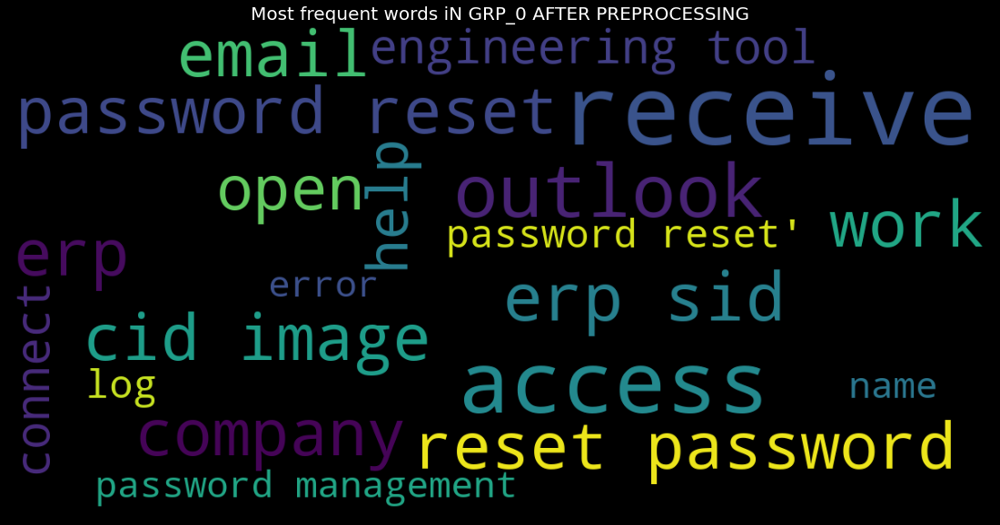

In [ ]:
# view word cloud for GRP_0
grpvalue = 0

grpvalstr = "GRP_"+str(grpvalue)
wordcloud = build_wordcloud(grpvalstr,20,False)
show_wordcloud(wordcloud,grpvalstr)

{'hostname': 1.0, 'server': 0.59375, 'drive': 0.46875, 'asa deny': 0.4375, 'deny tcp': 0.4375, 'tcp src': 0.4375, 'src inside': 0.4375, 'inside dst': 0.4375, 'dst outside': 0.4375, 'outside access': 0.4375}




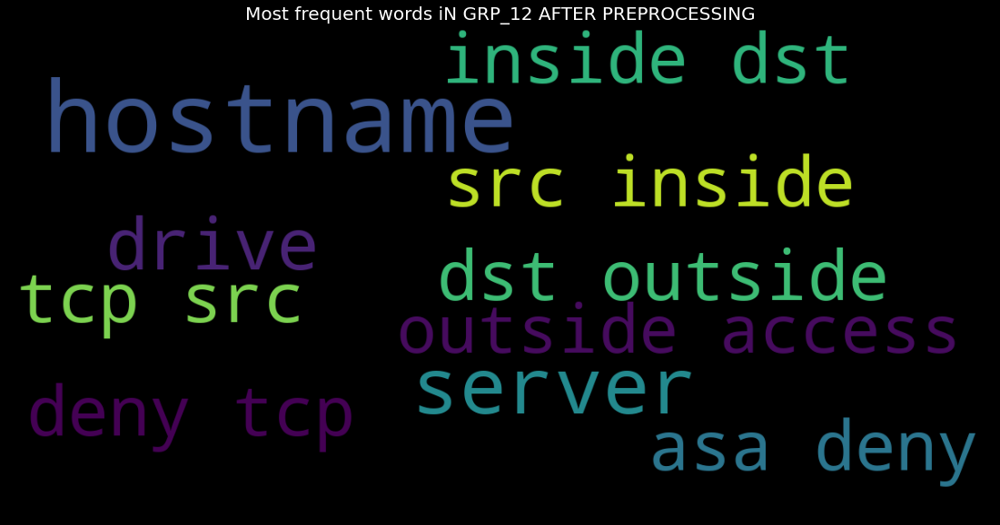



{'laptop': 1.0, 'work': 0.6705882352941176, 'receive': 0.6235294117647059, 'issue': 0.5176470588235295, 'system': 0.4588235294117647, 'help': 0.38823529411764707, 'connect': 0.3764705882352941, 'name': 0.32941176470588235, 'pc': 0.32941176470588235, 'company': 0.29411764705882354}




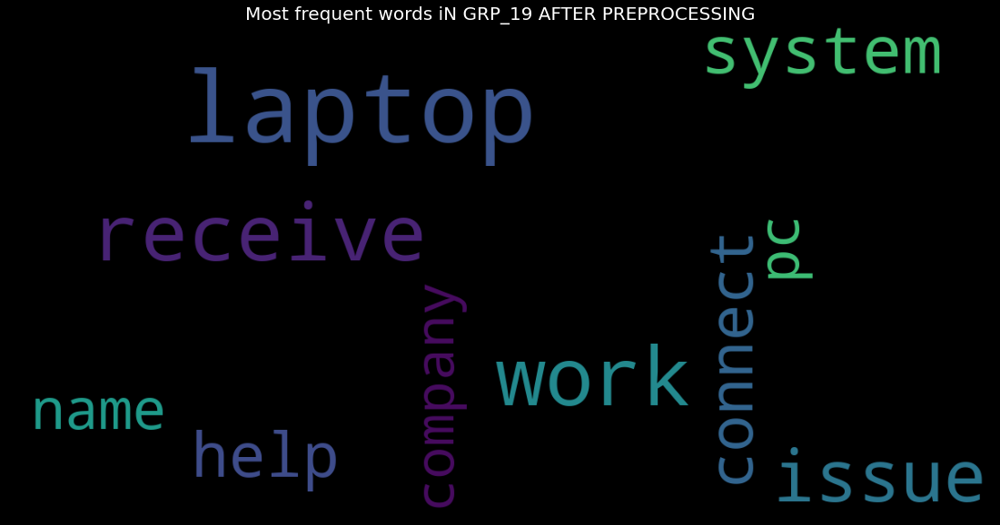



{'sid sid': 1.0, 'id event': 0.819047619047619, 'asa deny': 0.6952380952380952, 'deny tcp': 0.6761904761904762, 'tcp src': 0.6761904761904762, 'src inside': 0.6761904761904762, 'inside dst': 0.6761904761904762, 'access group': 0.6761904761904762, 'group acl': 0.6761904761904762, 'acl inside': 0.6571428571428571}




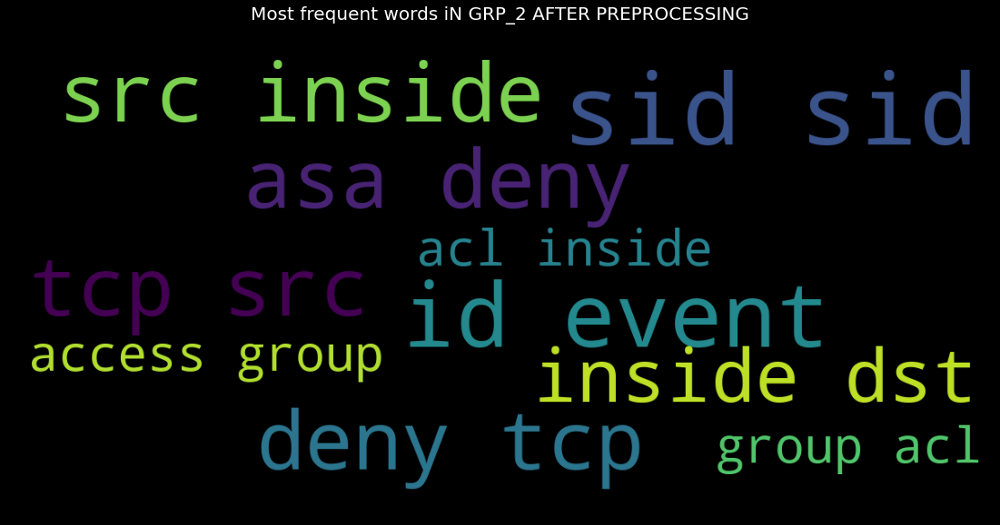



{'problem': 1.0, 'setup new': 0.5211267605633803, 'ewew': 0.36619718309859156, 'install': 0.352112676056338, 'computer': 0.30985915492957744, 'eu tool': 0.29577464788732394, 'printer': 0.2676056338028169, 'defective': 0.2676056338028169, 'work': 0.2535211267605634, 'probleme mit': 0.2535211267605634}




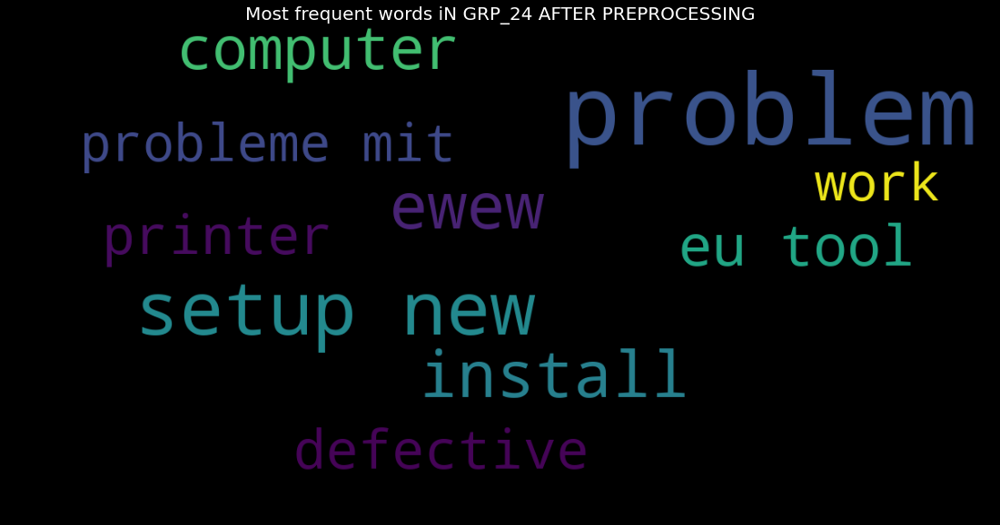



{'fail job': 1.0, 'job job': 0.7534456355283308, 'job scheduler': 0.7044410413476263, 'backup circuit': 0.6385911179173047, 'tool company': 0.6125574272588055, 'job fail': 0.5819295558958653, 'receive monitoring': 0.5620214395099541, 'monitoring tool': 0.5620214395099541, 'scheduler receive': 0.5298621745788668, "job scheduler'": 0.5283307810107197}




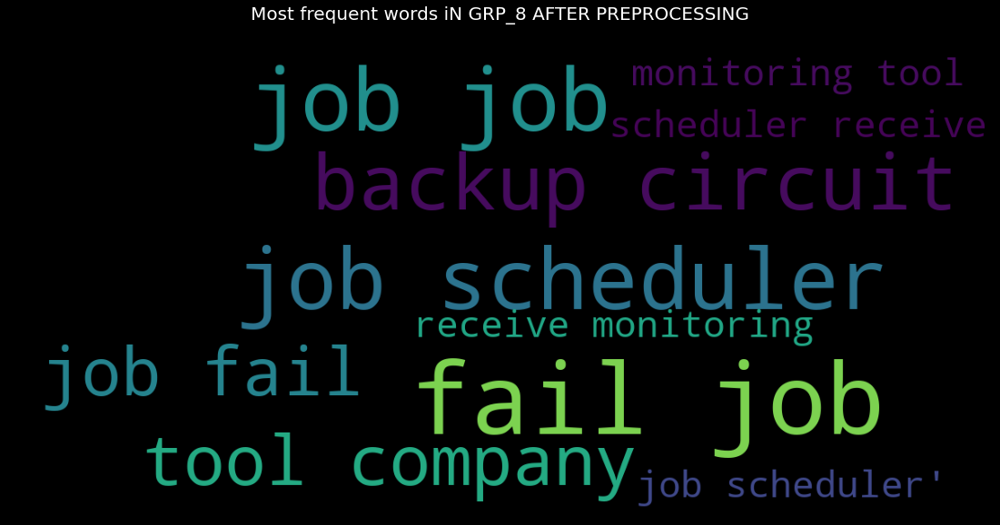



{'job job': 1.0, 'fail job': 0.9216867469879518, 'job fail': 0.7951807228915663, 'job scheduler': 0.6475903614457831, 'tool company': 0.5542168674698795, 'receive monitoring': 0.463855421686747, 'monitoring tool': 0.463855421686747, 'scheduler receive': 0.4608433734939759, 'company job': 0.4608433734939759, "job scheduler'": 0.4608433734939759}




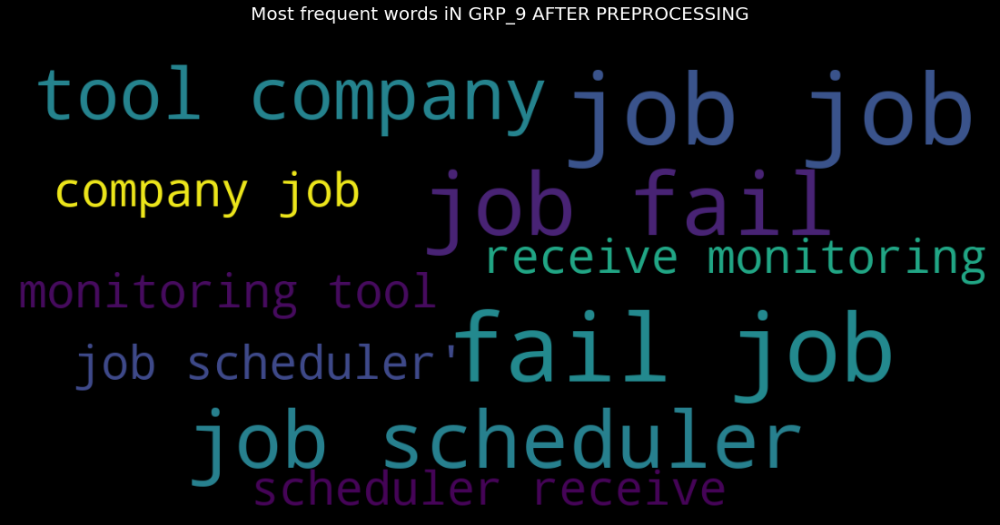

In [ ]:
# view word cloud for GRP_12
grpvalue = 12
grpvalstr = "GRP_"+str(grpvalue)
wordcloud = build_wordcloud(grpvalstr,10,False)
show_wordcloud(wordcloud,grpvalstr)

# view word cloud for GRP_19
grpvalue = 19
grpvalstr = "GRP_"+str(grpvalue)
wordcloud = build_wordcloud(grpvalstr,10,False)
show_wordcloud(wordcloud,grpvalstr)

# view word cloud for GRP_2
grpvalue = 2
grpvalstr = "GRP_"+str(grpvalue)
wordcloud = build_wordcloud(grpvalstr,10,False)
show_wordcloud(wordcloud,grpvalstr)

# view word cloud for GRP_24
grpvalue = 24
grpvalstr = "GRP_"+str(grpvalue)
wordcloud = build_wordcloud(grpvalstr,10,False)
show_wordcloud(wordcloud,grpvalstr)

# view word cloud for GRP_8
grpvalue = 8
grpvalstr = "GRP_"+str(grpvalue)
wordcloud = build_wordcloud(grpvalstr,10,False)
show_wordcloud(wordcloud,grpvalstr)

# view word cloud for GRP_9
grpvalue = 9
grpvalstr = "GRP_"+str(grpvalue)
wordcloud = build_wordcloud(grpvalstr,10,False)
show_wordcloud(wordcloud,grpvalstr)


In [ ]:
assignmentgrp_L = incident_df_final['Assignment group'][incident_df_final['New Assignment group'].isin(['GRP_L'])].unique()
assignmentgrp_L

array(['GRP_1', 'GRP_11', 'GRP_15', 'GRP_20', 'GRP_21', 'GRP_22',
       'GRP_23', 'GRP_27', 'GRP_28', 'GRP_30', 'GRP_35', 'GRP_36',
       'GRP_37', 'GRP_38', 'GRP_39', 'GRP_40', 'GRP_41', 'GRP_42',
       'GRP_43', 'GRP_44', 'GRP_45', 'GRP_46', 'GRP_47', 'GRP_49',
       'GRP_50', 'GRP_51', 'GRP_52', 'GRP_53', 'GRP_54', 'GRP_55',
       'GRP_48', 'GRP_56', 'GRP_57', 'GRP_58', 'GRP_59', 'GRP_60',
       'GRP_61', 'GRP_32', 'GRP_62', 'GRP_63', 'GRP_64', 'GRP_65',
       'GRP_66', 'GRP_67', 'GRP_68', 'GRP_69', 'GRP_70', 'GRP_71',
       'GRP_72', 'GRP_73'], dtype=object)

In [ ]:
wordsby_grp_L = pd.DataFrame(columns = ['New Group', 'Orig Group','Top Words'])
wordsby_grp_C = pd.DataFrame(columns = ['New Group', 'Orig Group','Top Words'])
wordsby_grp_CL = pd.DataFrame(columns = ['New Group', 'Orig Group','Top Words'])
wordsby_grp_CC = pd.DataFrame(columns = ['New Group', 'Orig Group','Top Words'])

{'hostname': 1.0, 'space consume': 0.8823529411764706, 'consume space': 0.8235294117647058, 'job': 0.7058823529411765, 'space available': 0.7058823529411765, 'sid': 0.6470588235294118, 'fail': 0.5882352941176471, 'data': 0.5294117647058824, 'dev sid': 0.5294117647058824, 'hostname volume': 0.5294117647058824}




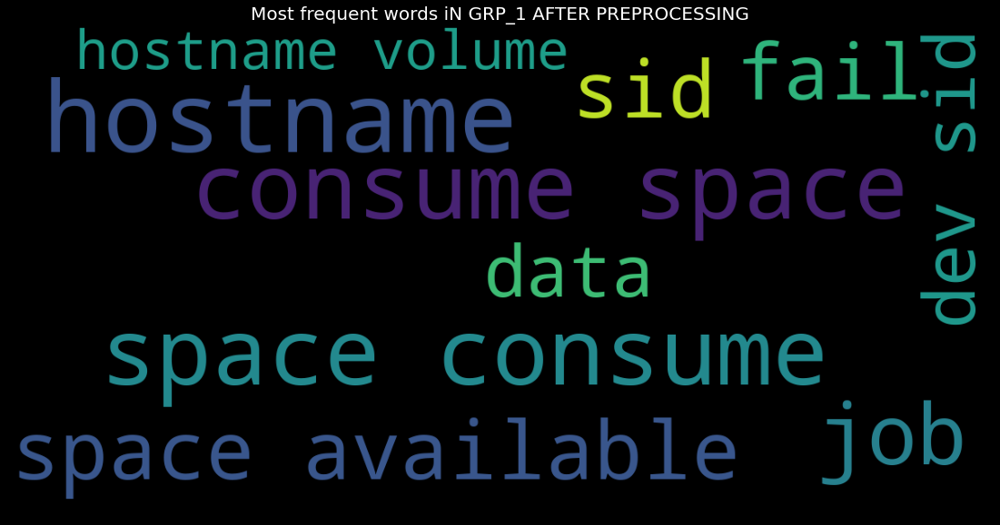



{'engineering tool': 1.0, 'erp': 0.88, 'work': 0.56, 'draw': 0.52, 'plm': 0.44, 'material': 0.44, 'npc': 0.4, 'issue': 0.4, 'show': 0.36, 'error': 0.36}




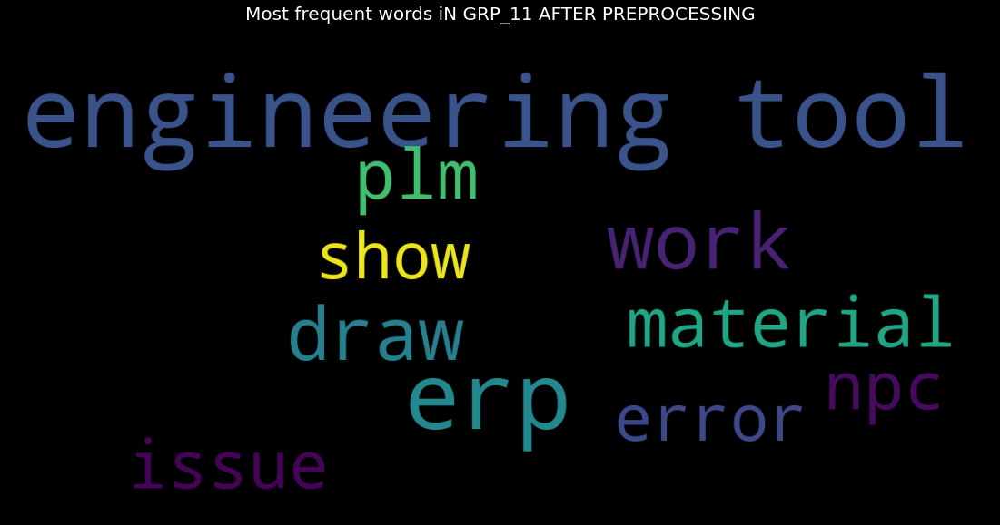



{'crm': 1.0, 'receive': 0.47368421052631576, 'erp crm': 0.47368421052631576, 'email': 0.4473684210526316, 'account': 0.39473684210526316, 'employee': 0.3684210526315789, 'data': 0.34210526315789475, 'customer': 0.2894736842105263, 'issue': 0.2894736842105263, 'advise': 0.2894736842105263}




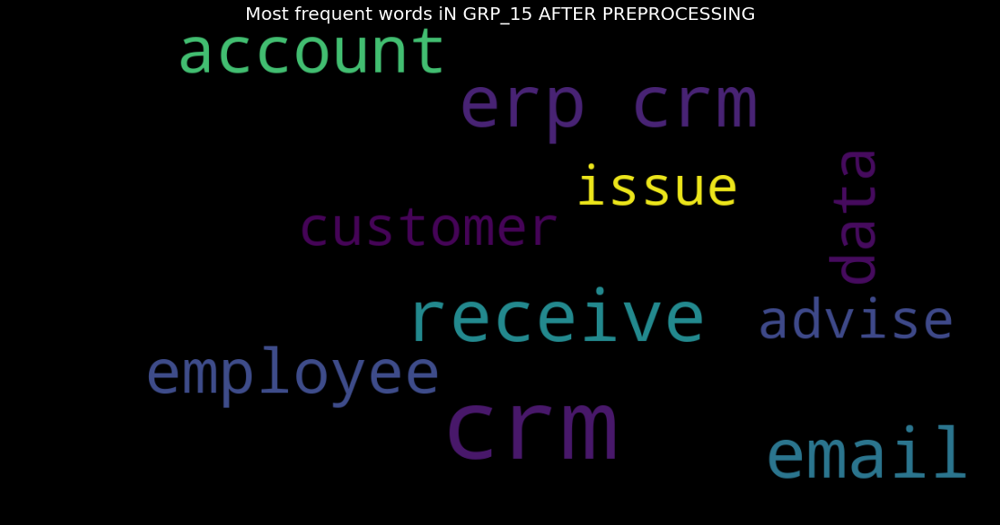



{'erp': 1.0, 'change': 0.9375, 'send': 0.8125, 'data': 0.75, 'tool': 0.75, 'save': 0.75, 'work': 0.6875, 'email': 0.6875, 'ship': 0.6875, 'order': 0.625}




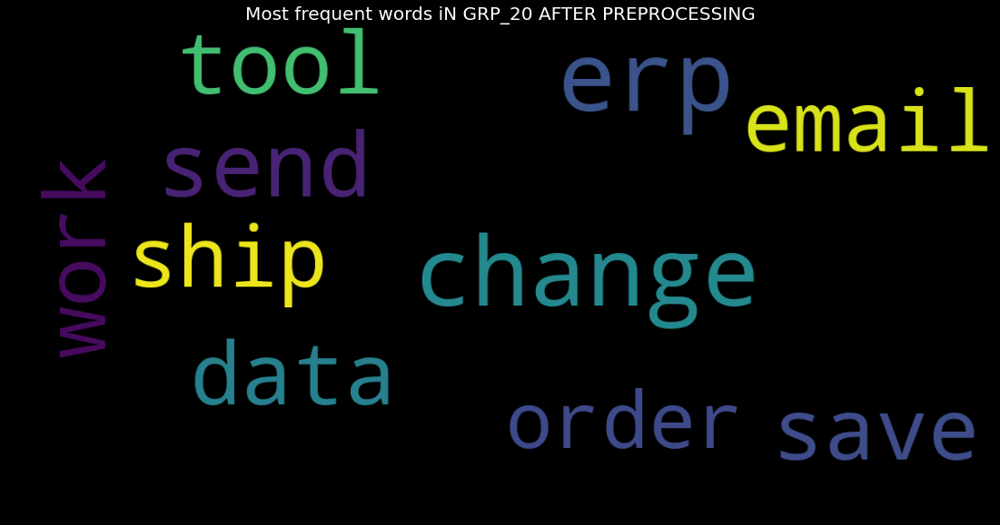



{'distributor tool': 1.0, 'price': 0.5882352941176471, 'issue': 0.5882352941176471, 'report': 0.5882352941176471, 'quote': 0.5882352941176471, 'change': 0.5294117647058824, 'customer': 0.5294117647058824, 'company center': 0.5294117647058824, 'sale': 0.4117647058823529, 'erp': 0.4117647058823529}




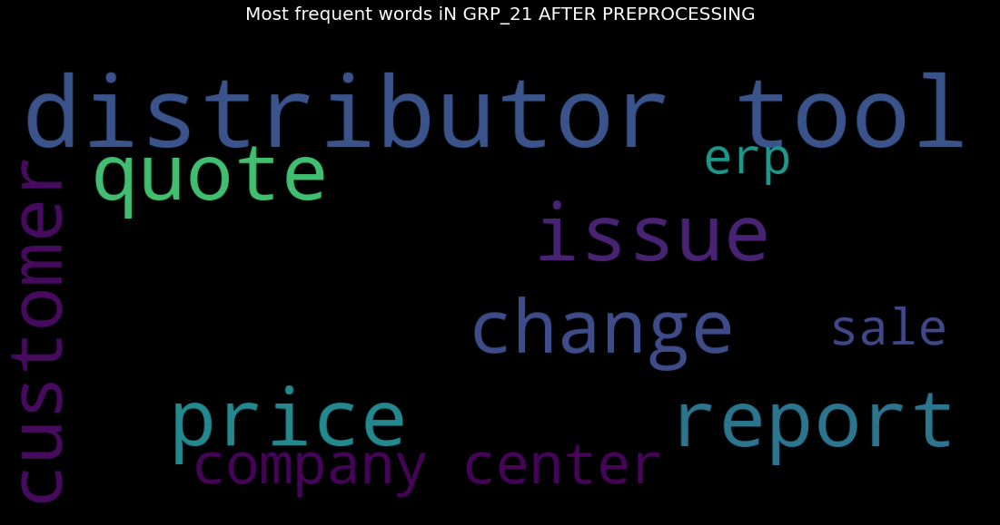



{'crm': 1.0, 'access': 0.3617021276595745, 'receive': 0.2765957446808511, 'error': 0.23404255319148937, 'contact': 0.2127659574468085, 'issue': 0.2127659574468085, 'account': 0.1702127659574468, 'dynamic': 0.14893617021276595, 'adoption': 0.14893617021276595, 'outlook': 0.1276595744680851}




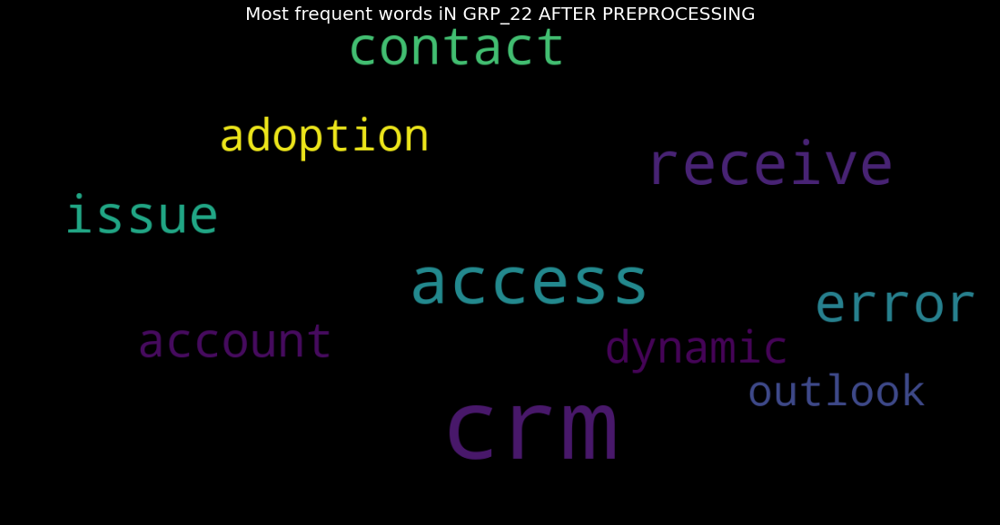



{'ethic': 1.0, 'company': 0.7, 'course': 0.6333333333333333, 'receive': 0.6333333333333333, 'ethic train': 0.5333333333333333, 'access': 0.36666666666666664, 'login ethic': 0.3, 'site': 0.26666666666666666, 'error': 0.26666666666666666, 'portal': 0.23333333333333334}




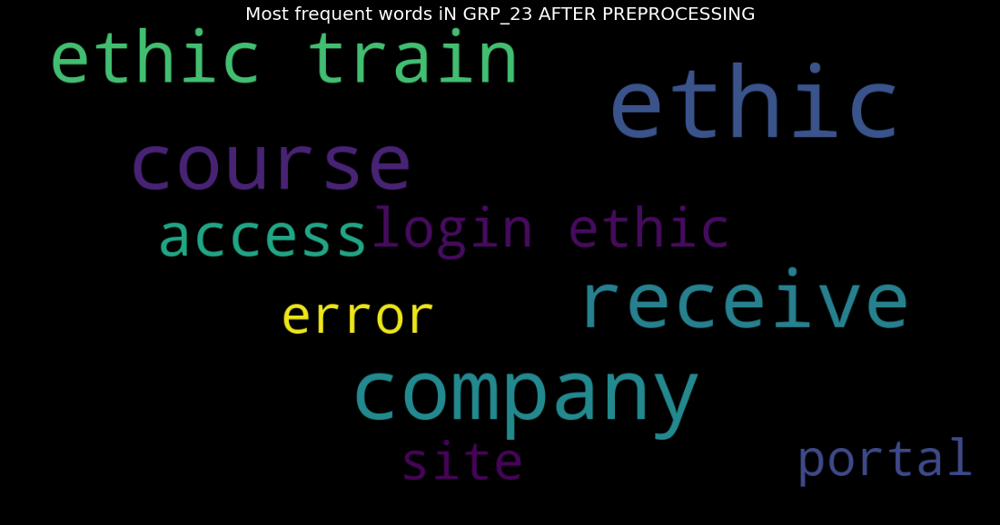



{'login': 1.0, 'outlook': 0.8571428571428571, 'skype': 0.8571428571428571, 'access': 0.8571428571428571, 'email': 0.7142857142857143, 'meeting': 0.5714285714285714, 'receive': 0.5714285714285714, 'pc': 0.5714285714285714, 'password': 0.5714285714285714, 'spam': 0.5714285714285714}




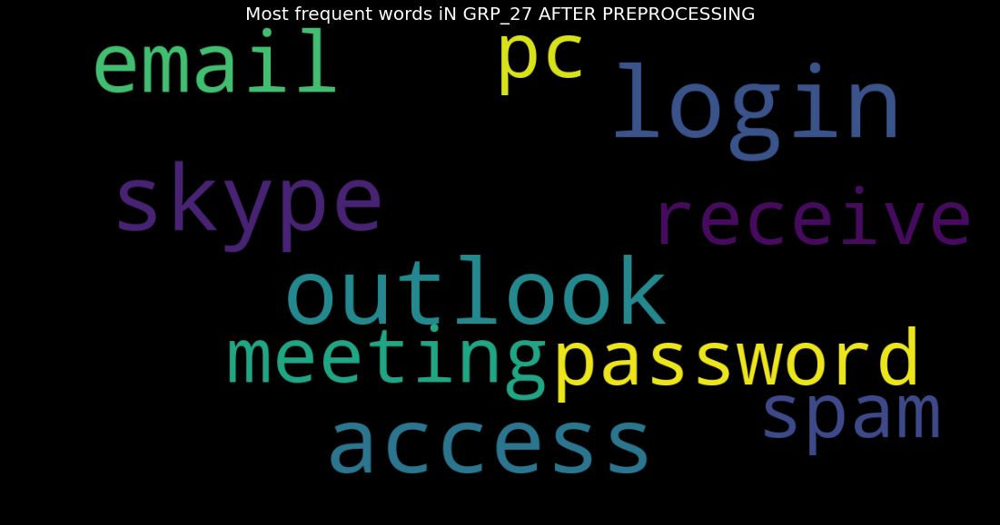



{'receive': 1.0, 'new': 0.5882352941176471, 'company': 0.5882352941176471, 'th': 0.5882352941176471, 'help': 0.5294117647058824, 'germany': 0.47058823529411764, 'team': 0.47058823529411764, 'pc': 0.4117647058823529, 'erp': 0.35294117647058826, 'computer': 0.35294117647058826}




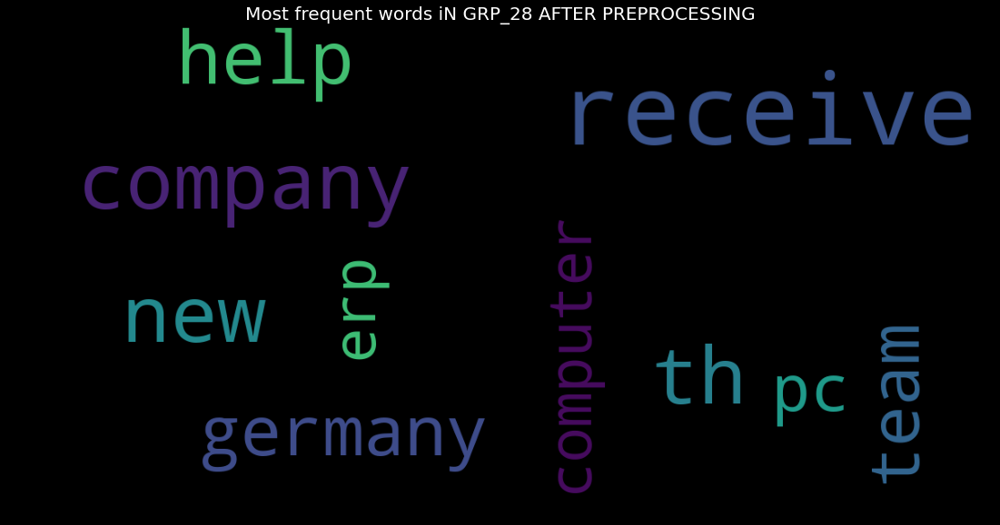



{'tuqrvowp fxmzkvqo': 1.0, 'event': 0.8333333333333334, 'pro pz': 0.5833333333333334, 'pz dn': 0.5833333333333334, 'dn ie': 0.5833333333333334, 'ie sogou': 0.5833333333333334, 'sogou sogou': 0.5833333333333334, 'sogou explorer': 0.5833333333333334, 'explorer exe': 0.5833333333333334, 'receive': 0.4166666666666667}




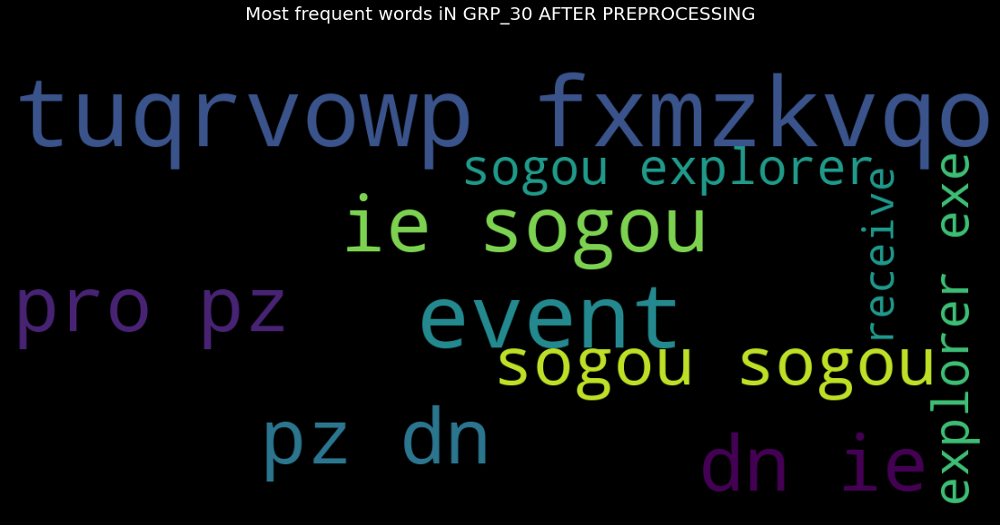



{'access': 1.0, 'kp': 0.5, 'erp': 0.25, 'enter': 0.25, 'forecast': 0.25, 'cost': 0.25, 'center': 0.25, 'request': 0.25, 'receive': 0.25, 'end': 0.25}




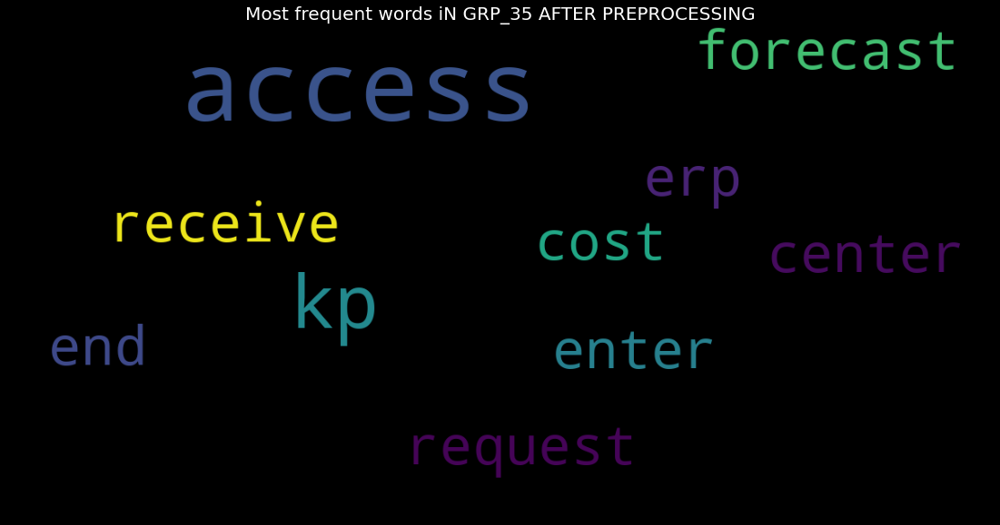



{'tool': 1.0, 'uacyltoe hxgayczeing': 0.75, 'time card': 0.625, 'timecard': 0.5, 'access': 0.5, 'uacyltoe': 0.375, "ignore'": 0.375, 'miss': 0.375, 'change supervisor': 0.375, 'supervisor name': 0.375}




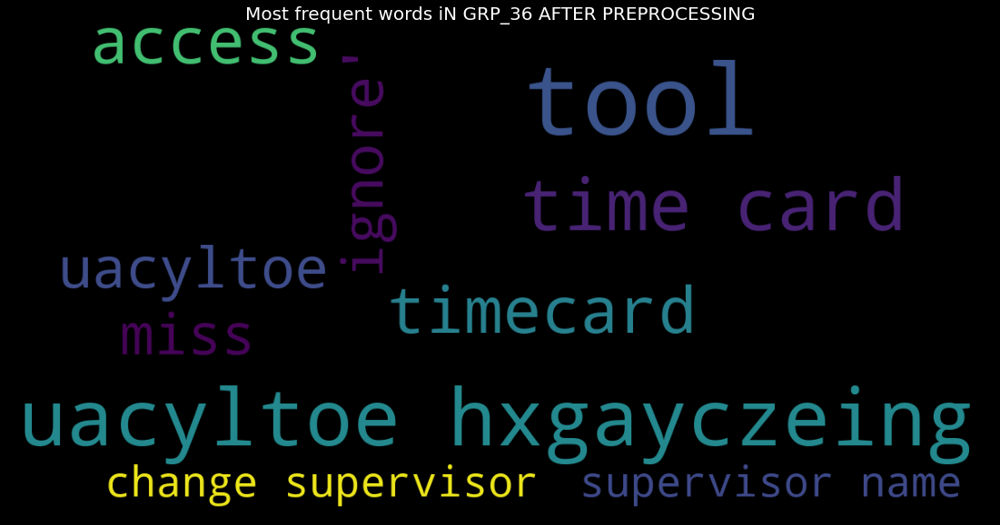



{'call': 1.0, 'phone': 1.0, 'work': 0.7272727272727273, 'number': 0.6363636363636364, 'facility': 0.45454545454545453, 'dial': 0.45454545454545453, 'receive': 0.36363636363636365, 'pbx': 0.36363636363636365, 'id': 0.36363636363636365, 'cwuospin': 0.36363636363636365}




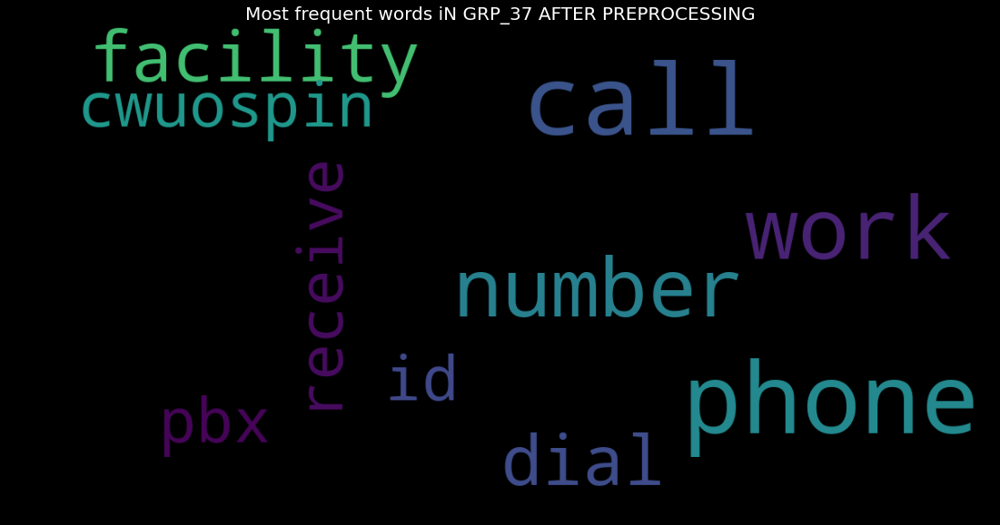



{'hpqc': 1.0, 'delete': 0.8, 'charm': 0.8, 'error': 0.4, 'message': 0.4, 'maintain': 0.4, 'project': 0.4, 'fy': 0.4, 'release': 0.4, 'contact': 0.4}




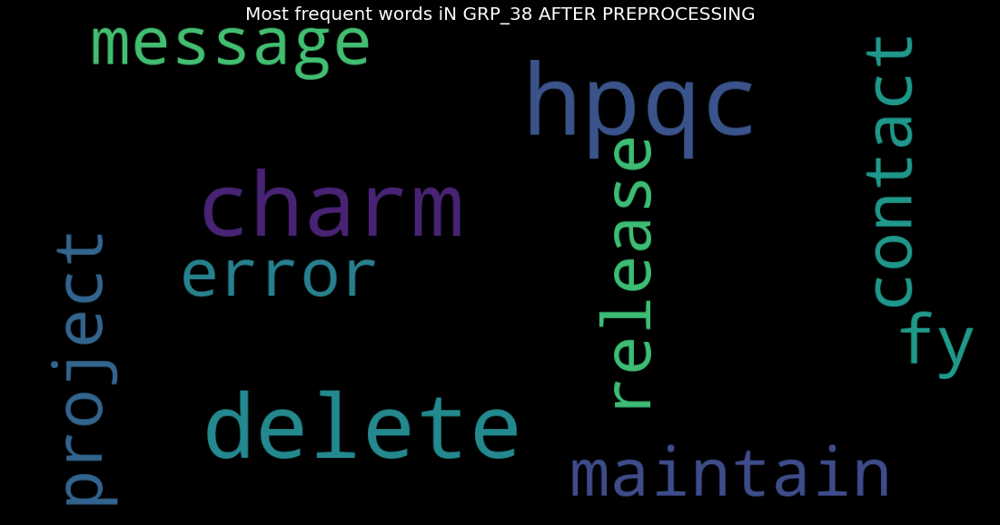



{'hostname': 1.0, 'event': 1.0, 'device': 0.75, 'space consume': 0.6875, 'consume space': 0.6875, 'space available': 0.6875, 'event id': 0.625, 'ip': 0.5625, 'id event': 0.5625, 'source': 0.5}




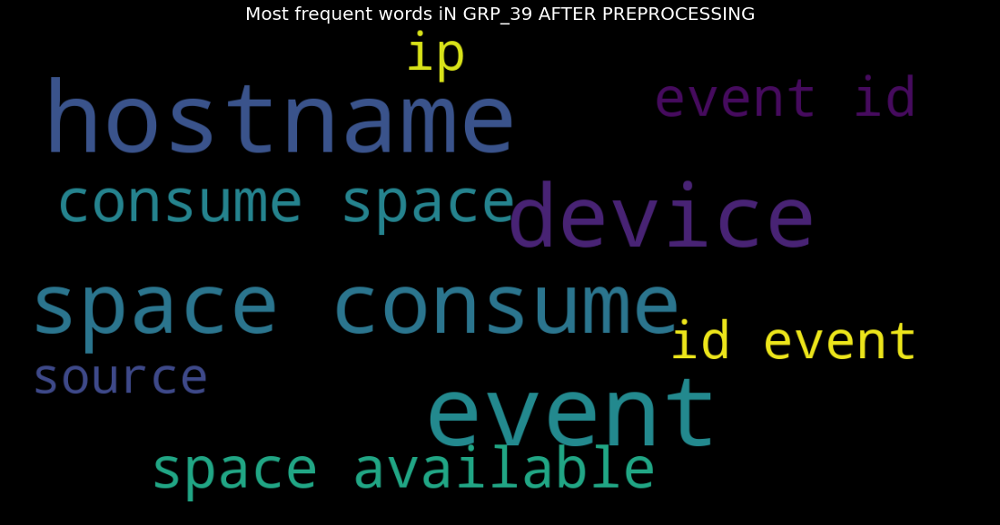



{'crm': 1.0, 'account': 0.7205882352941176, 'error': 0.2647058823529412, 'erp': 0.23529411764705882, 'issue': 0.23529411764705882, 'create': 0.23529411764705882, 'dynamic': 0.19117647058823528, 'company': 0.19117647058823528, 'show': 0.17647058823529413, 'customer': 0.16176470588235295}




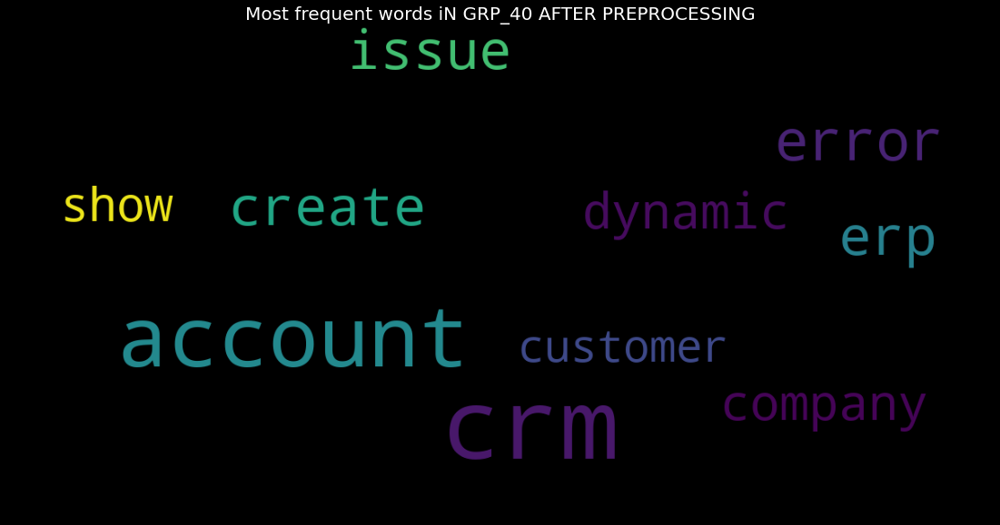



{'mii': 1.0, 'order': 0.7111111111111111, 'erp': 0.5333333333333333, 'error': 0.4222222222222222, 'operator': 0.4, 'machine': 0.4, 'show': 0.37777777777777777, 'status': 0.37777777777777777, 'log': 0.3111111111111111, 'work center': 0.3111111111111111}




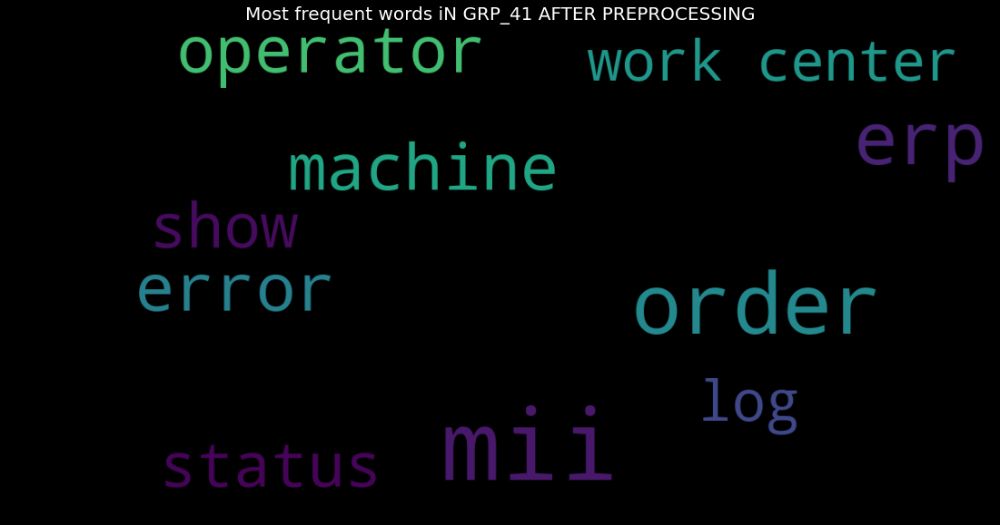



{'printer': 1.0, 'print': 0.7222222222222222, 'defective': 0.5555555555555556, 'pc': 0.5, 'printer em': 0.5, 'error': 0.4444444444444444, 'em': 0.3888888888888889, 'work': 0.3888888888888889, 'pc eemw': 0.3888888888888889, 'barcode': 0.3333333333333333}




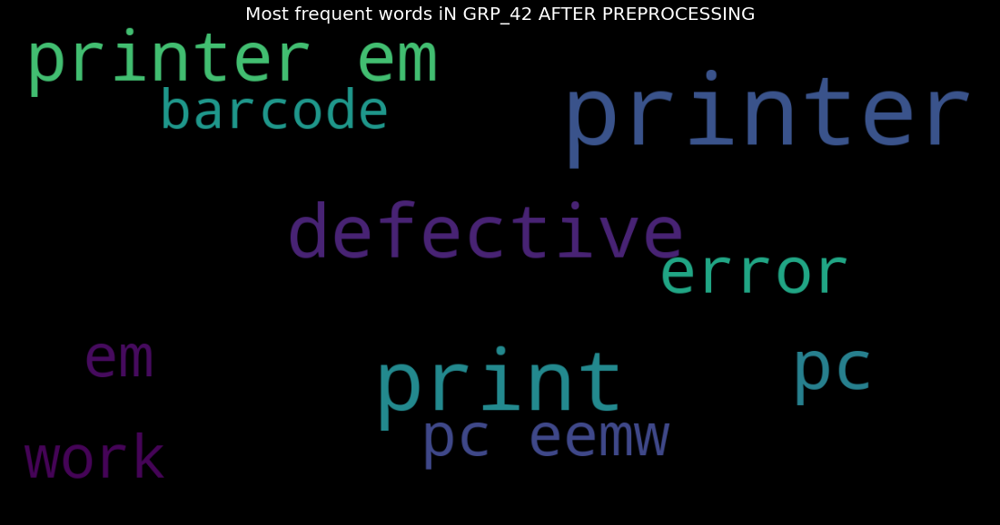



{'shop floor': 1.0, 'floor app': 0.9, 'order': 0.4, 'number': 0.4, 'production': 0.3, 'access': 0.3, 'work': 0.3, 'record': 0.3, 'problem': 0.3, 'issue': 0.2}




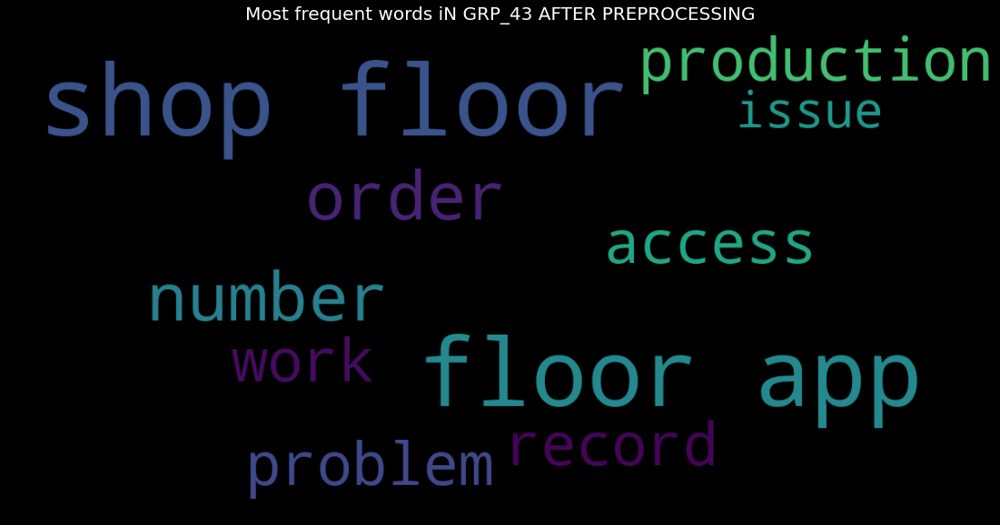



{'plant': 1.0, 'cost': 0.7037037037037037, 'message': 0.48148148148148145, 'profit center': 0.4444444444444444, 'co account': 0.4074074074074074, 'account assignment': 0.4074074074074074, 'mm': 0.37037037037037035, 'different profit': 0.3333333333333333, 'assignment different': 0.2962962962962963, 'pgi': 0.25925925925925924}




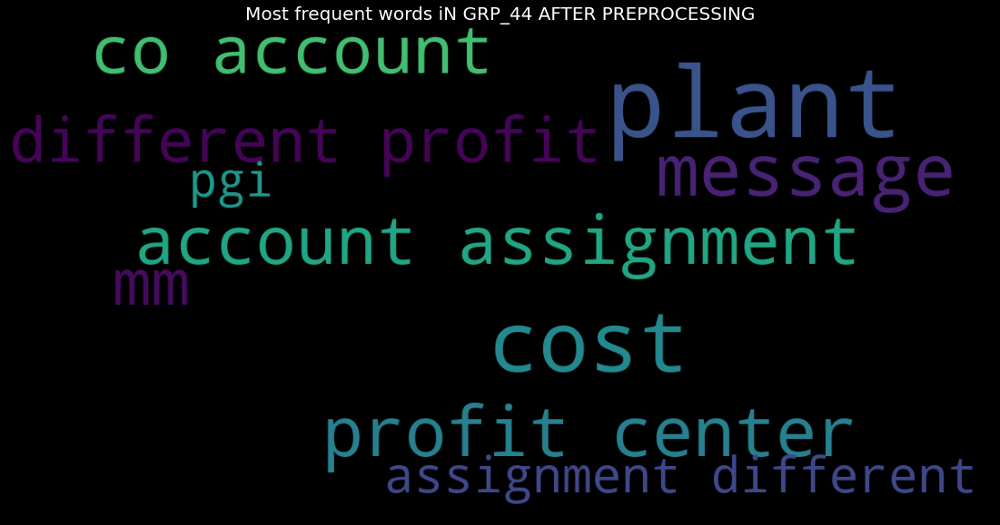



{'plant': 1.0, 'erp': 0.9473684210526315, 'production order': 0.8947368421052632, 'fail job': 0.8421052631578947, 'print': 0.7894736842105263, 'job job': 0.7894736842105263, 'job fail': 0.7368421052631579, 'create': 0.47368421052631576, 'sid': 0.42105263157894735, 'issue': 0.42105263157894735}




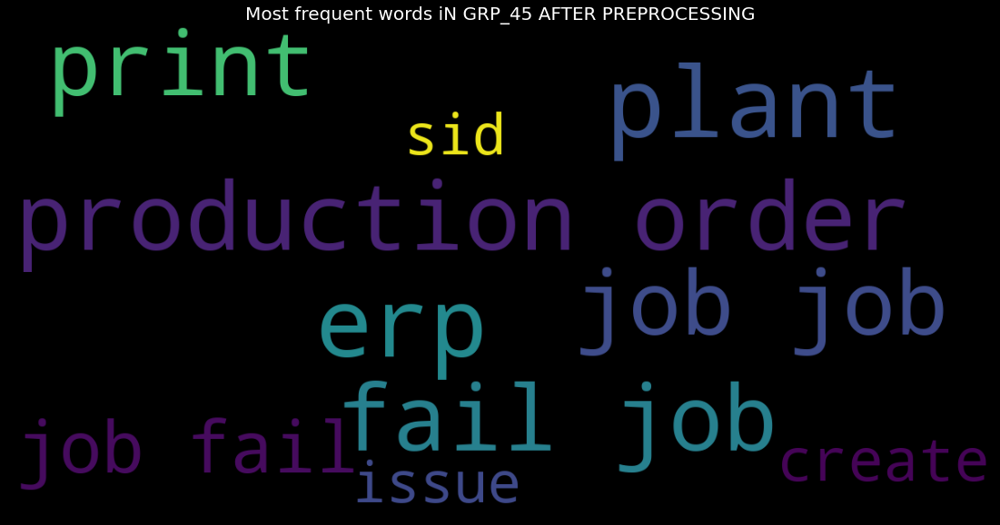



{'tool': 1.0, 'engineering': 0.8571428571428571, 'nx': 0.7142857142857143, 'error': 0.5714285714285714, 'help': 0.42857142857142855, 'programdnty': 0.42857142857142855, 'gkad': 0.42857142857142855, 'open': 0.42857142857142855, 'draw': 0.42857142857142855, 'customization': 0.2857142857142857}




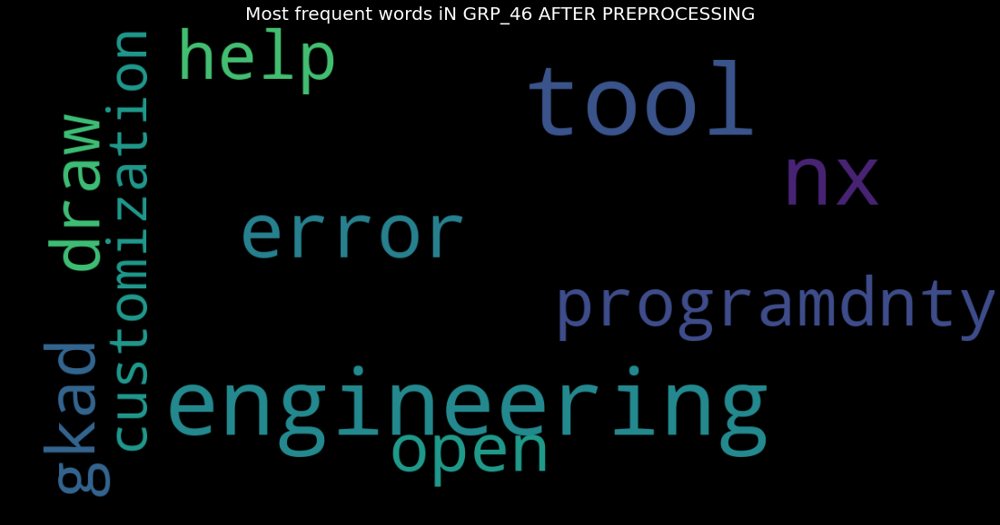



{'hostname': 1.0, 'job scheduler': 1.0, 'abended job': 0.7619047619047619, 'job': 0.7142857142857143, 'sid': 0.6666666666666666, 'tool company': 0.47619047619047616, 'dev': 0.42857142857142855, 'company abended': 0.38095238095238093, 'server': 0.3333333333333333, 'report': 0.2857142857142857}




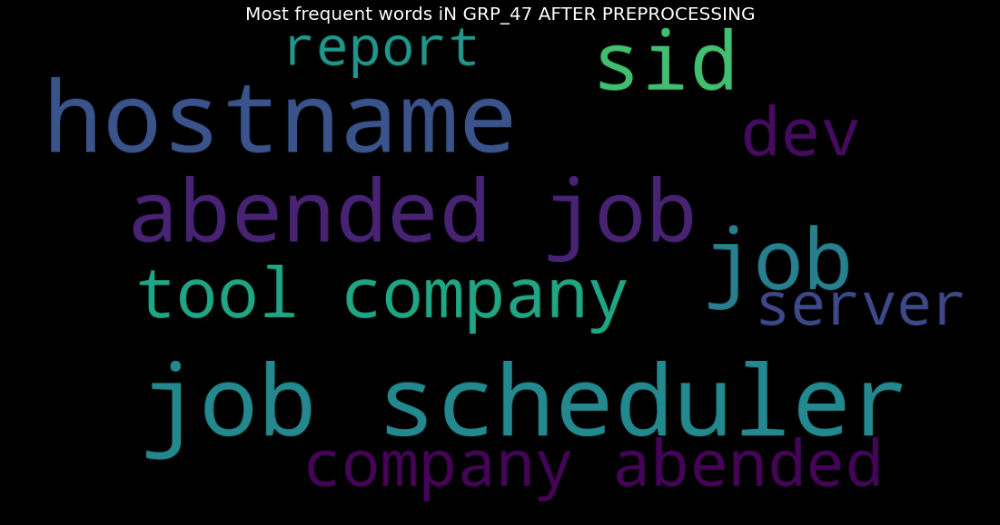



{'change': 1.0, 'erp': 1.0, 'search': 1.0, 'analytics': 0.75, 'ec': 0.75, 'track': 0.75, 'work': 0.75, 'several': 0.75, 'word': 0.5, 'document': 0.5}




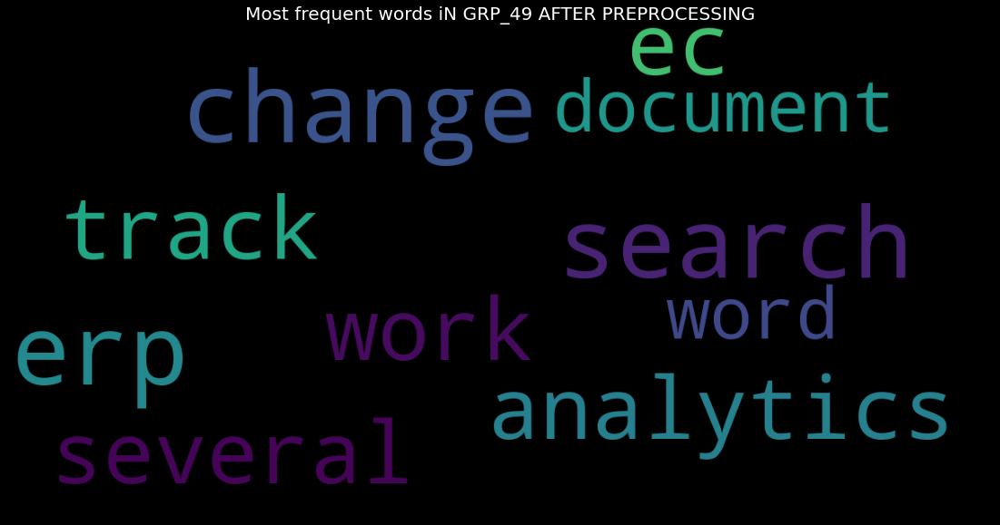



{'symantec': 1.0, 'update': 0.875, 'us': 0.875, 'virus': 0.75, 'company': 0.625, 'high': 0.625, 'call': 0.625, 'incident': 0.625, 'via': 0.625, 'receive': 0.5}




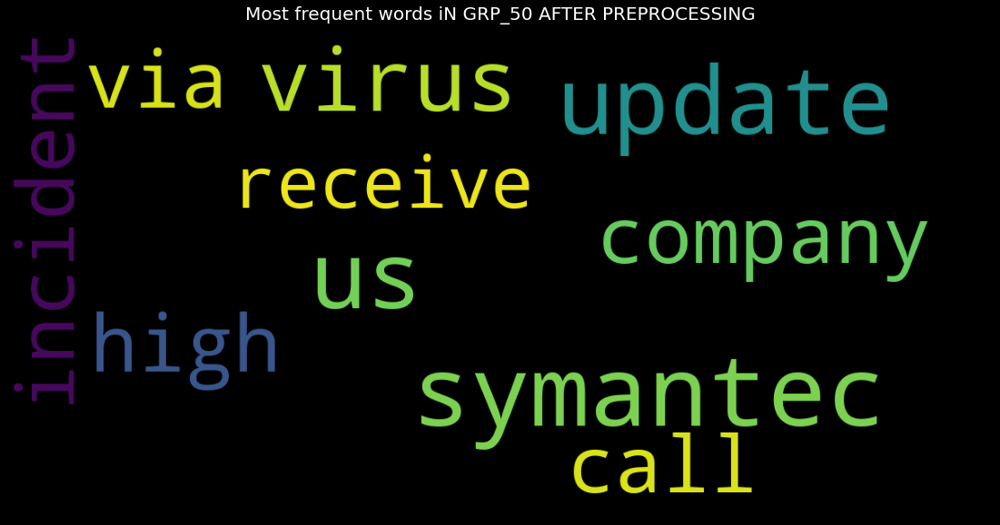



{'work': 1.0, 'company': 0.8, 'tool': 0.5, 'page': 0.5, 'product selector': 0.5, 'issue': 0.3, 'engineering': 0.3, 'component': 0.3, 'prod': 0.3, 'click': 0.3}




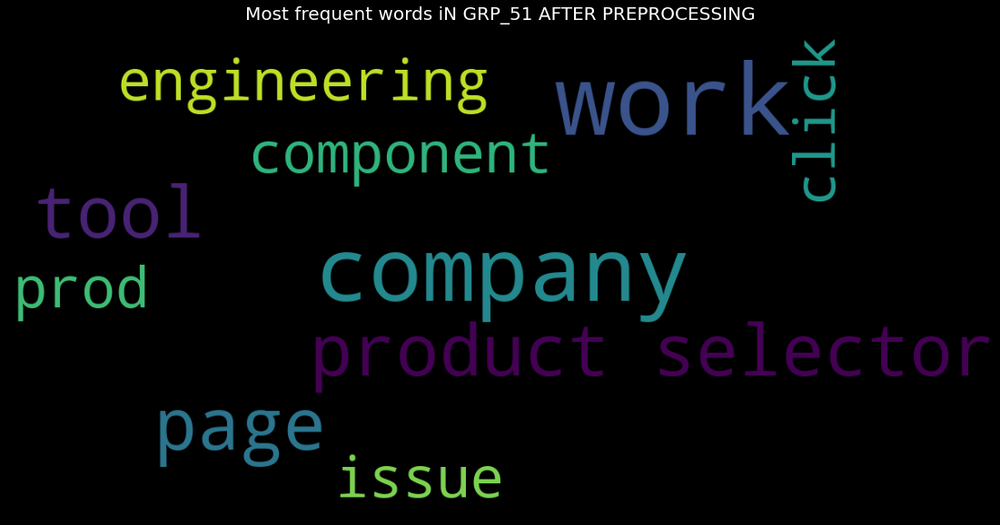



{'manager': 1.0, 'expense': 0.8333333333333334, 'miss': 0.6666666666666666, 'erp': 0.6666666666666666, 'number': 0.6666666666666666, 'report': 0.6666666666666666, 'work': 0.6666666666666666, 'employee': 0.5, 'kylfgte': 0.5, 'worklist': 0.5}




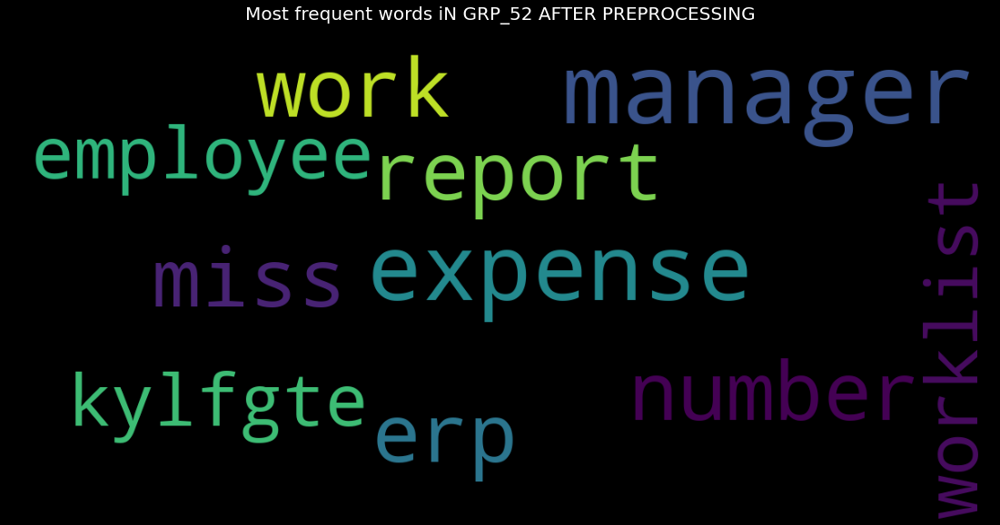



{'sid': 1.0, 'hana': 0.5, 'admin datacenter': 0.5, 'batch number': 0.4375, 'datacenter switch': 0.4375, 'cancel': 0.375, 'password': 0.375, 'tool': 0.3125, 'reset': 0.3125, 'engineering tool': 0.3125}




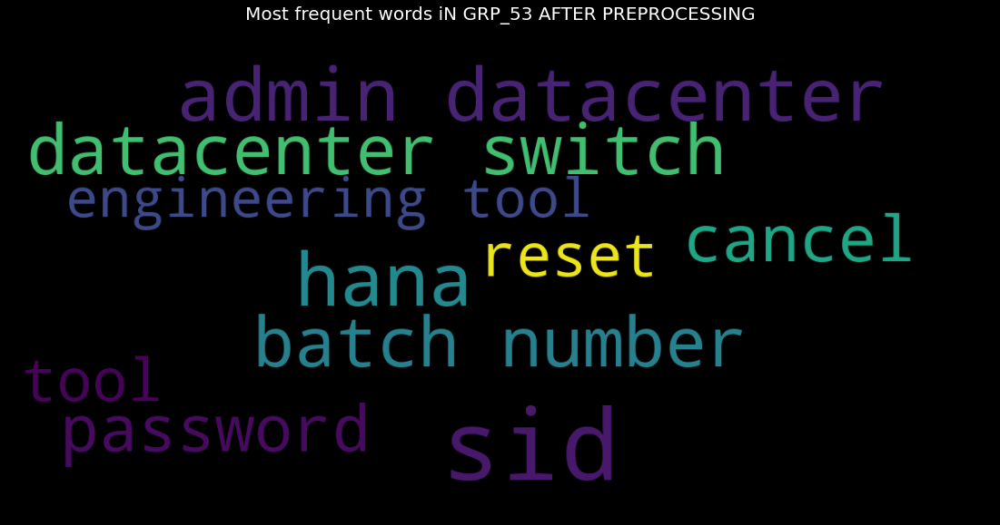



{'stock': 1.0, 'receive': 0.5, 'product': 0.5, 'plant': 0.5, 'batch': 0.5, 'require': 0.5, 'customer': 0.5, 'order': 0.5, 'logical': 0.25, 'warehouse': 0.25}




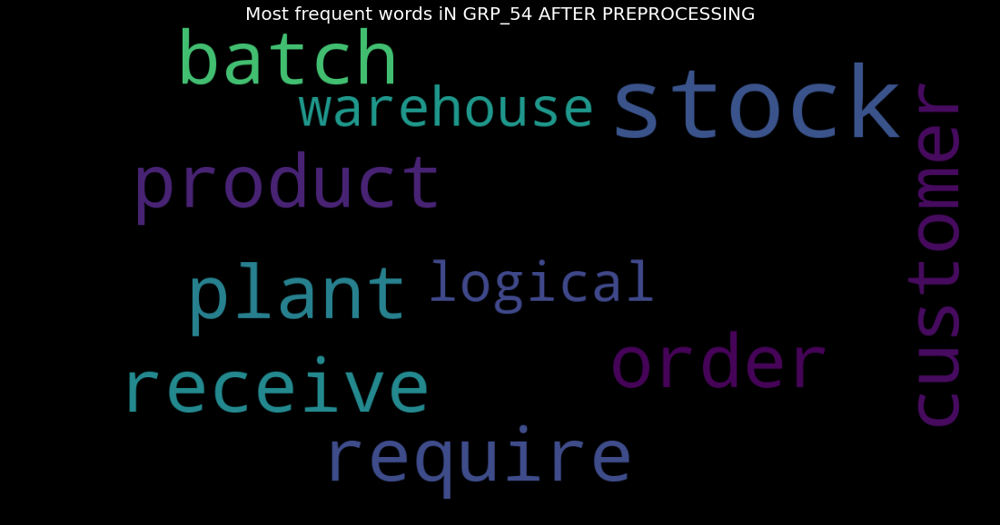



{'finance app': 1.0, 'system': 0.5454545454545454, 'receive': 0.5454545454545454, 'uagqromi sqgtkmci': 0.36363636363636365, 'cid image': 0.36363636363636365, 'image png': 0.36363636363636365, 'database': 0.2727272727272727, 'follow': 0.2727272727272727, 'still': 0.18181818181818182, 'retrieve': 0.18181818181818182}




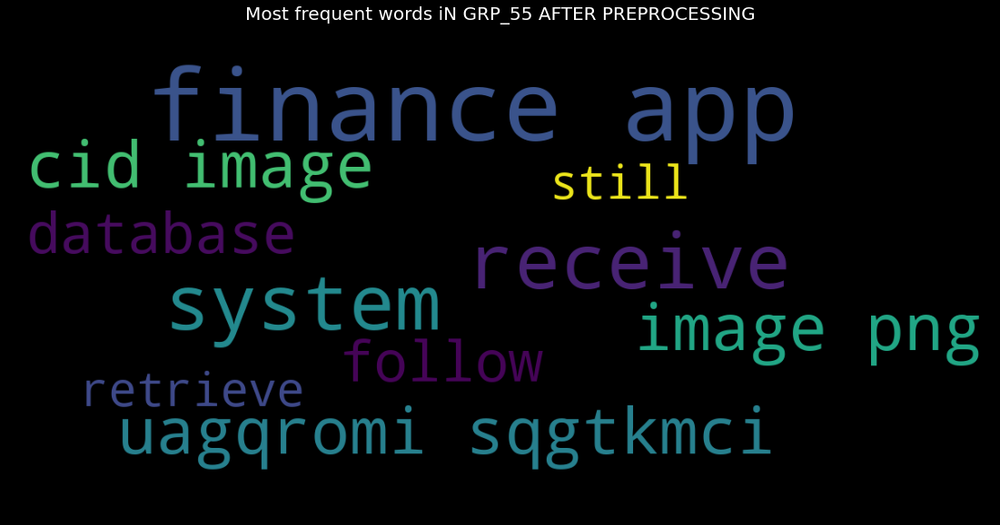



{'event': 1.0, 'id': 0.9090909090909091, 'ip': 0.7272727272727273, 'source': 0.45454545454545453, 'pcap': 0.45454545454545453, 'destination': 0.36363636363636365, 'host': 0.36363636363636365, 'agent': 0.36363636363636365, 'cn': 0.36363636363636365, 'da': 0.36363636363636365}




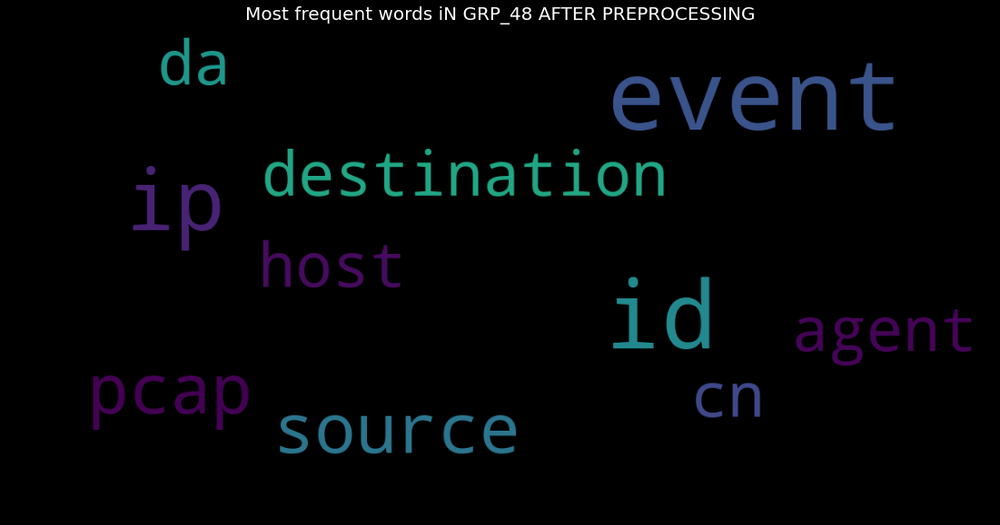



{'android baadea': 1.0, 'sep asa': 0.8421052631578947, 'asa deny': 0.8421052631578947, 'deny udp': 0.8421052631578947, 'udp src': 0.8421052631578947, 'src inside': 0.8421052631578947, 'inside dst': 0.8421052631578947, 'dst noris': 0.8421052631578947, 'noris access': 0.8421052631578947, 'access group': 0.8421052631578947}




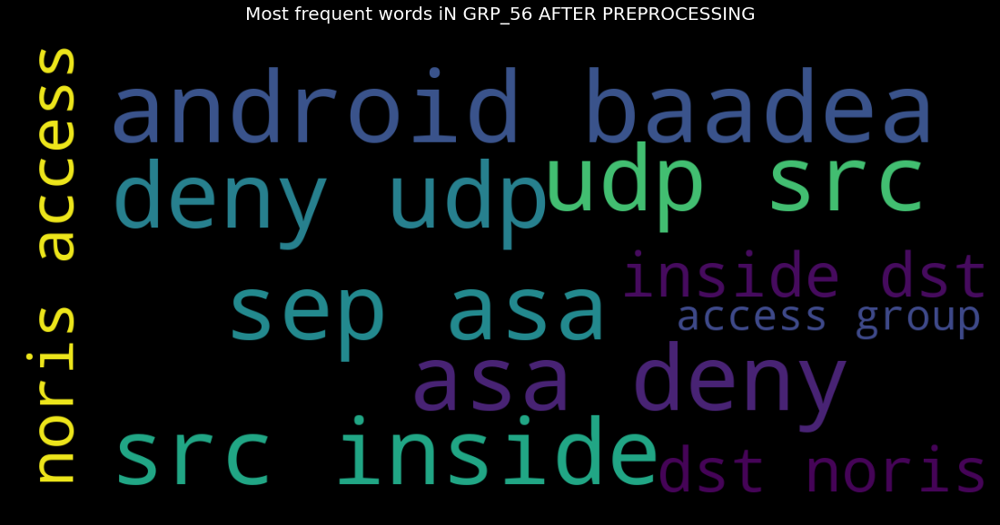



{'job': 1.0, 'access': 0.6666666666666666, 'report': 0.6666666666666666, 'dob': 0.3333333333333333, 'global': 0.3333333333333333, 'fail': 0.3333333333333333, 'busienss': 0.16666666666666666, "busienss'": 0.16666666666666666, 'scheduler': 0.16666666666666666, 'receive': 0.16666666666666666}




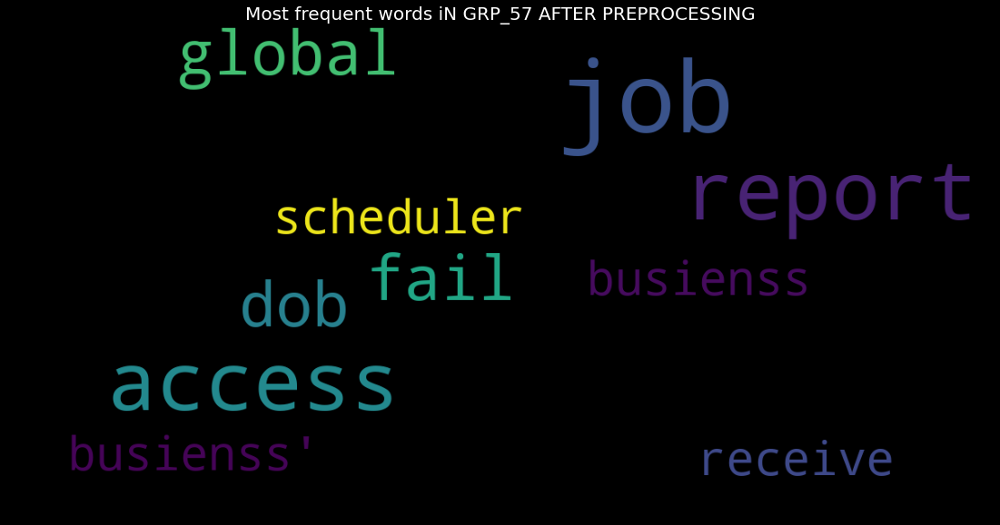



{'stop': 1.0, 'engg': 1.0, 'processor': 0.8333333333333334, 'job': 0.8333333333333334, 'restart': 0.6666666666666666, 'team': 0.5, 'dba': 0.3333333333333333, 'application': 0.3333333333333333, 'database': 0.3333333333333333, 'qeue': 0.3333333333333333}




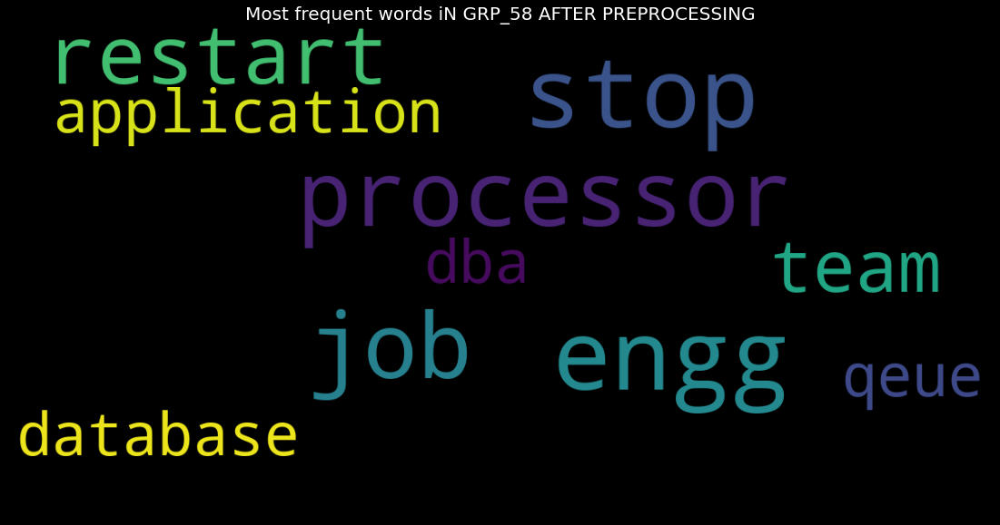



{'erp': 1.0, 'eu tool': 0.7272727272727273, 'slow': 0.6363636363636364, 'run': 0.45454545454545453, 'server': 0.45454545454545453, 'time': 0.36363636363636365, 'network problem': 0.36363636363636365, 'tmqfjard qzhgdoua': 0.36363636363636365, 'application': 0.2727272727272727, 'one': 0.2727272727272727}




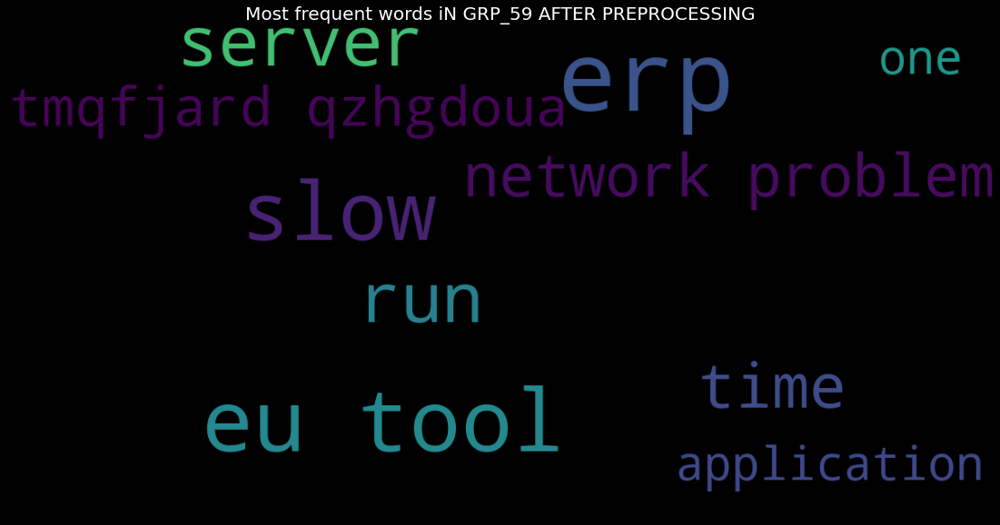



{'fail job': 1.0, 'monitoring tool': 0.7272727272727273, 'job hostname': 0.6363636363636364, 'tool company': 0.5454545454545454, 'job scheduler': 0.5, 'scheduler receive': 0.5, 'receive monitoring': 0.5, "job scheduler'": 0.5, 'fail': 0.4090909090909091, 'et': 0.2727272727272727}




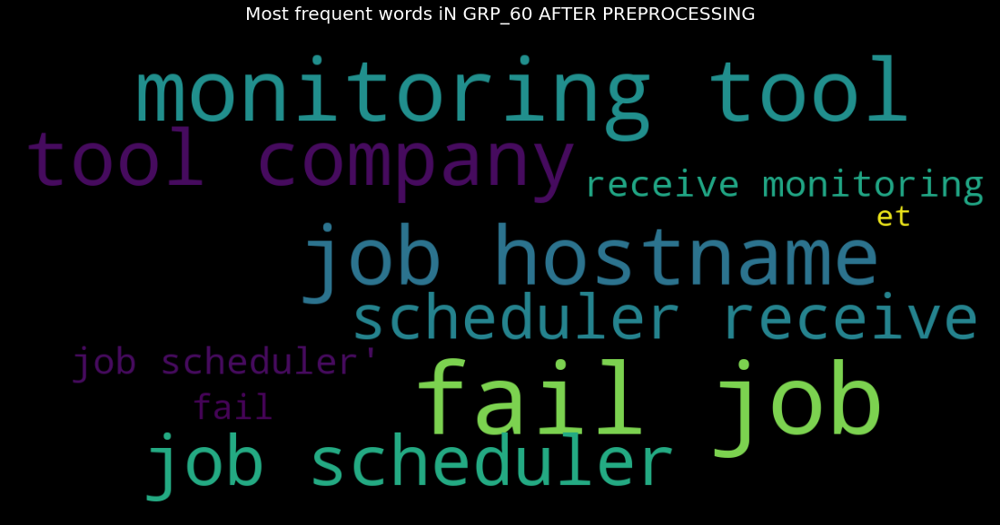



{'company': 1.0, 'srvlavpwdrprd': 0.5, 'respond': 0.5, 'calibration': 0.5, 'system': 0.5, "aerp'": 0.5}




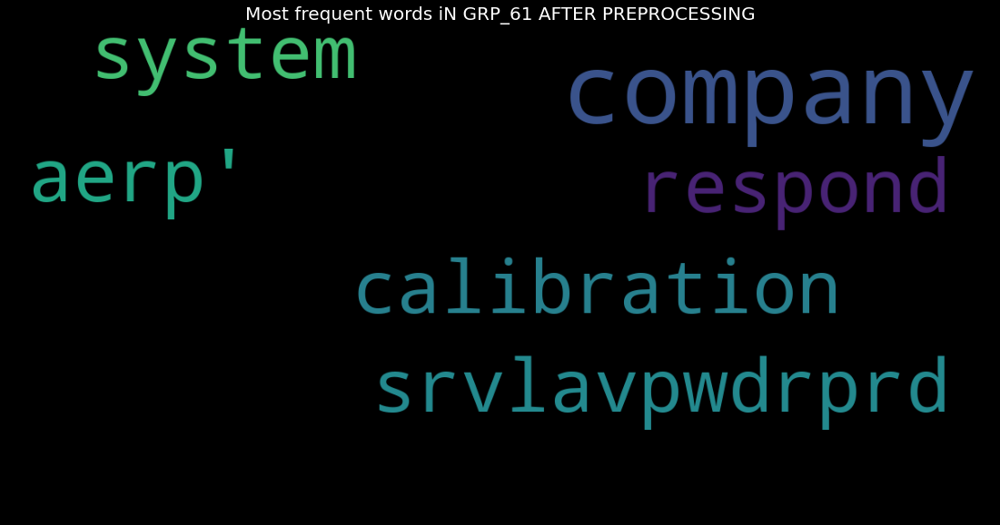



{'edi': 1.0, 'reject': 0.6, 'wg': 0.6, 'client': 0.4, 'company': 0.4, 'inc': 0.4, 'inwarehouse': 0.4, 'tool': 0.4, 'order': 0.4, 'ksb': 0.4}




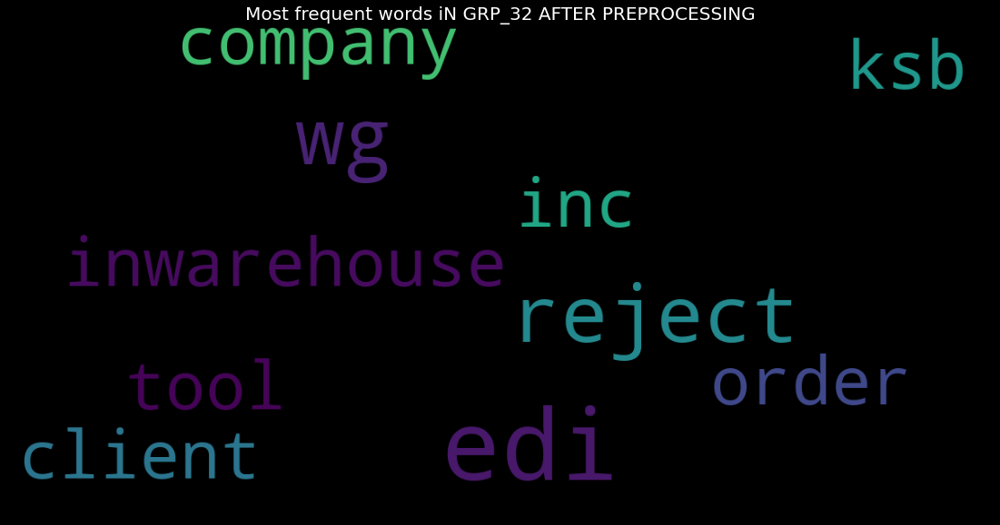



{'sinkhole': 1.0, 'event': 1.0, 'device': 0.7777777777777778, 'file': 0.7777777777777778, 'ip': 0.7222222222222222, 'domain': 0.6666666666666666, 'content': 0.6111111111111112, 'locky': 0.6111111111111112, 'request': 0.5555555555555556, 'name': 0.5555555555555556}




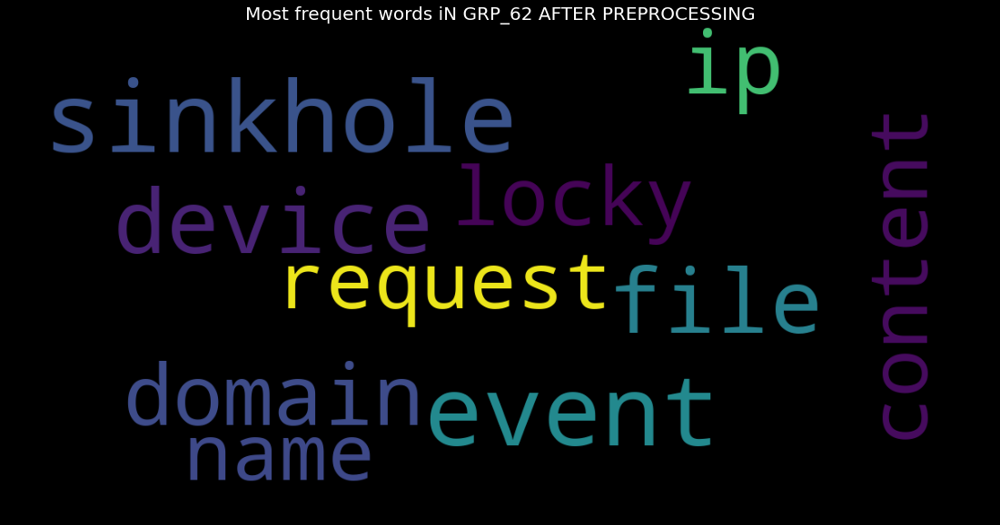



{'app': 1.0, 'install': 0.6666666666666666, 'crm': 0.6666666666666666, 'galaxy': 0.6666666666666666, 'android': 0.6666666666666666, 'mobile': 0.6666666666666666, 'phone': 0.6666666666666666, 'mail': 0.6666666666666666, 'jkuaslxe': 0.6666666666666666, 'hrodszpl': 0.6666666666666666}




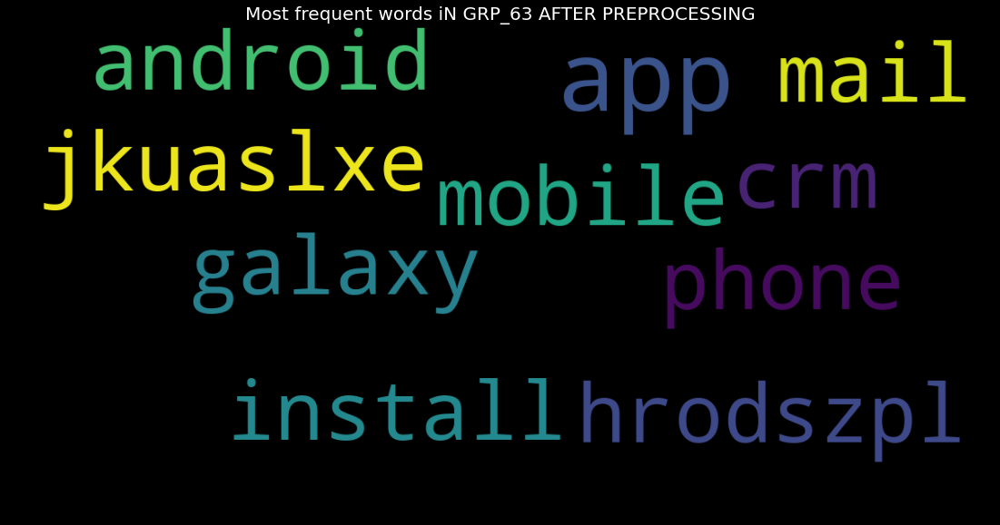



{'report': 1.0, 'receive': 1.0, 'confirmation': 1.0, 'finance': 1.0, 'team': 1.0, 'cancel': 1.0, 'change': 0.5, 'zsdslsum': 0.5, 'last': 0.5, 'email': 0.5}




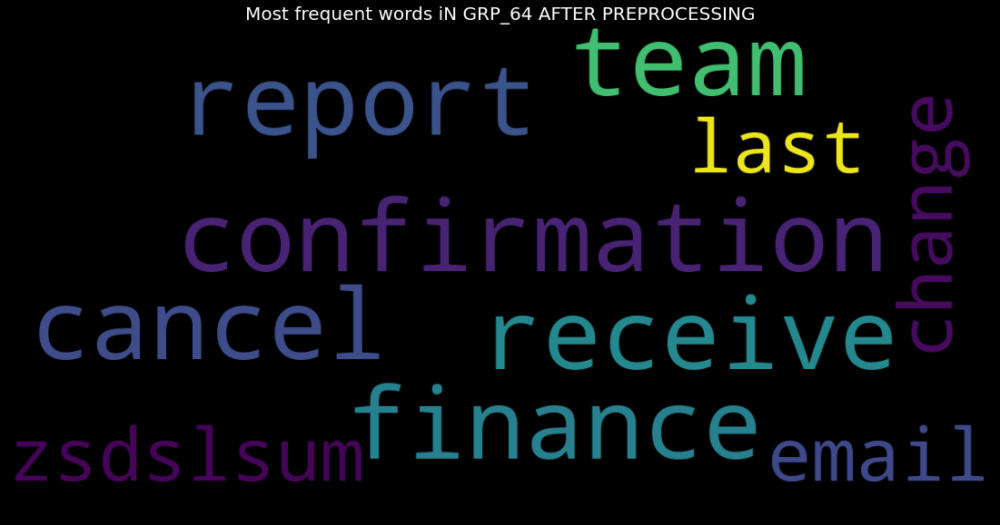



{'telephony software': 1.0, 'update': 0.7, 'receive': 0.7, 'space': 0.6, 'available': 0.6, 'deployment': 0.6, 'server': 0.5, 'space consume': 0.5, 'day': 0.4, 'company': 0.4}




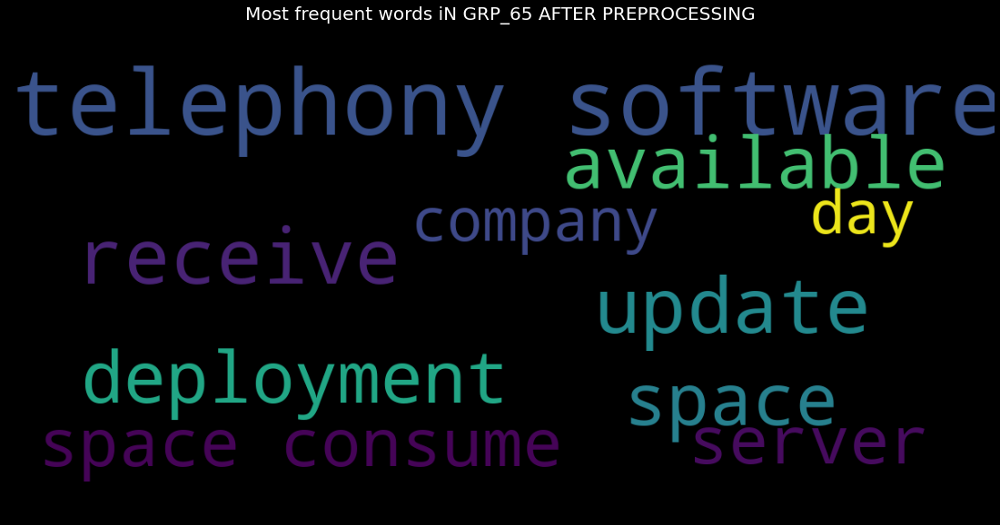



{'update': 1.0, 'cutview': 1.0, 'lauacyltoe': 0.75, 'hxgaycze': 0.75, 'version': 0.75, 'te': 0.5, 'application': 0.5, 'run': 0.5, 'adjust': 0.5, 'current': 0.5}




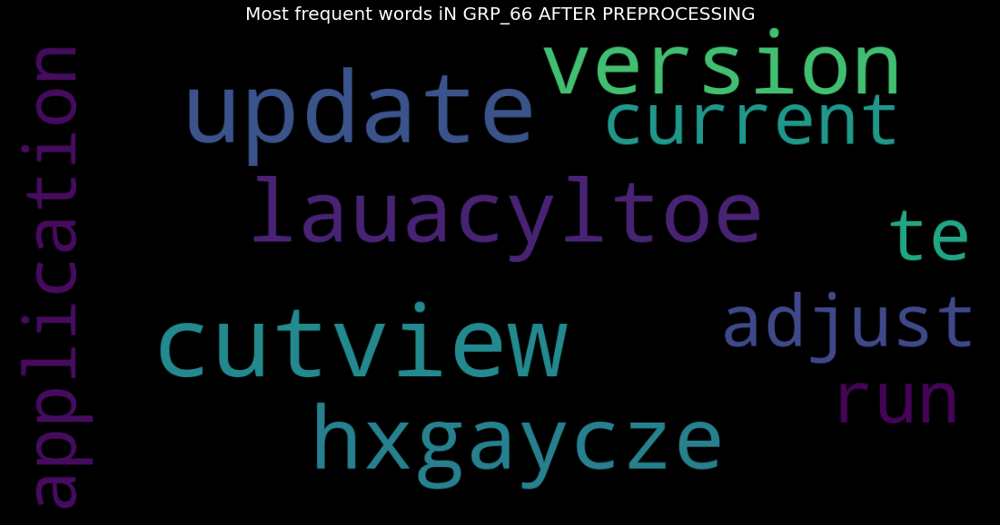



{'fnqelwpk': 1.0, 'ahrskvln': 0.8, 'complete': 0.6, 'forecast': 0.6, 'jochegtyhu': 0.4, 'help': 0.4, 'regional': 0.4, 'manager': 0.4, 'latin': 0.4, 'amerirtca': 0.4}




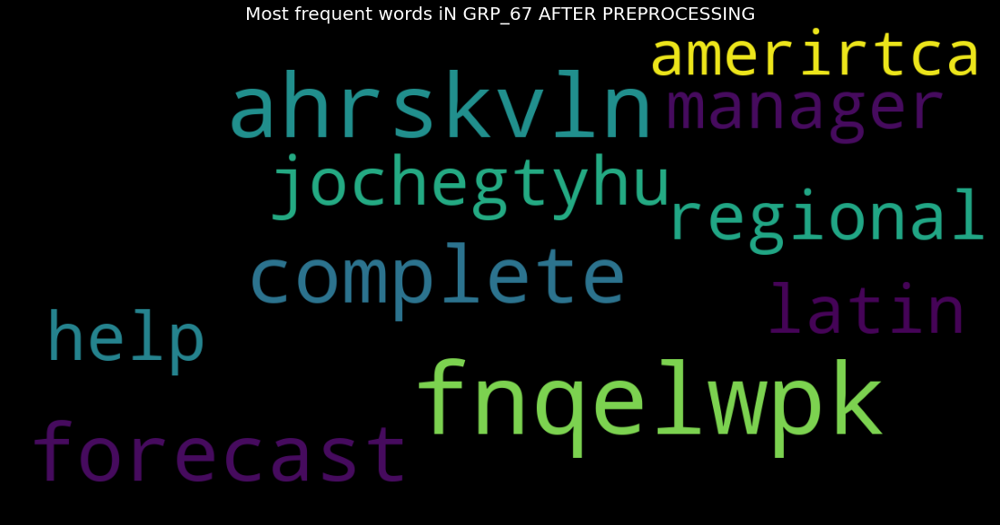



{'expense report': 1.0, 'ytqhfmwi': 0.75, 'submit': 0.75, 'itnakpmc': 0.5, 'manager': 0.375, 'receive': 0.25, 'cid': 0.25, 'image': 0.25, 'jpg': 0.25, 'michjnfyele': 0.25}




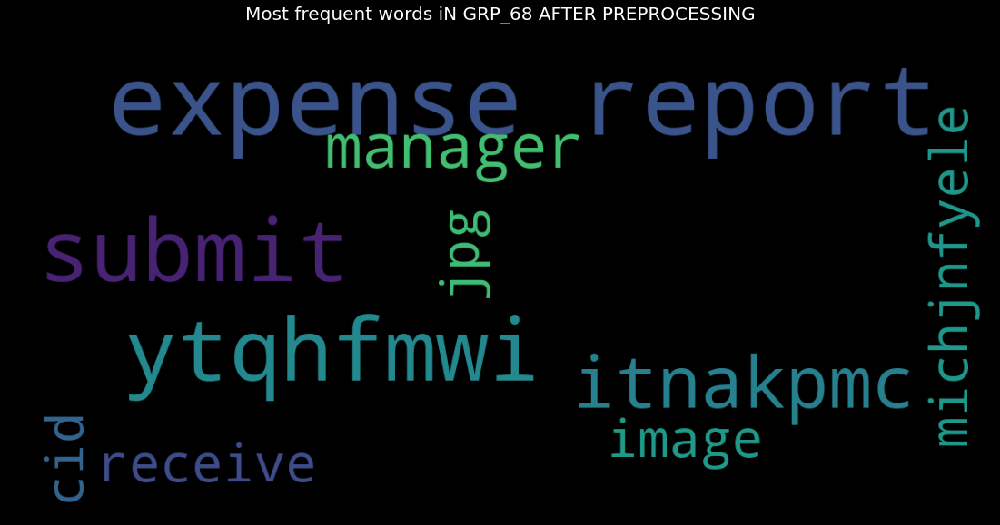



{'event': 1.0, 'edml': 0.5, 'ip': 0.5, 'company': 0.4, 'host': 0.4, 'via': 0.4, 'us': 0.4, 'repeat outbound': 0.4, 'outbound connection': 0.4, 'connection tcp': 0.4}




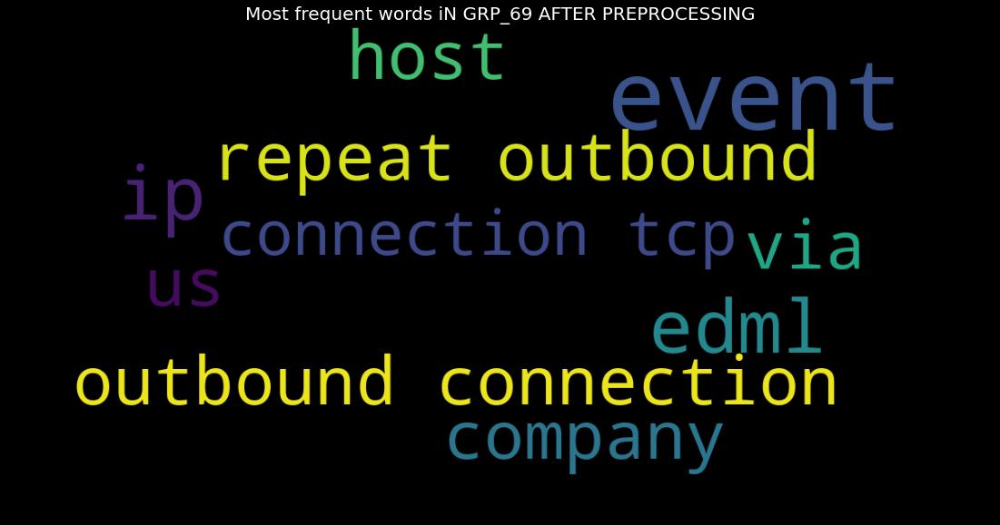



{'link': 1.0, 'mail': 1.0, 'forbidden': 0.5, 'training': 0.5, 'email': 0.5, 'hint': 0.5, 'tip': 0.5, 'create': 0.5, 'signature': 0.5, 'company': 0.5}




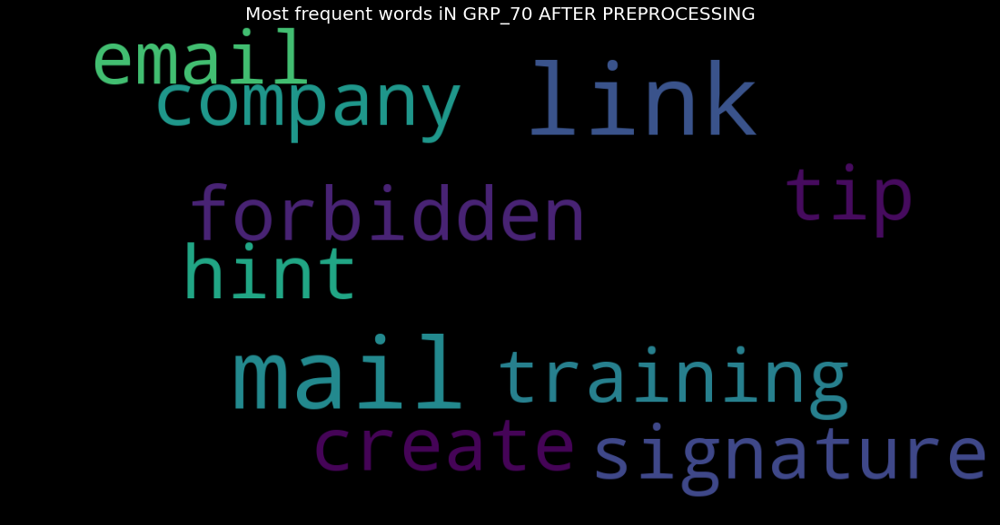



{'file': 1.0, 'receive': 0.6, 'production': 0.4, 'schedule': 0.4, 'emea': 0.4, 'check': 0.4, 'us': 0.4, 'know': 0.4, 'notification': 0.4, 'send': 0.4}




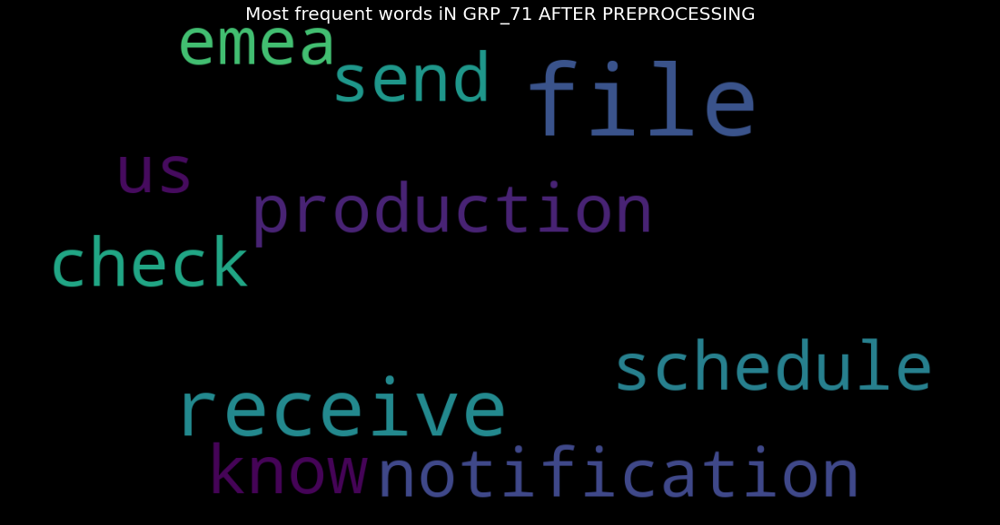



{'account': 1.0, "lock'": 1.0, 'update': 1.0, 'anftgup': 1.0, "nftgyair'": 1.0}




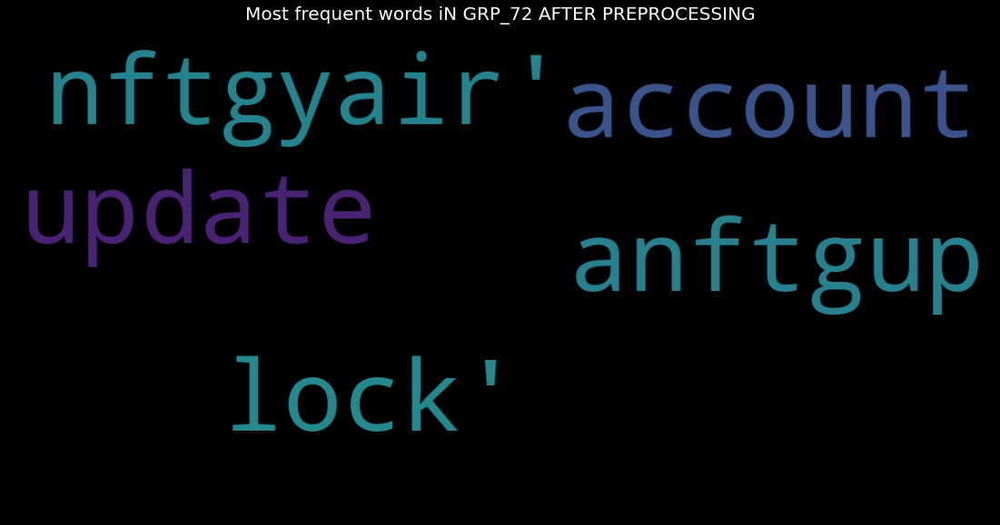



{'oneteam': 1.0, 'log': 1.0, 'sso': 0.6666666666666666, 'portal': 0.6666666666666666, 'work': 0.3333333333333333, 'hr': 0.3333333333333333, 'tool': 0.3333333333333333, 'hub': 0.3333333333333333, 'click': 0.3333333333333333, 'link': 0.3333333333333333}




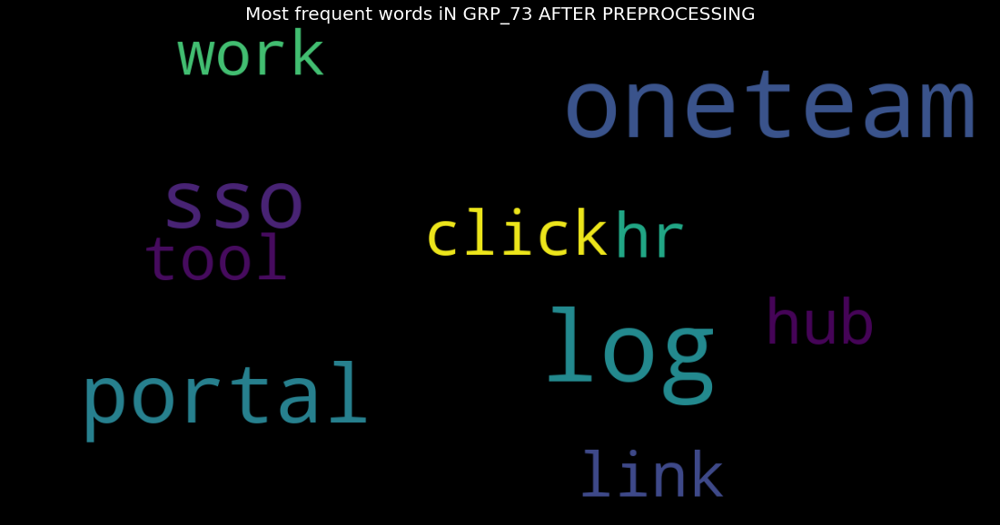



   New Group Orig Group                                          Top Words
0      GRP_L      GRP_1  (hostname, space consume, consume space, job, ...
1      GRP_L     GRP_11  (engineering tool, erp, work, draw, plm, mater...
2      GRP_L     GRP_15  (crm, receive, erp crm, email, account, employ...
3      GRP_L     GRP_20  (erp, change, send, data, tool, save, work, em...
4      GRP_L     GRP_21  (distributor tool, price, issue, report, quote...
5      GRP_L     GRP_22  (crm, access, receive, error, contact, issue, ...
6      GRP_L     GRP_23  (ethic, company, course, receive, ethic train,...
7      GRP_L     GRP_27  (login, outlook, skype, access, email, meeting...
8      GRP_L     GRP_28  (receive, new, company, th, help, germany, tea...
9      GRP_L     GRP_30  (tuqrvowp fxmzkvqo, event, pro pz, pz dn, dn i...
10     GRP_L     GRP_35  (access, kp, erp, enter, forecast, cost, cente...
11     GRP_L     GRP_36  (tool, uacyltoe hxgayczeing, time card, timeca...
12     GRP_L     GRP_37

In [ ]:
# multiplegroup = []

# view word cloud for GRP_L
grpvalue = 'L'
grpvalstr = "GRP_"+str(grpvalue)
assignmentgrp_L = incident_df_final['Assignment group'][incident_df_final['New Assignment group'].isin([grpvalstr])].unique()

for i in range(assignmentgrp_L.size):
  wordcloud = build_wordcloud(assignmentgrp_L[i],10,True)
  show_wordcloud(wordcloud,assignmentgrp_L[i])
  wordsby_grp_L.loc[len(wordsby_grp_L.index)] = [grpvalstr, assignmentgrp_L[i], wordcloud.words_.keys()]

print(wordsby_grp_L)


{'company': 1.0, 'access sw': 0.38461538461538464, 'issue': 0.36923076923076925, 'backup circuit': 0.36923076923076925, 'wifi': 0.3230769230769231, 'connect': 0.3076923076923077, 'network': 0.2923076923076923, 'apac': 0.24615384615384617, 'type outage': 0.24615384615384617, 'schedule maintenance': 0.24615384615384617}




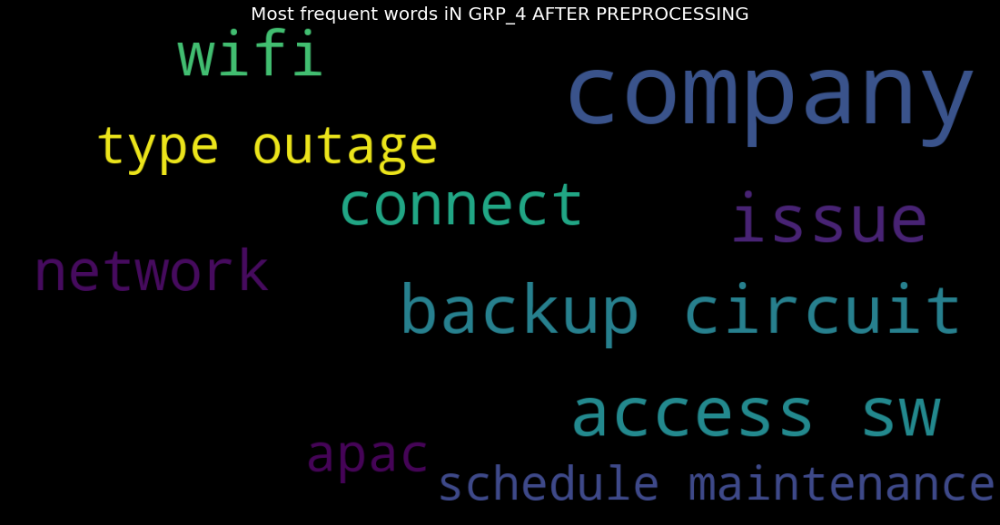



{'telephony software': 1.0, 'call': 0.40963855421686746, 'phone': 0.3253012048192771, 'password': 0.25301204819277107, 'change': 0.20481927710843373, 'reset password': 0.18072289156626506, 'log': 0.1566265060240964, 'number': 0.14457831325301204, 'work': 0.12048192771084337, 'rout': 0.12048192771084337}




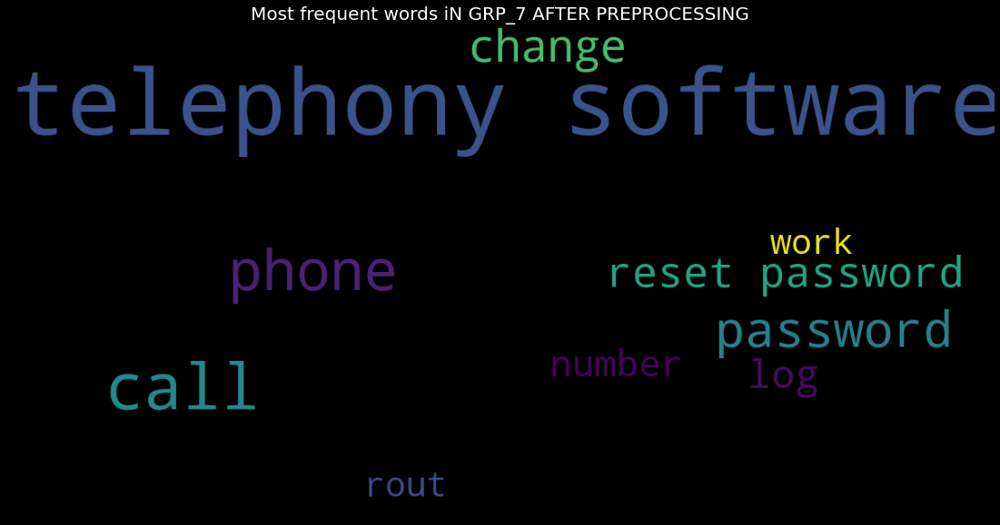



{'collaboration platform': 1.0, 'access': 0.6116504854368932, 'receive': 0.3883495145631068, 'file': 0.18446601941747573, 'company': 0.18446601941747573, 'email': 0.18446601941747573, 'hub': 0.17475728155339806, 'link': 0.1650485436893204, 'issue': 0.1262135922330097, 'open': 0.1262135922330097}




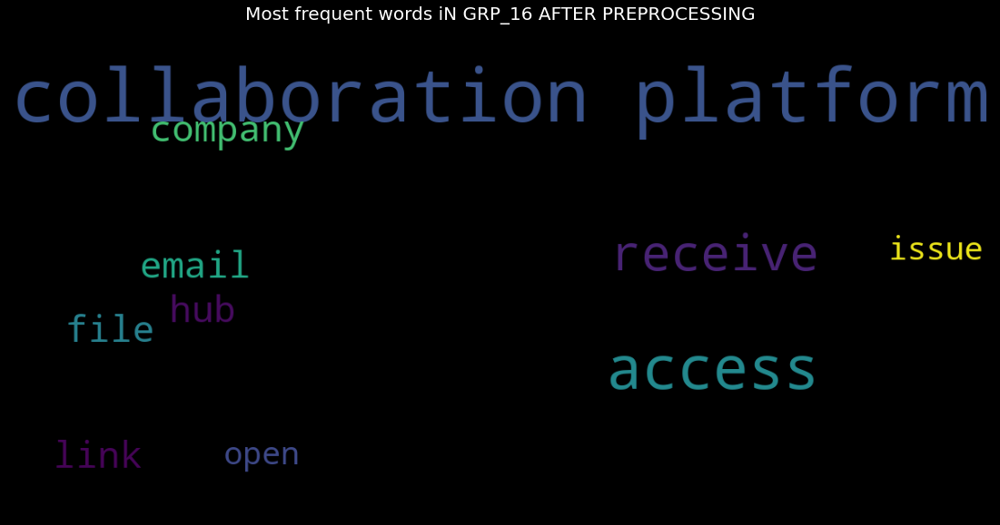



{'reset password': 1.0, 'password management': 0.9722222222222222, 'management tool': 0.9722222222222222, 'tool password': 0.9583333333333334, "reset' reset": 0.6944444444444444, "password reset'": 0.6805555555555556, 'erp': 0.125, 'log': 0.05555555555555555, 'ytzpxhql ntfxgpms': 0.05555555555555555, 'change': 0.041666666666666664}




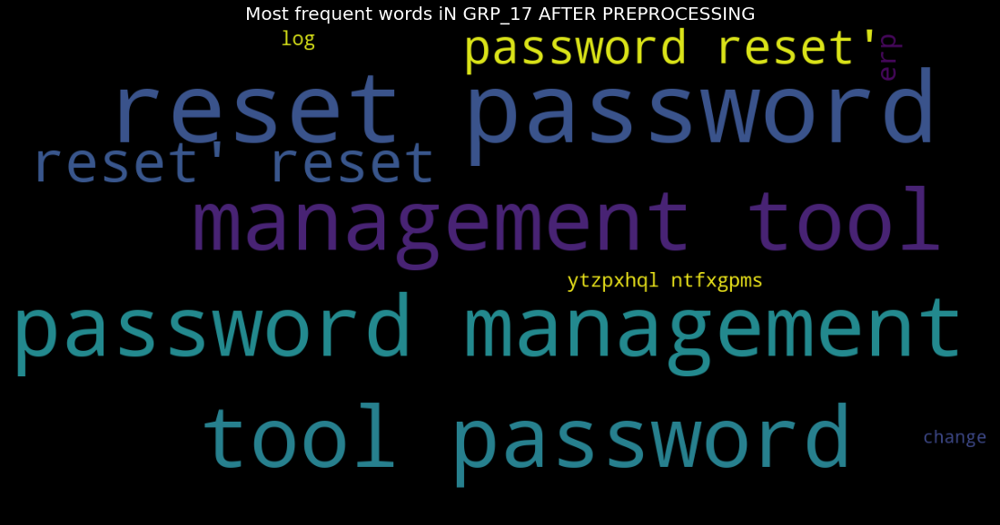



{'receive': 1.0, 'delivery note': 0.8571428571428571, 'delivery': 0.7959183673469388, 'erp': 0.7755102040816326, 'ship': 0.7551020408163265, 'plant': 0.6938775510204082, 'issue': 0.6530612244897959, 'order': 0.6326530612244898, 'dn': 0.6122448979591837, 'create': 0.5918367346938775}




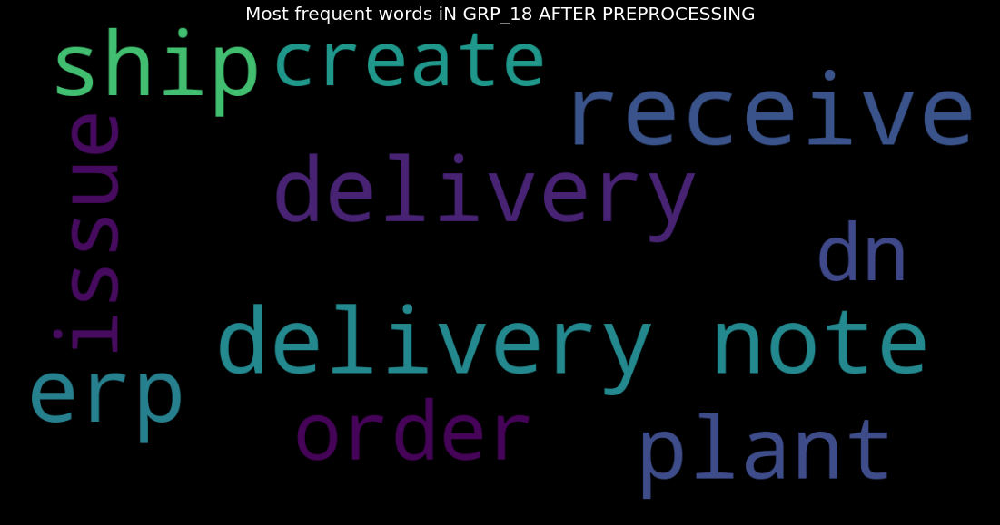



{'email': 1.0, 'send': 0.734375, 'company': 0.578125, 'receive': 0.515625, 'message': 0.390625, 'outlook': 0.3125, 'mail': 0.265625, 'subject': 0.234375, 'error': 0.21875, 'dmprmb namprd': 0.21875}




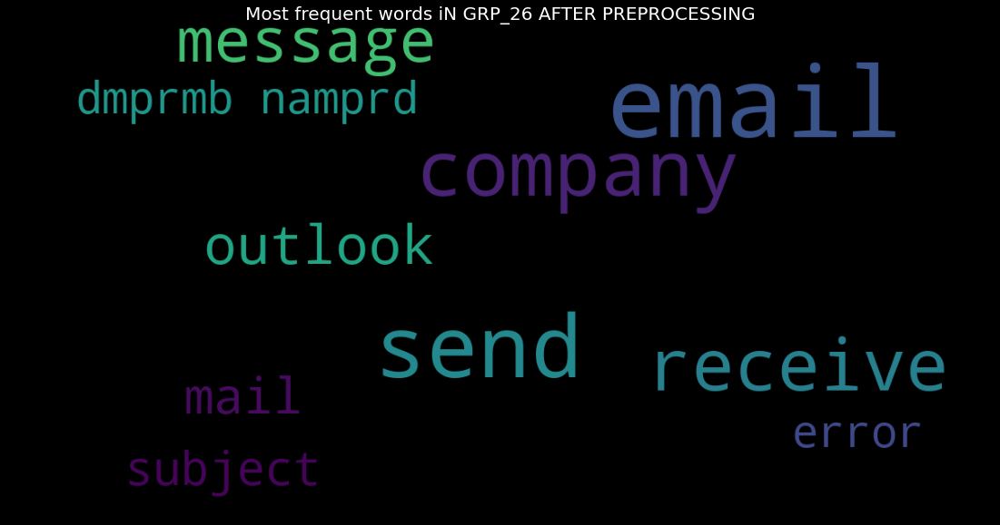



{'purchase': 1.0, 'po': 0.9607843137254902, 'create': 0.7254901960784313, 'mm': 0.7058823529411765, 'receive': 0.6862745098039216, 'error': 0.6274509803921569, 'material': 0.6078431372549019, 'issue': 0.5882352941176471, 'pr': 0.47058823529411764, 'erp': 0.47058823529411764}




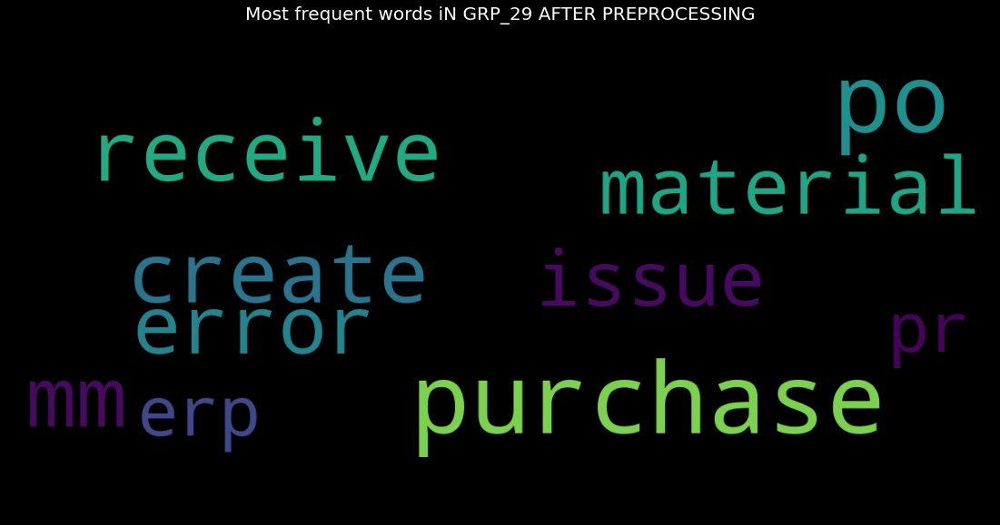



{'event': 1.0, 'vpn': 0.9230769230769231, 'ip': 0.7692307692307693, 'connection': 0.6923076923076923, 'id': 0.6923076923076923, 'computer': 0.6153846153846154, 'provide detail': 0.6153846153846154, 'company': 0.5384615384615384, 'detail issue': 0.5384615384615384, 'login': 0.46153846153846156}




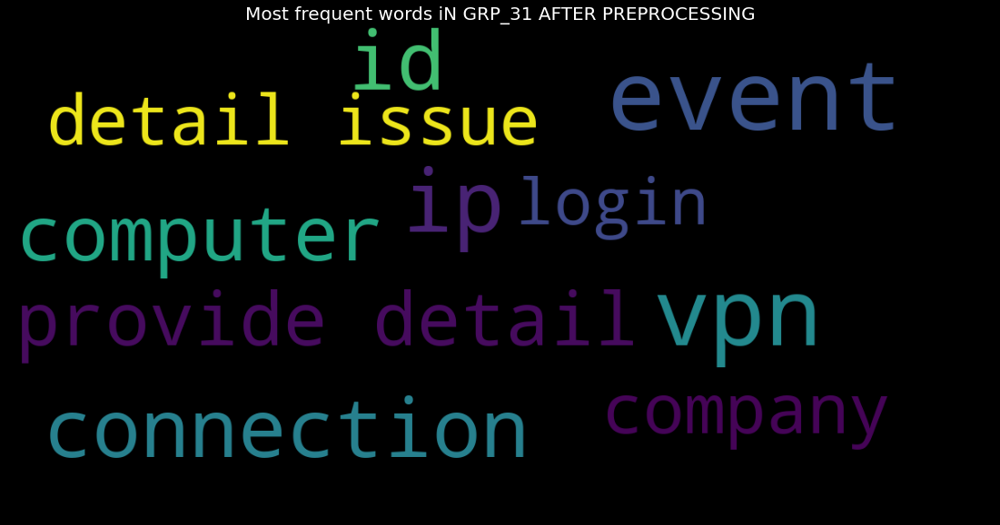



{'access': 1.0, 'folder': 0.5652173913043478, 'receive': 0.3695652173913043, 'company': 0.32608695652173914, 'vpn': 0.30434782608695654, 'folder access': 0.30434782608695654, 'team': 0.2608695652173913, 'drive': 0.2608695652173913, 'account': 0.21739130434782608, 'follow': 0.1956521739130435}




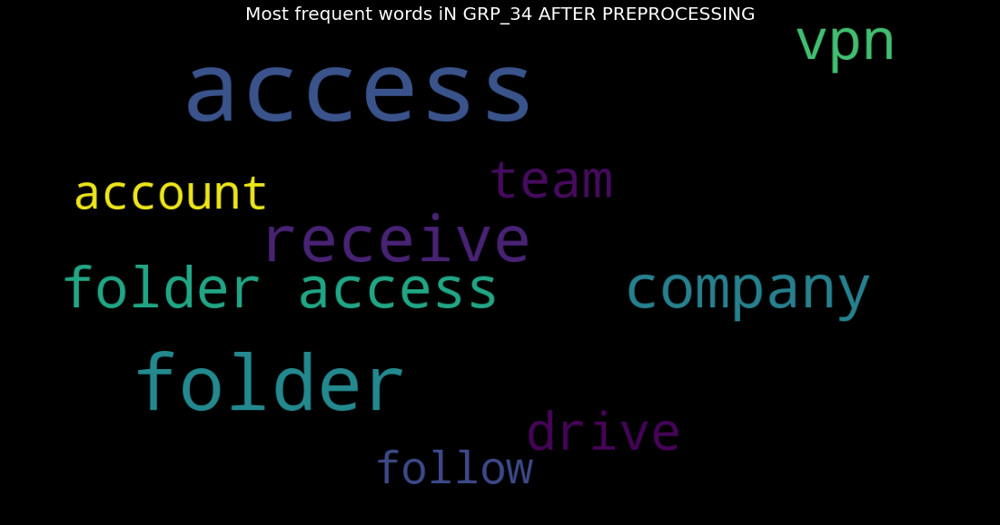



  New Group Orig Group                                          Top Words
0     GRP_C      GRP_4  (company, access sw, issue, backup circuit, wi...
1     GRP_C      GRP_7  (telephony software, call, phone, password, ch...
2     GRP_C     GRP_16  (collaboration platform, access, receive, file...
3     GRP_C     GRP_17  (reset password, password management, manageme...
4     GRP_C     GRP_18  (receive, delivery note, delivery, erp, ship, ...
5     GRP_C     GRP_26  (email, send, company, receive, message, outlo...
6     GRP_C     GRP_29  (purchase, po, create, mm, receive, error, mat...
7     GRP_C     GRP_31  (event, vpn, ip, connection, id, computer, pro...
8     GRP_C     GRP_34  (access, folder, receive, company, vpn, folder...


In [ ]:
# view word cloud for GRP_C
grpvalue = 'C'
grpvalstr = "GRP_"+str(grpvalue)
assignmentgrp_C = incident_df_final['Assignment group'][incident_df_final['New Assignment group'].isin([grpvalstr])].unique()

for i in range(assignmentgrp_C.size):
  wordcloud = build_wordcloud(assignmentgrp_C[i],10,True)
  show_wordcloud(wordcloud,assignmentgrp_C[i])
  wordsby_grp_C.loc[len(wordsby_grp_C.index)] = [grpvalstr, assignmentgrp_C[i], wordcloud.words_.keys()]

print(wordsby_grp_C)

{'fail job': 1.0, 'job scheduler': 0.8958333333333334, 'tool company': 0.7708333333333334, 'receive monitoring': 0.7569444444444444, 'monitoring tool': 0.7569444444444444, 'job sid': 0.7222222222222222, 'scheduler receive': 0.6597222222222222, "job scheduler'": 0.6597222222222222, 'company job': 0.6180555555555556, "scheduler' job": 0.5763888888888888}




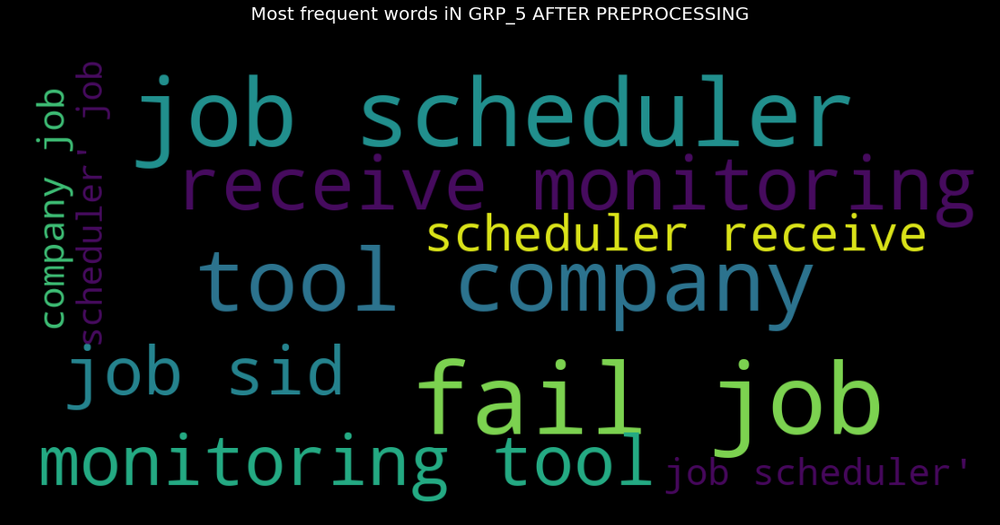



{'fail job': 1.0, 'job hr': 0.5950413223140496, 'hr payroll': 0.5950413223140496, 'payroll fail': 0.5950413223140496, 'job scheduler': 0.5371900826446281, 'tool company': 0.5289256198347108, 'scheduler receive': 0.49586776859504134, 'receive monitoring': 0.49586776859504134, 'monitoring tool': 0.49586776859504134, 'company job': 0.49586776859504134}




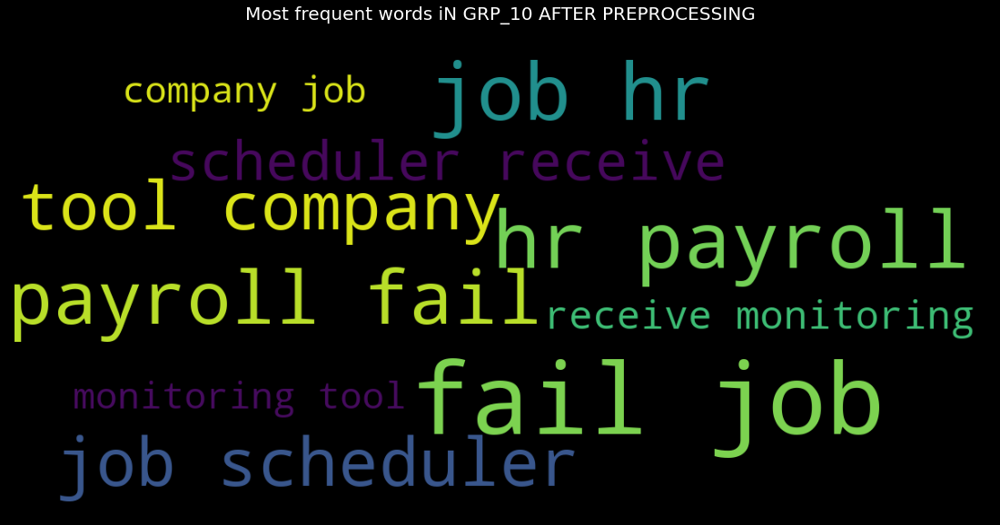



{'inwarehouse tool': 1.0, 'order': 0.6542056074766355, 'customer': 0.5327102803738317, 'receive': 0.45794392523364486, 'erp': 0.45794392523364486, 'issue': 0.4485981308411215, 'item': 0.42990654205607476, 'change': 0.3177570093457944, 'create': 0.3177570093457944, 'workflow': 0.29906542056074764}




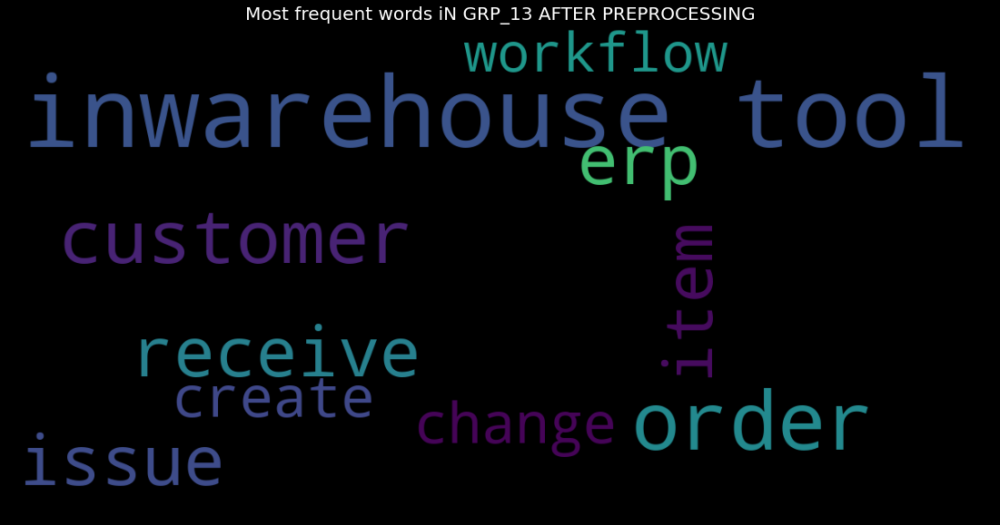



{'erp': 1.0, 'sid': 0.7671232876712328, 'hostname': 0.726027397260274, 'issue': 0.6438356164383562, 'server': 0.5753424657534246, 'error': 0.547945205479452, 'production': 0.3972602739726027, 'system': 0.3835616438356164, 'receive': 0.2602739726027397, 'work': 0.2465753424657534}




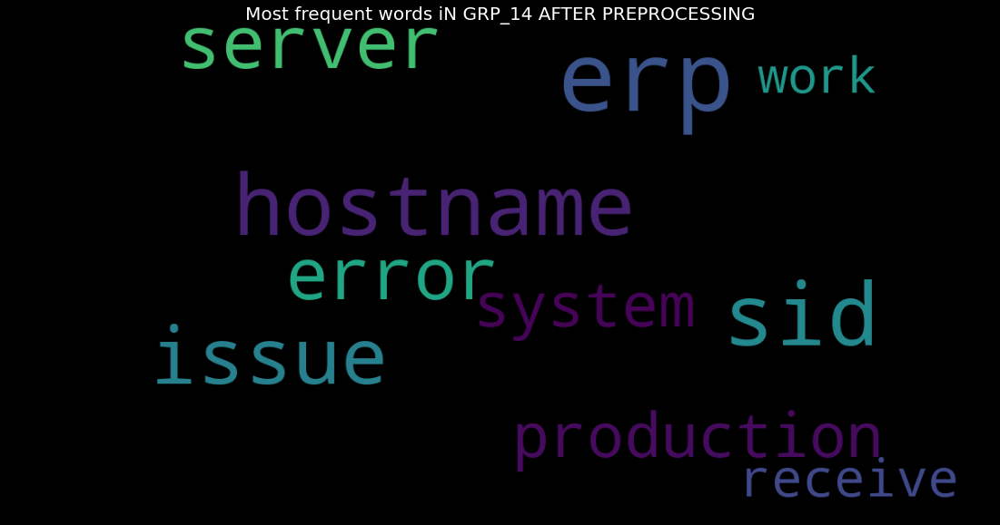



{'engineering tool': 1.0, 'eu tool': 0.8333333333333334, 'receive': 0.4166666666666667, 'work': 0.35714285714285715, 'system': 0.3333333333333333, 'problem': 0.32142857142857145, 'issue': 0.2857142857142857, 'cid image': 0.2857142857142857, 'error': 0.27380952380952384, 'name': 0.2619047619047619}




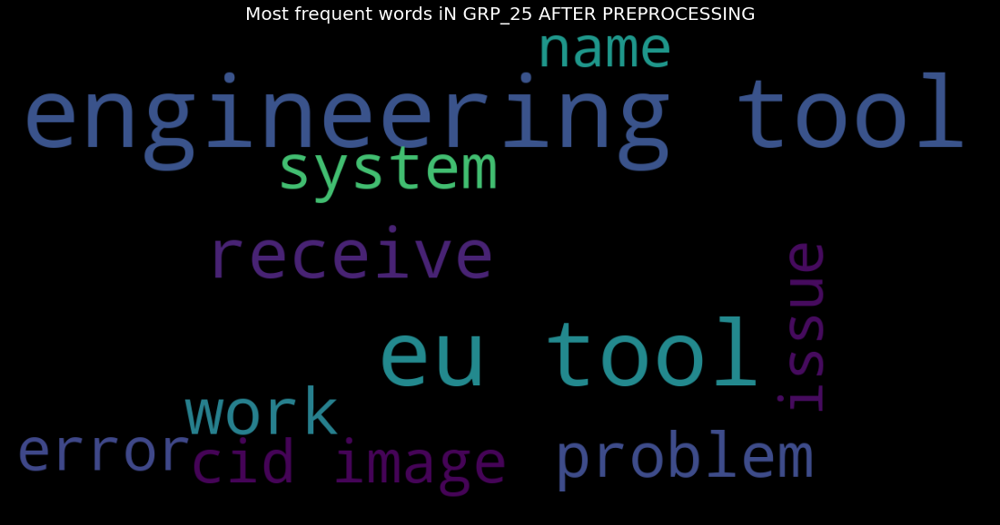



{'printer': 1.0, 'pc': 0.8636363636363636, 'work': 0.7272727272727273, 'defective': 0.4772727272727273, 'germany': 0.45454545454545453, 'system': 0.38636363636363635, 'problem': 0.38636363636363635, 'check': 0.36363636363636365, 'receive': 0.29545454545454547, 'phone': 0.2727272727272727}




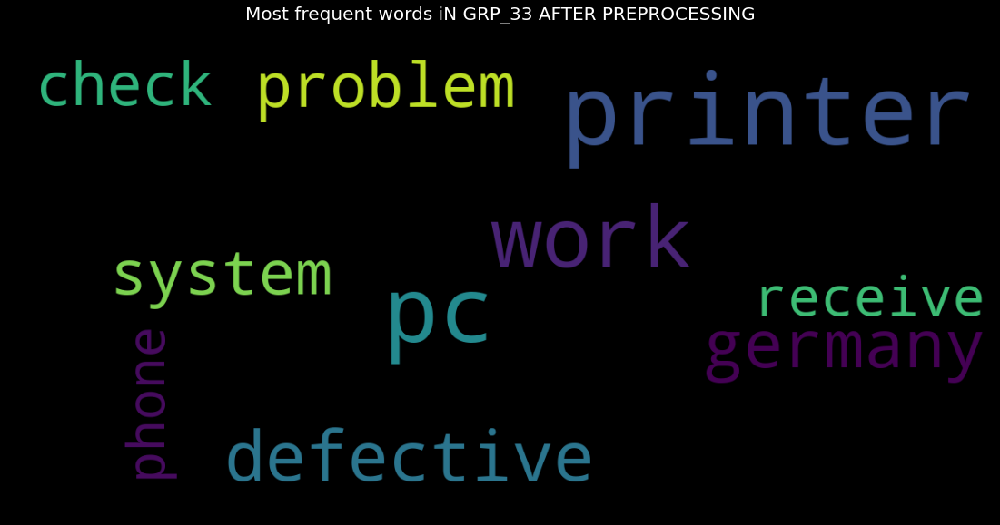



  New Group Orig Group                                          Top Words
0    GRP_CL      GRP_5  (fail job, job scheduler, tool company, receiv...
1    GRP_CL     GRP_10  (fail job, job hr, hr payroll, payroll fail, j...
2    GRP_CL     GRP_13  (inwarehouse tool, order, customer, receive, e...
3    GRP_CL     GRP_14  (erp, sid, hostname, issue, server, error, pro...
4    GRP_CL     GRP_25  (engineering tool, eu tool, receive, work, sys...
5    GRP_CL     GRP_33  (printer, pc, work, defective, germany, system...


In [ ]:
# view word cloud for GRP_CL
grpvalue = 'CL'
grpvalstr = "GRP_"+str(grpvalue)
assignmentgrp_CL = incident_df_final['Assignment group'][incident_df_final['New Assignment group'].isin([grpvalstr])].unique()

for i in range(assignmentgrp_CL.size):
  wordcloud = build_wordcloud(assignmentgrp_CL[i],10,True)
  show_wordcloud(wordcloud,assignmentgrp_CL[i])
  wordsby_grp_CL.loc[len(wordsby_grp_CL.index)] = [grpvalstr, assignmentgrp_CL[i], wordcloud.words_.keys()]

print(wordsby_grp_CL)

{'pc': 1.0, 'printer': 0.8260869565217391, 'issue': 0.782608695652174, 'laptop': 0.7608695652173914, 'computer': 0.6956521739130435, 'sep asa': 0.6956521739130435, 'inside sep': 0.6521739130434783, 'work': 0.6304347826086957, 'print': 0.6086956521739131, 'connect': 0.6086956521739131}




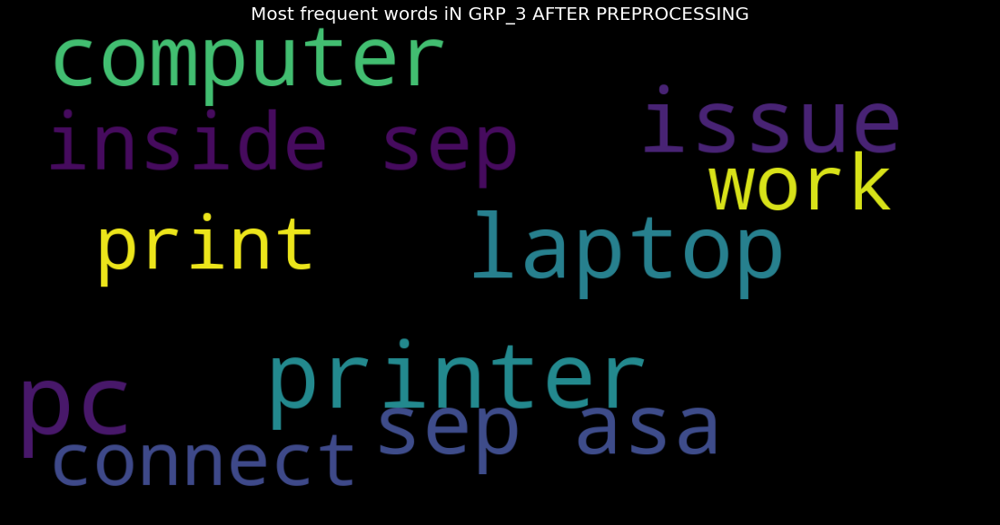



{'job job': 1.0, 'fail job': 0.8390243902439024, 'job scheduler': 0.7365853658536585, 'job fail': 0.6439024390243903, 'tool company': 0.6, 'receive monitoring': 0.4878048780487805, 'monitoring tool': 0.4878048780487805, 'company job': 0.4292682926829268, "job scheduler'": 0.4292682926829268, 'scheduler receive': 0.4097560975609756}




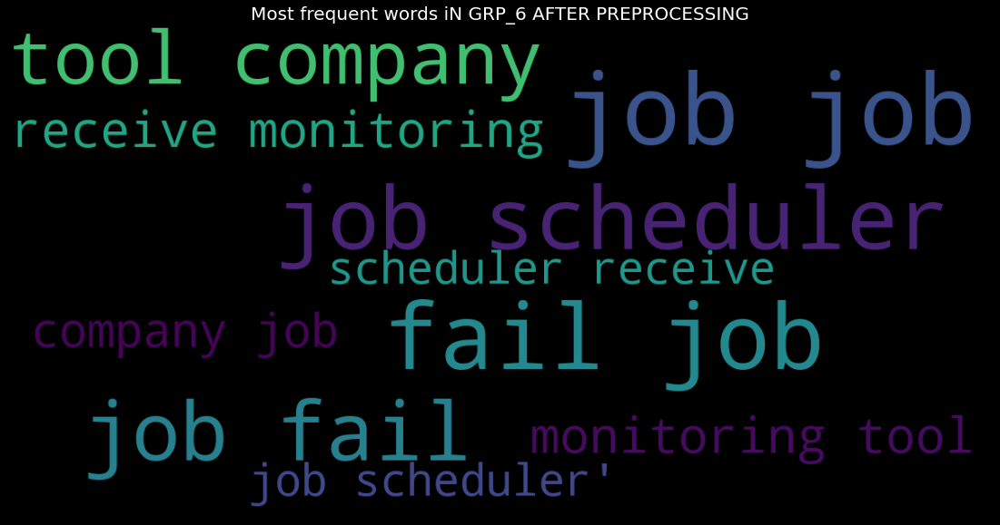



  New Group Orig Group                                          Top Words
0    GRP_CC      GRP_3  (pc, printer, issue, laptop, computer, sep asa...
1    GRP_CC      GRP_6  (job job, fail job, job scheduler, job fail, t...


In [ ]:
# view word cloud for GRP_CC
grpvalue = 'CC'
grpvalstr = "GRP_"+str(grpvalue)
assignmentgrp_CC = incident_df_final['Assignment group'][incident_df_final['New Assignment group'].isin([grpvalstr])].unique()

for i in range(assignmentgrp_CC.size):
  wordcloud = build_wordcloud(assignmentgrp_CC[i],10,True)
  show_wordcloud(wordcloud,assignmentgrp_CC[i])
  wordsby_grp_CC.loc[len(wordsby_grp_CC.index)] = [grpvalstr, assignmentgrp_CC[i], wordcloud.words_.keys()]

print(wordsby_grp_CC)

Group 3 and Grp 33 can be merged - similar key words

Group 5 and Grp 6 can be merged - similar key words

Group 48, GRP 30, GRP 31 mostly has some unreadable texts / font - probably some encrypted values or other language words 

Group 8 and GRP 9 can be merged - similar words tagged; Also there are few other groups which are related to job failure

There are few small groups related to ERP based tickets that can be grouped

Remove words like - Please ; yes ; no; na; per; sorry; wait; confirm; need; ticket; unable; able ; user; usa ; die
can we remove 'receive' - it is in many places
'job fail'
'fail job'
'job job'



In [ ]:
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_3','New Assignment group' ] = 'GRP_3_33'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_33','New Assignment group' ] = 'GRP_3_33'
incident_df_final[incident_df_final['New Assignment group']=='GRP_3_33']

,Assignment group,New Assignment group,Full Description,Full Description - After Lemmatized,Language
17,GRP_3,GRP_3_33,"when undocking pc , screen will not come back",undocking pc screen not come back,en
124,GRP_3,GRP_3_33,internal keybankrd will not work after cs nor ...,internal keybankrd not work cs external usb ke...,en
227,GRP_3,GRP_3_33,internet explorer issues user is having issues...,internet explorer issue issue internet explore...,en
237,GRP_3,GRP_3_33,printer problem / issue information please com...,printer problem issue information complete req...,en
318,GRP_3,GRP_3_33,computer in the maintenance dept. is down. ple...,computer maintenance dept fix,en
...,...,...,...,...,...
8258,GRP_3,GRP_3_33,xerox copier prtqx7302 will not scan to email.,xerox copier prtqx not scan email,en
8292,GRP_33,GRP_3_33,mobiltelefon defekt mobiltelefon gigaset m2 pr...,mobile phone defective mobile phone gigaset pr...,en
8311,GRP_33,GRP_3_33,der drucker fÃ¼r die ups-lapels druckt nicht r...,printer ups lapels not print correctly printer...,en
8358,GRP_3,GRP_3_33,telephony_software is missing from pc pc recei...,telephony software miss pc pc receive multiple...,en


In [ ]:
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_30','New Assignment group' ] = 'GRP_30_31_48'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_31','New Assignment group' ] = 'GRP_30_31_48'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_48','New Assignment group' ] = 'GRP_30_31_48'
incident_df_final[incident_df_final['New Assignment group']=='GRP_30_31_48']

,Assignment group,New Assignment group,Full Description,Full Description - After Lemmatized,Language
274,GRP_30,GRP_30_31_48,outlookæ”¶åˆ°ç®±ä¸­folderå_x008f_˜ä¸ºæ¯_x008f_...,outlook folder folder office,en
275,GRP_31,GRP_30_31_48,can not login skype \n\nreceived from: icvulkw...,not login skype receive icvulkwh udnyietg dear...,en
467,GRP_31,GRP_30_31_48,ieæµ_x008f_è§ˆå™¨æ‰“å¼€crmç³»ç»Ÿå_x0090_Žæ_x00...,ie crm crm,en
471,GRP_31,GRP_30_31_48,desktop item missing when save attachment .,desktop item miss save attachment,en
485,GRP_31,GRP_30_31_48,msd - office 2013 outlook æ‰“ä¸_x008d_å¼€ï¼Œæ˜...,msd office outlook provide detail issue melhdu...,en
...,...,...,...,...,...
8124,GRP_31,GRP_30_31_48,windows need to be repair,window repair,en
8140,GRP_30,GRP_30_31_48,erpæ— æ³•è¿›è¡Œé‡‡è´­ï¼ˆè½¬ç»™è´ºæ­£å¹³ï¼‰ è¿›...,erp,en
8144,GRP_30,GRP_30_31_48,å¯†ç _x0081_æ›´æ”¹å_x0090_Žï¼Œoutlookæ— æ³•ç™»é™†,outlook,en
8329,GRP_30,GRP_30_31_48,æ— æ³•ç™»é™†hr_toolè€ƒå‹¤ç³»ç»Ÿ æ˜¾ç¤ºjavaæ_x0...,hr tool java,en


In [ ]:
# job failure - 5,6,10,57,60,8,9

incident_df_final.loc[incident_df_final['Assignment group']=='GRP_5','New Assignment group' ] = 'GRP_JOBFAIL'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_6','New Assignment group' ] = 'GRP_JOBFAIL'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_10','New Assignment group' ] = 'GRP_JOBFAIL'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_57','New Assignment group' ] = 'GRP_JOBFAIL'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_60','New Assignment group' ] = 'GRP_JOBFAIL'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_8','New Assignment group' ] = 'GRP_JOBFAIL'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_9','New Assignment group' ] = 'GRP_JOBFAIL'

incident_df_final[incident_df_final['New Assignment group']=='GRP_JOBFAIL']

,Assignment group,New Assignment group,Full Description,Full Description - After Lemmatized,Language
43,GRP_5,GRP_JOBFAIL,please reroute jobs on printer01 to printer02 ...,reroute job printer printer issue resolve toda...,en
47,GRP_6,GRP_JOBFAIL,job Job_1424 failed in job_scheduler at: 10/31...,job job fail job scheduler receive monitoring ...,en
50,GRP_8,GRP_JOBFAIL,job mm_zscr0099_dly_merktc3 failed in job_sche...,job mm zscr dly merktc fail job scheduler rece...,en
56,GRP_6,GRP_JOBFAIL,need dn for material 3346599/ plant plant_197/...,dn material plant plant pc dn material plant p...,en
58,GRP_8,GRP_JOBFAIL,job mm_zscr0099_dly_merktc2 failed in job_sche...,job mm zscr dly merktc fail job scheduler rece...,en
...,...,...,...,...,...
8338,GRP_8,GRP_JOBFAIL,abended job in job_scheduler: bkwin_HostName_7...,abended job job scheduler bkwin hostname inc r...,en
8351,GRP_9,GRP_JOBFAIL,customer group enhanced field \n\nreceived fro...,customer group enhance field receive nlearzwi ...,en
8352,GRP_9,GRP_JOBFAIL,ess portal \n\nreceived from: eagvusbr.nguqity...,ess portal receive eagvusbr nguqityl team go e...,en
8353,GRP_8,GRP_JOBFAIL,robot HostName_776 is inactive,robot hostname inactive,en


In [ ]:
incident_df_final[incident_df_final['New Assignment group']=='GRP_JOBFAIL']

,Assignment group,New Assignment group,Full Description,Full Description - After Lemmatized,Language
43,GRP_5,GRP_JOBFAIL,please reroute jobs on printer01 to printer02 ...,reroute job printer printer issue resolve toda...,en
47,GRP_6,GRP_JOBFAIL,job Job_1424 failed in job_scheduler at: 10/31...,job job fail job scheduler receive monitoring ...,en
50,GRP_8,GRP_JOBFAIL,job mm_zscr0099_dly_merktc3 failed in job_sche...,job mm zscr dly merktc fail job scheduler rece...,en
56,GRP_6,GRP_JOBFAIL,need dn for material 3346599/ plant plant_197/...,dn material plant plant pc dn material plant p...,en
58,GRP_8,GRP_JOBFAIL,job mm_zscr0099_dly_merktc2 failed in job_sche...,job mm zscr dly merktc fail job scheduler rece...,en
...,...,...,...,...,...
8338,GRP_8,GRP_JOBFAIL,abended job in job_scheduler: bkwin_HostName_7...,abended job job scheduler bkwin hostname inc r...,en
8351,GRP_9,GRP_JOBFAIL,customer group enhanced field \n\nreceived fro...,customer group enhance field receive nlearzwi ...,en
8352,GRP_9,GRP_JOBFAIL,ess portal \n\nreceived from: eagvusbr.nguqity...,ess portal receive eagvusbr nguqityl team go e...,en
8353,GRP_8,GRP_JOBFAIL,robot HostName_776 is inactive,robot hostname inactive,en


In [ ]:
# ERP - 11,20,21,35,40,41,45,49,52,53,59,18,29,14

incident_df_final.loc[incident_df_final['Assignment group']=='GRP_11','New Assignment group' ] = 'GRP_ERP'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_20','New Assignment group' ] = 'GRP_ERP'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_21','New Assignment group' ] = 'GRP_ERP'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_35','New Assignment group' ] = 'GRP_ERP'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_40','New Assignment group' ] = 'GRP_ERP'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_41','New Assignment group' ] = 'GRP_ERP'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_45','New Assignment group' ] = 'GRP_ERP'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_49','New Assignment group' ] = 'GRP_ERP'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_52','New Assignment group' ] = 'GRP_ERP'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_53','New Assignment group' ] = 'GRP_ERP'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_59','New Assignment group' ] = 'GRP_ERP'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_18','New Assignment group' ] = 'GRP_ERP'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_29','New Assignment group' ] = 'GRP_ERP'
incident_df_final.loc[incident_df_final['Assignment group']=='GRP_14','New Assignment group' ] = 'GRP_ERP'


incident_df_final[incident_df_final['New Assignment group']=='GRP_ERP']


,Assignment group,New Assignment group,Full Description,Full Description - After Lemmatized,Language
83,GRP_11,GRP_ERP,engineering tool drawing originals in pdf form...,engineering tool draw original pdf format not ...,en
129,GRP_14,GRP_ERP,intermittent service on configair server in SI...,intermittent service configair server sid requ...,en
160,GRP_14,GRP_ERP,HostName_1297 is currently experiencing high c...,hostname currently experience high cpu utiliza...,en
169,GRP_18,GRP_ERP,[urgent!!] delivery note creation request!! \...,urgent delivery note creation request receive ...,en
184,GRP_20,GRP_ERP,data not correctly pulled for all the employee...,data not correctly pull employee travel tool a...,en
...,...,...,...,...,...
8318,GRP_14,GRP_ERP,configair server in production not responding ...,configair server production not respond intern...,en
8341,GRP_18,GRP_ERP,plant_101 value added services - one day pick ...,plant value add service one day pick route pro...,en
8361,GRP_29,GRP_ERP,check status in purchasing please contact ed p...,check status purchase contact ed pasgryowski p...,en
8366,GRP_29,GRP_ERP,emails not coming in from zz mail \n\nreceived...,email not come zz mail receive avglmrts vhqmti...,en


In [ ]:
# Merging the groups with counts less than 100 and 150 to one group for simplicity as there are only 11 sub groups now

incident_df_final.loc[incident_df_final['New Assignment group']=='GRP_C','New Assignment group' ] = 'GRP_C_CL'
incident_df_final.loc[incident_df_final['New Assignment group']=='GRP_CL','New Assignment group' ] = 'GRP_C_CL'


incident_df_final[incident_df_final['New Assignment group']=='GRP_C_CL']

,Assignment group,New Assignment group,Full Description,Full Description - After Lemmatized,Language
32,GRP_4,GRP_C_CL,duplication of network address. \n\nreceived f...,duplication network address receive kxsceyzo n...,en
49,GRP_7,GRP_C_CL,status does not change on telephony_software w...,status not change telephony software close cal...,en
111,GRP_13,GRP_C_CL,job Job_2881 failed in job_scheduler at: 10/28...,job job fail job scheduler receive monitoring ...,en
150,GRP_16,GRP_C_CL,i used to have acces to this location on colla...,acces location collaboration platform not acce...,en
154,GRP_17,GRP_C_CL,reset passwords for hckvpary emxbpkwy using pa...,reset password hckvpary emxbpkwy password mana...,en
...,...,...,...,...,...
8308,GRP_25,GRP_C_CL,bls (beschichtungsleitstand) germany workflow ...,bls beschichtungsleitstand germany workflow er...,en
8317,GRP_7,GRP_C_CL,turn off telephony_software for turkey between...,turn telephony software turkey local time turn...,en
8328,GRP_13,GRP_C_CL,calculation of the claim amount will make a mi...,calculation claim amount make mistake uxndyfrs...,en
8342,GRP_16,GRP_C_CL,please review your recent ticketing_tool ticke...,review recent tool let know modify ethic colla...,en


In [ ]:
wordsby_grp_L


,New Group,Orig Group,Top Words
0,GRP_L,GRP_1,"(hostname, space consume, consume space, job, ..."
1,GRP_L,GRP_11,"(engineering tool, erp, work, draw, plm, mater..."
2,GRP_L,GRP_15,"(crm, receive, erp crm, email, account, employ..."
3,GRP_L,GRP_20,"(erp, change, send, data, tool, save, work, em..."
4,GRP_L,GRP_21,"(distributor tool, price, issue, report, quote..."
5,GRP_L,GRP_22,"(crm, access, receive, error, contact, issue, ..."
6,GRP_L,GRP_23,"(ethic, company, course, receive, ethic train,..."
7,GRP_L,GRP_27,"(login, outlook, skype, access, email, meeting..."
8,GRP_L,GRP_28,"(receive, new, company, th, help, germany, tea..."
9,GRP_L,GRP_30,"(tuqrvowp fxmzkvqo, event, pro pz, pz dn, dn i..."


In [ ]:
# incident_df_final.loc[incident_df_final['Assignment group']=='GRP_0_Account','Assignment group' ] = 'GRP_0'
# incident_df_final.loc[incident_df_final['Assignment group']=='GRP_0_AppSW','Assignment group' ] = 'GRP_0'
# incident_df_final.loc[incident_df_final['Assignment group']=='GRP_0_Eml_Ph','Assignment group' ] = 'GRP_0'
# incident_df_final.loc[incident_df_final['Assignment group']=='GRP_0_Hdware','Assignment group' ] = 'GRP_0'
# incident_df_final.loc[incident_df_final['Assignment group']=='GRP_0_Ntw_Srv','Assignment group' ] = 'GRP_0'
# incident_df_final.loc[incident_df_final['Assignment group']=='GRP_0_Pw_rset','Assignment group' ] = 'GRP_0'
# incident_df_final.loc[incident_df_final['Assignment group']=='GRP_0_others','Assignment group' ] = 'GRP_0'

In [ ]:
wordsby_grp_C

,New Group,Orig Group,Top Words
0,GRP_C,GRP_4,"(company, access sw, issue, backup circuit, wi..."
1,GRP_C,GRP_7,"(telephony software, call, phone, password, ch..."
2,GRP_C,GRP_16,"(collaboration platform, access, receive, file..."
3,GRP_C,GRP_17,"(reset password, password management, manageme..."
4,GRP_C,GRP_18,"(receive, delivery note, delivery, erp, ship, ..."
5,GRP_C,GRP_26,"(email, send, company, receive, message, outlo..."
6,GRP_C,GRP_29,"(purchase, po, create, mm, receive, error, mat..."
7,GRP_C,GRP_31,"(event, vpn, ip, connection, id, computer, pro..."
8,GRP_C,GRP_34,"(access, folder, receive, company, vpn, folder..."


In [ ]:

wordsby_grp_CL

,New Group,Orig Group,Top Words
0,GRP_CL,GRP_5,"(fail job, job scheduler, tool company, receiv..."
1,GRP_CL,GRP_10,"(fail job, job hr, hr payroll, payroll fail, j..."
2,GRP_CL,GRP_13,"(inwarehouse tool, order, customer, receive, e..."
3,GRP_CL,GRP_14,"(erp, sid, hostname, issue, server, error, pro..."
4,GRP_CL,GRP_25,"(engineering tool, eu tool, receive, work, sys..."
5,GRP_CL,GRP_33,"(printer, pc, work, defective, germany, system..."


In [ ]:

wordsby_grp_CC


,New Group,Orig Group,Top Words
0,GRP_CC,GRP_3,"(pc, printer, issue, laptop, computer, sep asa..."
1,GRP_CC,GRP_6,"(job job, fail job, job scheduler, job fail, t..."


the final set of classes are 11 and the number of data rows against each class is listed below

In [ ]:
incidentnewset_groupby_NewAssignemntgrp = incident_df_final.groupby(['New Assignment group']).size().reset_index(name='counts')
incidentnewset_groupby_NewAssignemntgrp

,New Assignment group,counts
0,GRP_0,3924
1,GRP_12,257
2,GRP_19,215
3,GRP_2,241
4,GRP_24,285
5,GRP_30_31_48,98
6,GRP_3_33,307
7,GRP_C_CL,699
8,GRP_ERP,550
9,GRP_JOBFAIL,1366


In [ ]:
incidentnewset_groupby_NewAssignemntgrp['New Assignment group'].unique

<bound method Series.unique of 0            GRP_0
1           GRP_12
2           GRP_19
3            GRP_2
4           GRP_24
5     GRP_30_31_48
6         GRP_3_33
7         GRP_C_CL
8          GRP_ERP
9      GRP_JOBFAIL
10           GRP_L
Name: New Assignment group, dtype: object>

In [ ]:
CLASS_COUNT = len(incidentnewset_groupby_NewAssignemntgrp.index)
CLASS_COUNT

11

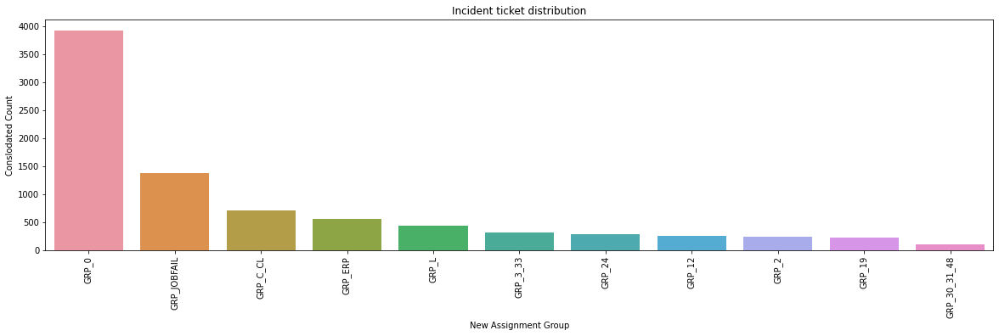

In [ ]:
plt.subplots(figsize = (20,5))

sns.countplot(x='New Assignment group', data=incident_df_final,order = incident_df_final['New Assignment group'].value_counts().index)
plt.xlabel('New Assignment Group') 
plt.ylabel('Conslodated Count') 
plt.xticks(rotation=90)
plt.title('Incident ticket distribution')

plt.show()

In [ ]:
# Lets ignore Group 0 for time being to understand the data spread which is 50% of the data
#Naresh:4/20: No more relevant
temp_data_without_grp0 = incident_df_final[incident_df_final["New Assignment group"] != 'GRP_0']
temp_data_without_grp0 

,Assignment group,New Assignment group,Full Description,Full Description - After Lemmatized,Language
6,GRP_1,GRP_L,event: critical:HostName_221.company.com the v...,event critical hostname company value mountpoi...,en
17,GRP_3,GRP_3_33,"when undocking pc , screen will not come back",undocking pc screen not come back,en
32,GRP_4,GRP_C_CL,duplication of network address. \n\nreceived f...,duplication network address receive kxsceyzo n...,en
43,GRP_5,GRP_JOBFAIL,please reroute jobs on printer01 to printer02 ...,reroute job printer printer issue resolve toda...,en
47,GRP_6,GRP_JOBFAIL,job Job_1424 failed in job_scheduler at: 10/31...,job job fail job scheduler receive monitoring ...,en
...,...,...,...,...,...
8364,GRP_10,GRP_JOBFAIL,"erp fi - ob09, two accounts to be added i am ...",erp fi ob two account add another two account ...,en
8365,GRP_3,GRP_3_33,tablet needs reimaged due to multiple issues w...,tablet reimaged due multiple issue crm wifi etc,en
8366,GRP_29,GRP_ERP,emails not coming in from zz mail \n\nreceived...,email not come zz mail receive avglmrts vhqmti...,en
8369,GRP_62,GRP_L,machine nÃ£o estÃ¡ funcionando i am unable to ...,machine n est funcionando access machine utili...,en


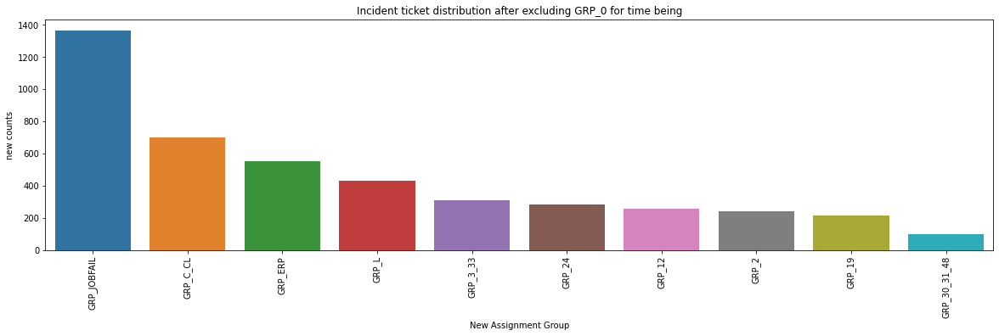

In [ ]:

plt.subplots(figsize = (20,5))

# plt.plot(temp_data_without_grp0["New Assignment group"], order = temp_data_without_grp0['New Assignment group'].value_counts().index) 
sns.countplot(x='New Assignment group', data=temp_data_without_grp0,order = temp_data_without_grp0['New Assignment group'].value_counts().index)
plt.xlabel('New Assignment Group') 
plt.ylabel('new counts') 
plt.xticks(rotation=90)

plt.title('Incident ticket distribution after excluding GRP_0 for time being') 
  

plt.show() 

In [ ]:

del wordsby_grp_L
del wordsby_grp_C
del wordsby_grp_CL
del wordsby_grp_CC

gc.collect()

137584

In [ ]:
wordsby_grp_L = pd.DataFrame(columns = ['New Group', 'Orig Group','Top Words'])
wordsby_grp_C_CL = pd.DataFrame(columns = ['New Group', 'Orig Group','Top Words'])
wordsby_grp_8_9 = pd.DataFrame(columns = ['New Group', 'Orig Group','Top Words'])
wordsby_grp_3_33 = pd.DataFrame(columns = ['New Group', 'Orig Group','Top Words'])
wordsby_grp_ERP = pd.DataFrame(columns = ['New Group', 'Orig Group','Top Words'])
wordsby_grp_JOBFAIL = pd.DataFrame(columns = ['New Group', 'Orig Group','Top Words'])

In [ ]:
# list word cloud for the passed in group code

def list_wordsby_grp(grpvalue,maxcount = 10,subgrp = True):
  grpvalstr = "GRP_"+str(grpvalue)
  wordsby_grp = pd.DataFrame(columns = ['New Group', 'Orig Group','Top Words'])
  if (subgrp == True):
    assignmentgrp = incident_df_final['Assignment group'][incident_df_final['New Assignment group'].isin([grpvalstr])].unique()
    for i in range(assignmentgrp.size):
      wordcloud = build_wordcloud(assignmentgrp[i],maxcount,subgrp)
      # show_wordcloud(wordcloud,assignmentgrp_L[i])
      wordsby_grp.loc[len(wordsby_grp.index)] = [grpvalstr, assignmentgrp[i], wordcloud.words_.keys()]
  else:
    wordcloud = build_wordcloud(grpvalstr,maxcount,subgrp)
    # show_wordcloud(wordcloud,assignmentgrp_L[i])
    wordsby_grp.loc[len(wordsby_grp.index)] = [grpvalstr, grpvalstr, wordcloud.words_.keys()]
  return(wordsby_grp)

In [ ]:
# view word cloud for GRP_L
grpvalue = 'L'
word_subgrp_df = list_wordsby_grp(grpvalue, maxcount = 10,subgrp = True )
word_grp_df = list_wordsby_grp(grpvalue,maxcount = 100,subgrp = False)

In [ ]:
word_subgrp_df

,New Group,Orig Group,Top Words
0,GRP_L,GRP_1,"(hostname, space consume, consume space, job, ..."
1,GRP_L,GRP_15,"(crm, receive, erp crm, email, account, employ..."
2,GRP_L,GRP_22,"(crm, access, receive, error, contact, issue, ..."
3,GRP_L,GRP_23,"(ethic, company, course, receive, ethic train,..."
4,GRP_L,GRP_27,"(login, outlook, skype, access, email, meeting..."
5,GRP_L,GRP_28,"(receive, new, company, th, help, germany, tea..."
6,GRP_L,GRP_36,"(tool, uacyltoe hxgayczeing, time card, timeca..."
7,GRP_L,GRP_37,"(call, phone, work, number, facility, dial, re..."
8,GRP_L,GRP_38,"(hpqc, delete, charm, error, message, maintain..."
9,GRP_L,GRP_39,"(hostname, event, device, space consume, consu..."


In [ ]:
word_grp_df

,New Group,Orig Group,Top Words
0,GRP_L,GRP_L,"(receive, company, crm, hostname, work, system..."


In [ ]:
grpvalue = 'C_CL'
word_subgrp_df = list_wordsby_grp(grpvalue, maxcount = 10,subgrp = True )
word_grp_df = list_wordsby_grp(grpvalue,maxcount = 50,subgrp = False)
print(word_subgrp_df)
print(word_grp_df)

  New Group Orig Group                                          Top Words
0  GRP_C_CL      GRP_4  (company, access sw, issue, backup circuit, wi...
1  GRP_C_CL      GRP_7  (telephony software, call, phone, password, ch...
2  GRP_C_CL     GRP_13  (inwarehouse tool, order, customer, receive, e...
3  GRP_C_CL     GRP_16  (collaboration platform, access, receive, file...
4  GRP_C_CL     GRP_17  (reset password, password management, manageme...
5  GRP_C_CL     GRP_25  (engineering tool, eu tool, receive, work, sys...
6  GRP_C_CL     GRP_26  (email, send, company, receive, message, outlo...
7  GRP_C_CL     GRP_34  (access, folder, receive, company, vpn, folder...
  New Group Orig Group                                          Top Words
0  GRP_C_CL   GRP_C_CL  (receive, company, access, issue, inwarehouse ...


In [ ]:
grpvalue = '8_9'
word_subgrp_df = list_wordsby_grp(grpvalue, maxcount = 10,subgrp = True )
word_grp_df = list_wordsby_grp(grpvalue,maxcount = 50,subgrp = False)
print(word_subgrp_df)
print(word_grp_df)

ValueError: ignored

In [ ]:
grpvalue = '3_33'
word_subgrp_df = list_wordsby_grp(grpvalue, maxcount = 10,subgrp = True )
word_grp_df = list_wordsby_grp(grpvalue,maxcount = 50,subgrp = False)
print(word_subgrp_df)
print(word_grp_df)

  New Group Orig Group                                          Top Words
0  GRP_3_33      GRP_3  (pc, printer, issue, laptop, computer, sep asa...
1  GRP_3_33     GRP_33  (printer, pc, work, defective, germany, system...
  New Group Orig Group                                          Top Words
0  GRP_3_33   GRP_3_33  (pc, work, printer, issue, laptop, system, pri...


In [ ]:
grpvalue = 'ERP'
word_subgrp_df = list_wordsby_grp(grpvalue, maxcount = 10,subgrp = True )
word_grp_df = list_wordsby_grp(grpvalue,maxcount = 50,subgrp = False)
print(word_subgrp_df)
print(word_grp_df)

   New Group Orig Group                                          Top Words
0    GRP_ERP     GRP_11  (engineering tool, erp, work, draw, plm, mater...
1    GRP_ERP     GRP_14  (erp, sid, hostname, issue, server, error, pro...
2    GRP_ERP     GRP_18  (receive, delivery note, delivery, erp, ship, ...
3    GRP_ERP     GRP_20  (erp, change, send, data, tool, save, work, em...
4    GRP_ERP     GRP_21  (distributor tool, price, issue, report, quote...
5    GRP_ERP     GRP_29  (purchase, po, create, mm, receive, error, mat...
6    GRP_ERP     GRP_35  (access, kp, erp, enter, forecast, cost, cente...
7    GRP_ERP     GRP_40  (crm, account, error, erp, issue, create, dyna...
8    GRP_ERP     GRP_41  (mii, order, erp, error, operator, machine, sh...
9    GRP_ERP     GRP_45  (plant, erp, production order, fail job, print...
10   GRP_ERP     GRP_49  (change, erp, search, analytics, ec, track, wo...
11   GRP_ERP     GRP_52  (manager, expense, miss, erp, number, report, ...
12   GRP_ERP     GRP_53  

In [ ]:
grpvalue = 'JOBFAIL'
word_subgrp_df = list_wordsby_grp(grpvalue, maxcount = 10,subgrp = True )
word_grp_df = list_wordsby_grp(grpvalue,maxcount = 50,subgrp = False)
print(word_subgrp_df)
print(word_grp_df)

     New Group Orig Group                                          Top Words
0  GRP_JOBFAIL      GRP_5  (fail job, job scheduler, tool company, receiv...
1  GRP_JOBFAIL      GRP_6  (job job, fail job, job scheduler, job fail, t...
2  GRP_JOBFAIL      GRP_8  (fail job, job job, job scheduler, backup circ...
3  GRP_JOBFAIL      GRP_9  (job job, fail job, job fail, job scheduler, t...
4  GRP_JOBFAIL     GRP_10  (fail job, job hr, hr payroll, payroll fail, j...
5  GRP_JOBFAIL     GRP_57  (job, access, report, dob, global, fail, busie...
6  GRP_JOBFAIL     GRP_60  (fail job, monitoring tool, job hostname, tool...
     New Group   Orig Group                                          Top Words
0  GRP_JOBFAIL  GRP_JOBFAIL  (fail job, job job, job scheduler, tool compan...


creating a new column and removing any numbers that are present as part of the text column. we shall use this column for future modelling

In [ ]:
## join the list members of the column
incident_df_final['Lemmatized_clean_upd']=["".join(description) for description in incident_df_final['Full Description - After Lemmatized'].values]

## From the word clouds it was noticed that the earlier Regular Expression replacement of numbers did not work
incident_df_final['Lemmatized_clean_upd'] = incident_df_final['Lemmatized_clean_upd'].str.replace('\d+', '')

print(incident_df_final['Lemmatized_clean_upd'])

0       login issue verify detail employee manager nam...
1       outlook receive hmjdrvpb komuaywn team meeting...
2       not log vpn receive eylqgodm ybqkwiam not log ...
3                                     access hr tool page
4                                             skype error
                              ...                        
8366    email not come zz mail receive avglmrts vhqmti...
8367                             telephony software issue
8368          vip window password reset tifpdchb pedxruyf
8369    machine n est funcionando access machine utili...
8370    different program not open several pc differen...
Name: Lemmatized_clean_upd, Length: 8371, dtype: object


In [ ]:
incident_df_final.head(20)

,Assignment group,New Assignment group,Full Description,Full Description - After Lemmatized,Language,Lemmatized_clean_upd
0,GRP_0,GRP_0,login issue -verified user details.(employee# ...,login issue verify detail employee manager nam...,en,login issue verify detail employee manager nam...
1,GRP_0,GRP_0,outlook \n\nreceived from: hmjdrvpb.komuaywn@g...,outlook receive hmjdrvpb komuaywn team meeting...,en,outlook receive hmjdrvpb komuaywn team meeting...
2,GRP_0,GRP_0,cant log in to vpn \n\nreceived from: eylqgodm...,not log vpn receive eylqgodm ybqkwiam not log ...,en,not log vpn receive eylqgodm ybqkwiam not log ...
3,GRP_0,GRP_0,unable to access hr_tool page,access hr tool page,en,access hr tool page
4,GRP_0,GRP_0,skype error,skype error,en,skype error
5,GRP_0,GRP_0,unable to log in to engineering tool and skype,log engineering tool skype,en,log engineering tool skype
6,GRP_1,GRP_L,event: critical:HostName_221.company.com the v...,event critical hostname company value mountpoi...,en,event critical hostname company value mountpoi...
7,GRP_0,GRP_0,ticket_no1550391- employment status - new non-...,employment status new non employee enter name,en,employment status new non employee enter name
8,GRP_0,GRP_0,unable to disable add ins on outlook,disable add in outlook,en,disable add in outlook
9,GRP_0,GRP_0,ticket update on inplant_874773,update inplant,en,update inplant


#### Building the Text Augmentation using nlpaug

In [ ]:
inc_orig_valcnt = pd.DataFrame(incident_df_final['New Assignment group'].value_counts())
inc_orig_valcnt.index.values

array(['GRP_0', 'GRP_JOBFAIL', 'GRP_C_CL', 'GRP_ERP', 'GRP_L', 'GRP_3_33',
       'GRP_24', 'GRP_12', 'GRP_2', 'GRP_19', 'GRP_30_31_48'],
      dtype=object)

In [ ]:
max = incident_df_final['New Assignment group'].value_counts().max()
NAG_grp = []
# NAG_grp = incident_df_final['New Assignment group'].unique()
NAG_grp = inc_orig_valcnt.index.values
NAG_grp_t = tuple(e for e in NAG_grp)
NAG_counts = incident_df_final['New Assignment group'].value_counts()
resultdf = pd.DataFrame(tuple(zip(NAG_grp_t, NAG_counts)), columns=['Grp', 'Counts'])
resultdf['Aug_count'] =  max - resultdf['Counts']
no_of_syno_wrds = 3
Aug_sentence_count = 20
resultdf['Aug_sample_needed'] =  round((resultdf['Aug_count']/Aug_sentence_count),ndigits=None)
resultdf

,Grp,Counts,Aug_count,Aug_sample_needed
0,GRP_0,3924,0,0.0
1,GRP_JOBFAIL,1366,2558,128.0
2,GRP_C_CL,699,3225,161.0
3,GRP_ERP,550,3374,169.0
4,GRP_L,429,3495,175.0
5,GRP_3_33,307,3617,181.0
6,GRP_24,285,3639,182.0
7,GRP_12,257,3667,183.0
8,GRP_2,241,3683,184.0
9,GRP_19,215,3709,185.0


In [ ]:
resultdf.Aug_count.sum()

34793

In [ ]:
aug = naw.SynonymAug(aug_src='wordnet',aug_max=no_of_syno_wrds)

new_df2 = pd.DataFrame(columns=['Lemmatized_clean_upd','New Assignment group'], index=[0])

for _, row_resdf in resultdf.iterrows():
  if (row_resdf['Aug_count'] > 0):
    new_df1 = pd.DataFrame(columns=['Lemmatized_clean_upd','New Assignment group'], index=[0])
    
    resdf = resultdf[resultdf['Grp'] == row_resdf['Grp']]
    resdf_smpl_cnt = int(resdf['Aug_sample_needed'])

    df = incident_df_final[incident_df_final['New Assignment group'] == row_resdf['Grp']]
    df = df.loc[np.random.choice(df.index, size=resdf_smpl_cnt)]
    df1 = df['Lemmatized_clean_upd']
    
    for _, row in df1.items():
      new_df=pd.DataFrame(aug.augment(row,n=Aug_sentence_count),columns=['Lemmatized_clean_upd'])
      new_df1 = new_df1.append(new_df,ignore_index= True)
      new_df1['New Assignment group'] = row_resdf['Grp']
    new_df2 = new_df2.append(new_df1,ignore_index= True)
print(new_df2)

                                    Lemmatized_clean_upd New Assignment group
0                                                    NaN                  NaN
1                                                    NaN          GRP_JOBFAIL
2      job sid hoti failed caper scheduler receive mo...          GRP_JOBFAIL
3      line of work sid hoti failed job scheduler rec...          GRP_JOBFAIL
4      line sid hoti failed job scheduler receive mon...          GRP_JOBFAIL
...                                                  ...                  ...
34786                                        skype skype         GRP_30_31_48
34787                                        skype skype         GRP_30_31_48
34788                                        skype skype         GRP_30_31_48
34789                                        skype skype         GRP_30_31_48
34790                                        skype skype         GRP_30_31_48

[34791 rows x 2 columns]


In [ ]:
new_df2[new_df2.isnull().any(axis=1)]

,Lemmatized_clean_upd,New Assignment group
0,NaN,NaN
1,NaN,GRP_JOBFAIL
2562,NaN,GRP_C_CL
5783,NaN,GRP_ERP
9164,NaN,GRP_L
12665,NaN,GRP_3_33
16286,NaN,GRP_24
19927,NaN,GRP_12
23588,NaN,GRP_2
27269,NaN,GRP_19


In [ ]:
new_df2.shape

(34791, 2)

In [ ]:
new_df2.dropna(inplace=True)
new_df2.shape

(34780, 2)

In [ ]:
new_df2['New Assignment group'].value_counts()

GRP_30_31_48    3820
GRP_19          3700
GRP_2           3680
GRP_12          3660
GRP_24          3640
GRP_3_33        3620
GRP_L           3500
GRP_ERP         3380
GRP_C_CL        3220
GRP_JOBFAIL     2560
Name: New Assignment group, dtype: int64

In [ ]:
new_df1 = incident_df_final[['Lemmatized_clean_upd','New Assignment group']]
new_df1.shape


(8371, 2)

In [ ]:
new_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8371 entries, 0 to 8370
Data columns (total 2 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Lemmatized_clean_upd  8371 non-null   object
 1   New Assignment group  8371 non-null   object
dtypes: object(2)
memory usage: 130.9+ KB


In [ ]:
new_df2.shape

(34780, 2)

In [ ]:
new_df3 = pd.concat([new_df1,new_df2],ignore_index= True)
new_df3.shape

(43151, 2)

In [ ]:
new_df1['New Assignment group'].value_counts()

GRP_0           3924
GRP_JOBFAIL     1366
GRP_C_CL         699
GRP_ERP          550
GRP_L            429
GRP_3_33         307
GRP_24           285
GRP_12           257
GRP_2            241
GRP_19           215
GRP_30_31_48      98
Name: New Assignment group, dtype: int64

In [ ]:
new_df3['New Assignment group'].value_counts()

GRP_ERP         3930
GRP_L           3929
GRP_3_33        3927
GRP_JOBFAIL     3926
GRP_24          3925
GRP_0           3924
GRP_2           3921
GRP_C_CL        3919
GRP_30_31_48    3918
GRP_12          3917
GRP_19          3915
Name: New Assignment group, dtype: int64

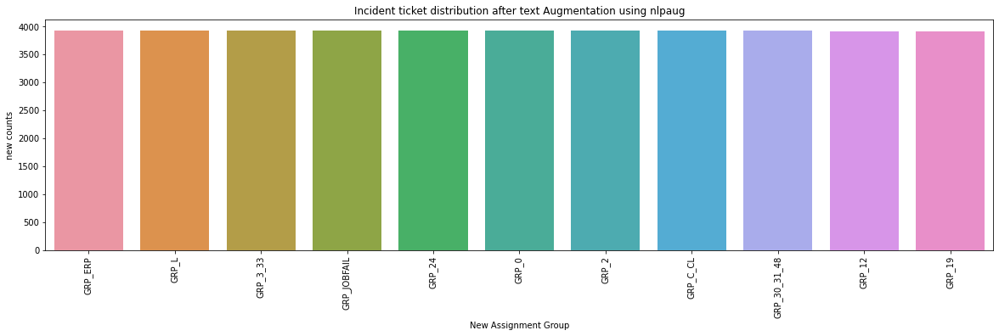

In [ ]:

plt.subplots(figsize = (20,5))

sns.countplot(x='New Assignment group', data=new_df3,order = new_df3['New Assignment group'].value_counts().index)
plt.xlabel('New Assignment Group') 
plt.ylabel('new counts') 
plt.xticks(rotation=90)

plt.title('Incident ticket distribution after text Augmentation using nlpaug') 
  

plt.show() 

creating the csv file for future quick reference and use

In [ ]:
os.chdir('/content/drive/MyDrive/Colab Notebooks/00_Capstone Project/')
new_df3.to_csv('new_df3.csv',index = False)

### Skip to this point to directly load the final data set for model evaluations

In [ ]:
# Read the data from EXCEL
new_df3 = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/00_Capstone Project/new_df3.csv')

In [ ]:
X = new_df3['Lemmatized_clean_upd']
Y = new_df3['New Assignment group']


In [ ]:
label_classes = new_df3['New Assignment group'].unique()

### Build Supervised ML models on the dataset using TFIDF

#### Train, Test Split of the final dataset

In [ ]:
# Train, Test Split
X_train_df, X_test_df, y_train_for_ros, y_test = train_test_split(X, Y, test_size=0.25, random_state=79)

Build the supervised models on the training data created. In this process, you have to do the following:


*   Create the vector counts using Count Vectoriser
*   Transform the word vector to tf-idf
*   Create the train & test data using the train_test_split on the tf-idf & topics






In [ ]:
# vect = CountVectorizer()
# X_train_cntvct = vect.fit(incident_df_final['Lemmatized_clean_upd'])

# Save word vector
# pickle.dump(vect.vocabulary_, open("count_vector.pk1", "wb"))

In [ ]:
tfidf = TfidfVectorizer()
tfidf.fit(X)

# Save tfidf
# pickle.dump(tfidf_transformer, open('tfidf.pk1', "wb"))

TfidfVectorizer()

In [ ]:
X_train_for_ros = tfidf.transform(X_train_df)
X_test = tfidf.transform(X_test_df)

In [ ]:
y_train_for_ros.count()

32363

##### Commenting this portion for the time being as we are using nlpaug text upsampling

In [ ]:
ros = RandomOverSampler()
X_train, y_train = ros.fit_resample(X_train_for_ros, y_train_for_ros)

# # check distribution after applying over sampling 
# y_train.value_counts()

In [ ]:
y_train_for_ros.value_counts()

GRP_30_31_48    2972
GRP_24          2967
GRP_0           2964
GRP_L           2956
GRP_19          2954
GRP_ERP         2943
GRP_C_CL        2941
GRP_12          2938
GRP_JOBFAIL     2937
GRP_3_33        2912
GRP_2           2879
Name: New Assignment group, dtype: int64

In [ ]:
y_train.value_counts()

GRP_12          2972
GRP_30_31_48    2972
GRP_C_CL        2972
GRP_ERP         2972
GRP_JOBFAIL     2972
GRP_24          2972
GRP_L           2972
GRP_2           2972
GRP_0           2972
GRP_19          2972
GRP_3_33        2972
Name: New Assignment group, dtype: int64

##### Common Functions

In [ ]:
# Visualize Confusion Matrix with heatmap
def plot_heatmap(y_test,y_pred):
  fig, ax = plt.subplots(figsize=(7 , 7))
  ax = sns.heatmap(confusion_matrix(y_test, y_pred),
                  annot=True,
                  cbar=False,
                  cmap="RdYlGn", fmt = '0.1f')
  plt.xlabel("Actual label")
  plt.ylabel("Predicted label")
  plt.show()



Lets try few of the Supervised ML models on the train & test data:

Logistic Regression

Decision Tree Classifier

Random Forest Classifier

SVM Classifier

Naive Bayes Classifier

#### Build the different classifier models and train them on Train data

In [ ]:
# logreg = LogisticRegression(random_state=79, solver='liblinear').fit(X_train, y_train)
# dt = DecisionTreeClassifier(random_state=79).fit(X_train, y_train)
# rf = RandomForestClassifier(random_state=79).fit(X_train, y_train)
# svm = LinearSVC(random_state=79,C=1, penalty='l1', dual=False, loss='squared_hinge').fit(X_train, y_train)
# nbayes = MultinomialNB(alpha=1.0).fit(X_train, y_train)

In [ ]:
# # Getting the score of the base trained model
# btr_score_logreg = logreg.score(X_test, y_test )

# # Getting the score of the base model
# btr_score_dt = dt.score(X_test, y_test)

# # Getting the score of the base model
# btr_score_rf = rf.score(X_test, y_test)

# # Getting the score of the base model
# btr_score_svm = svm.score(X_test, y_test)

# # Getting the score of the base model
# btr_score_nbayes = nbayes.score(X_test, y_test)


# print('Score from pre-tuned Train model : ')
# print('Logistic Regression      : ',btr_score_logreg)
# print('Decision Tree Classifier : ',btr_score_dt)
# print('Random Forest Classifer  : ',btr_score_rf)
# print('SVM Classifier           : ',btr_score_svm)
# print('Naive Bayes Classifier   : ',btr_score_nbayes)


In [ ]:
def fit_n_crossvalidate(model, x_train, x_test, y_train, y_test):  
    """
        Description: Trains the model that is passed in the input, does cross validation
        return values: metrics such as accuracy, precision, recall and f1score
    """
    
    fit_start = time.time()         #  capture training time 

    model.fit(x_train, y_train)     # fit the model using the train data
    
    fit_end = time.time()           #  capture training time  
    
    y_pred = model.predict(x_test)  # model predictions on the test data
    
    pred_end = time.time()          #  capture prediction time 
    
    y_train_pred = model.predict(x_train)  # model predictions on the train data
   
    pred_time = pred_end - fit_end  # prediction time
    fit_time = fit_end - fit_start  # fit time
    
    # calculate the metrics on train data - precision, recall and f1 are for y = 1
    accuracy_train = skl_metrics.accuracy_score(y_train, y_train_pred)  
    precision_train = skl_metrics.precision_score(y_train, y_train_pred,average = 'weighted')
    recall_train = skl_metrics.recall_score(y_train, y_train_pred,average = 'weighted')
    f1_train = skl_metrics.f1_score(y_train, y_train_pred,average = 'weighted')
    
        
    # calculate the metrics on test data - precision, recall and f1 are for y = 1
    accuracy_test = skl_metrics.accuracy_score(y_test, y_pred)  
    precision_test = skl_metrics.precision_score(y_test, y_pred,average = 'weighted')
    recall_test = skl_metrics.recall_score(y_test, y_pred,average = 'weighted')
    f1_test = skl_metrics.f1_score(y_test, y_pred,average = 'weighted')

    score = model.score(x_test,y_test)

    test_end = time.time()  #cv completion time
    
    total_time = test_end - fit_start  # calculate the total duration
    
    # return all metrics
    return accuracy_train, precision_train, recall_train, f1_train, accuracy_test, precision_test, recall_test, f1_test, score, pred_time,fit_time,total_time

def print_results(result):
    """
    Description: This function takes input a dictionary and prints it as a dataframe
    return values: dataframe with metrics
    """
    # create dataframe for easy reading of results

    #get values from dictionary
    results_frame = np.array(list(result.values()))

    # round values to single decimal digit
    results_frame = np.round_(results_frame*100,decimals = 1)

    columns = ['Accuracy_Train', 'Precision_Train', 'Recall_Train', 'F1score_Train', 'Accuracy_Test', 'Precision_Test', 'Recall_Test', 'F1score_Test','Score', 'Pred_time', 'Fit_time' , 'Total_time']

    # create dataframe
    resultdf = pd.DataFrame(results_frame,columns= columns, index= result.keys())

    return resultdf

In [ ]:
result = {}   # Create an empty dictionary to later use to store metrics of each of the models

In [ ]:
logreg = LogisticRegression(random_state=79, solver='liblinear')
dt = DecisionTreeClassifier(random_state=79)
rf = RandomForestClassifier(random_state=79)
svm = LinearSVC(random_state=79,C=1, penalty='l1', dual=False, loss='squared_hinge')
nbayes = MultinomialNB(alpha=1.0)
# gb = GradientBoostingClassifier(n_estimators=50,max_depth=3,random_state=79)
# ab = AdaBoostClassifier(base_estimator=dt,n_estimators=50, random_state=79)
xgb = XGBClassifier(n_estimators=50,max_depth=3,random_state=79,verbose=0)
cgb = CatBoostClassifier(n_estimators=50,max_depth=3,random_state=79,verbose=0)
lgb = LGBMClassifier(n_estimators=50,max_depth=3,random_state=79,verbose=0)

In [ ]:
simpleML_models = [logreg, dt, rf, svm, nbayes]
models = [logreg, dt, rf, svm, nbayes, xgb, cgb, lgb]
names = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'SVM', 'NBayes', 'XGBoost', 'CatBoost', 'LightGB']
# models = [logreg, dt, rf, svm, nbayes, gb, ab , xgb, cgb, lgb]
# names = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'SVM', 'NBayes', 'Gradient Boost', 'Adaboost', 'XGBoost', 'CatBoost', 'LightGB']


In [ ]:
# call each model in a for loop and store the results in a dictionary with key as 'names' and values as metrics
for model, name  in zip(models,names):
    print('Model:', model, "Started")
    if model not in simpleML_models:
        result[name] = fit_n_crossvalidate(model,X_train_for_ros, X_test, y_train_for_ros, y_test)
        print('Model:', model, "Completed")
    else:
        result[name] = fit_n_crossvalidate(model,X_train, X_test,y_train, y_test)
        print('Model:', model, "Completed")

ML_models_result = print_results(result)


Model: LogisticRegression(random_state=79, solver='liblinear') Started
Model: LogisticRegression(random_state=79, solver='liblinear') Completed
Model: DecisionTreeClassifier(random_state=79) Started
Model: DecisionTreeClassifier(random_state=79) Completed
Model: RandomForestClassifier(random_state=79) Started
Model: RandomForestClassifier(random_state=79) Completed
Model: LinearSVC(C=1, dual=False, penalty='l1', random_state=79) Started
Model: LinearSVC(C=1, dual=False, penalty='l1', random_state=79) Completed
Model: MultinomialNB() Started
Model: MultinomialNB() Completed
Model: XGBClassifier(n_estimators=50, random_state=79, verbose=0) Started
Model: XGBClassifier(n_estimators=50, objective='multi:softprob', random_state=79,
              verbose=0) Completed
Model: <catboost.core.CatBoostClassifier object at 0x7fc83c80dc90> Started
Model: <catboost.core.CatBoostClassifier object at 0x7fc83c80dc90> Completed
Model: LGBMClassifier(max_depth=3, n_estimators=50, random_state=79, verbose

In [ ]:
ML_models_result.sort_values(by='Accuracy_Test',ascending=False)

,Accuracy_Train,Precision_Train,Recall_Train,F1score_Train,Accuracy_Test,Precision_Test,Recall_Test,F1score_Test,Score,Pred_time,Fit_time,Total_time
Random Forest,99.3,99.3,99.3,99.3,94.6,94.9,94.6,94.7,94.6,50.4,6366.2,6695.2
SVM,97.1,97.1,97.1,97.1,93.7,93.8,93.7,93.7,93.7,0.4,1273.8,1356.8
Logistic Regression,94.1,94.1,94.1,94.1,92.6,92.5,92.6,92.5,92.6,0.5,286.2,374.1
Decision Tree,99.3,99.3,99.3,99.3,90.6,90.4,90.6,90.5,90.6,0.6,482.1,579.0
NBayes,89.6,89.7,89.6,89.6,88.3,88.3,88.3,88.2,88.3,0.4,10.2,74.0
LightGB,77.6,78.0,77.6,77.5,76.1,76.6,76.1,76.0,76.1,7.7,877.6,996.6
XGBoost,77.3,78.0,77.3,77.2,75.9,76.5,75.9,75.8,75.9,25.2,3606.8,3811.0
CatBoost,64.9,66.4,64.9,65.0,64.2,65.9,64.2,64.3,64.2,2.9,1785.9,1877.6


#### Perform Hyper Parameter tuning step for each model

##### Logistic Regression hyper tuning

In [ ]:
if (RUN_HPT_ML_Models):
  logreg_grid = {"C": [1000, 100, 10, 1], "solver": ["liblinear"], "penalty" : ["l1", "l2"], "class_weight" : ["None", "balanced"] }

  # Setup grid hyperparameter search for LogisticRegression
  logreg_hpt = GridSearchCV(logreg, param_grid=logreg_grid, cv=5, verbose=True, n_jobs=-1)

  # Fit random hyperparameter search model
  logreg_hpt.fit(X_train, y_train)

  # Check best parameters
  logreg_hpt.best_params_
else :
  print('Logistic Regression: Skipping Hypertuning step \n')

# Fitting 5 folds for each of 16 candidates, totalling 80 fits
# {'C': 100, 'class_weight': 'balanced', 'penalty': 'l2', 'solver': 'liblinear'}

##### Decision Tree Classifier hyper tuning

In [ ]:
if (RUN_HPT_ML_Models):
  dt_grid = {"max_depth": [160,320,640], "min_samples_split": np.arange(2, 30, 2), "min_samples_leaf": np.arange(1, 5, 2),
            "criterion" : ["gini", "entropy"], "class_weight" : ["None", "balanced"] }
            
  # Setup grid hyperparameter search for Decision tree classifier
  dt_hpt = GridSearchCV(DecisionTreeClassifier(random_state=79), param_grid=dt_grid, cv=5, verbose=True, n_jobs=-1)

  # Fit random hyperparameter search model
  dt_hpt.fit(X_train, y_train)
  # Check best parameters
  dt_hpt.best_params_
else :
  print('Decision Tree: Skipping Hypertuning step \n')

# Fitting 5 folds for each of 336 candidates, totalling 1680 fits
# {'class_weight': 'balanced',
#  'criterion': 'gini',
#  'max_depth': 320,
#  'min_samples_leaf': 1,
#  'min_samples_split': 2}

Fitting 5 folds for each of 336 candidates, totalling 1680 fits


{'class_weight': 'balanced',
 'criterion': 'gini',
 'max_depth': 320,
 'min_samples_leaf': 1,
 'min_samples_split': 2}

##### Random Forest Classifier hyper tuning

In [ ]:
if (RUN_HPT_ML_Models):
  rf_grid = {"n_estimators": np.arange(300, 600, 75), "max_depth": [12,30,6],
            "min_samples_split": np.arange(12, 24, 5), "min_samples_leaf": np.arange(14, 21, 3),
            "criterion" : ["gini", "entropy"], "class_weight" : [None, "balanced"] }

  # Setup random hyperparameter search for Random Forest Classifier
  rf_hpt = HalvingGridSearchCV(RandomForestClassifier(random_state=79), param_grid=rf_grid, cv=5, factor = 2,verbose=True, n_jobs=-1)

  # Fit random hyperparameter search model
  rf_hpt.fit(X_train, y_train)

  # Check best parameters
  rf_hpt.best_params_
else :
  print('Random Forest: Skipping Hypertuning step \n')
# {'class_weight': 'balanced',
#  'criterion': 'entropy',
#  'max_depth': 30,
#  'min_samples_leaf': 14,
#  'min_samples_split': 17,
#  'n_estimators': 525}

n_iterations: 9
n_required_iterations: 9
n_possible_iterations: 9
min_resources_: 139
max_resources_: 35796
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 432
n_resources: 139
Fitting 5 folds for each of 432 candidates, totalling 2160 fits
----------
iter: 1
n_candidates: 216
n_resources: 278
Fitting 5 folds for each of 216 candidates, totalling 1080 fits
----------
iter: 2
n_candidates: 108
n_resources: 556
Fitting 5 folds for each of 108 candidates, totalling 540 fits
----------
iter: 3
n_candidates: 54
n_resources: 1112
Fitting 5 folds for each of 54 candidates, totalling 270 fits
----------
iter: 4
n_candidates: 27
n_resources: 2224
Fitting 5 folds for each of 27 candidates, totalling 135 fits
----------
iter: 5
n_candidates: 14
n_resources: 4448
Fitting 5 folds for each of 14 candidates, totalling 70 fits
----------
iter: 6
n_candidates: 7
n_resources: 8896
Fitting 5 folds for each of 7 candidates, totalling 35 fits
----------
iter: 7
n_candidates: 4
n_re

{'class_weight': 'balanced',
 'criterion': 'entropy',
 'max_depth': 30,
 'min_samples_leaf': 14,
 'min_samples_split': 17,
 'n_estimators': 525}

##### SVM Classifier hyper tuning

In [ ]:
if (RUN_HPT_ML_Models):
  svm_grid = {"C": [ 5, 3, 1],
            "loss": ["squared_hinge"],  "class_weight" : [None, "balanced"]}

  # Setup random hyperparameter search for Random Forest Classifier
  svm_hpt = HalvingGridSearchCV(LinearSVC(random_state=79), param_grid=svm_grid, cv=5, factor = 2, verbose=True, n_jobs=-1)

  # Fit random hyperparameter search model
  svm_hpt.fit(X_train, y_train)

  # Check best parameters
  svm_hpt.best_params_
else :
  print('SVM: Skipping Hypertuning step \n')
# {'C': 3, 'class_weight': 'balanced', 'loss': 'squared_hinge'}

n_iterations: 3
n_required_iterations: 3
n_possible_iterations: 3
min_resources_: 8949
max_resources_: 35796
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 6
n_resources: 8949
Fitting 5 folds for each of 6 candidates, totalling 30 fits
----------
iter: 1
n_candidates: 3
n_resources: 17898
Fitting 5 folds for each of 3 candidates, totalling 15 fits
----------
iter: 2
n_candidates: 2
n_resources: 35796
Fitting 5 folds for each of 2 candidates, totalling 10 fits


{'C': 3, 'class_weight': 'balanced', 'loss': 'squared_hinge'}

##### Naive Bayes Classifier hyper tuning

In [ ]:
if (RUN_HPT_ML_Models):
  nbayes_grid = {"alpha": [ 1.0, 0.1, 0.01, 0.001]}

  # Setup random hyperparameter search for Random Forest Classifier
  nbayes_hpt = HalvingGridSearchCV(MultinomialNB(), param_grid=nbayes_grid, cv=5, factor=2,verbose=True, n_jobs=-1)

  # Fit random hyperparameter search model
  nbayes_hpt.fit(X_train, y_train)

  # Check best parameters
  nbayes_hpt.best_params_
else :
  print('Naive Bayes: Skipping Hypertuning step \n')
# {'alpha': 0.01}

n_iterations: 3
n_required_iterations: 3
n_possible_iterations: 3
min_resources_: 8949
max_resources_: 35796
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 4
n_resources: 8949
Fitting 5 folds for each of 4 candidates, totalling 20 fits
----------
iter: 1
n_candidates: 2
n_resources: 17898
Fitting 5 folds for each of 2 candidates, totalling 10 fits
----------
iter: 2
n_candidates: 1
n_resources: 35796
Fitting 5 folds for each of 1 candidates, totalling 5 fits


{'alpha': 0.01}

In [ ]:
if (RUN_HPT_ML_Models):
  gb = GradientBoostingClassifier(random_state=79,verbose=1)

  n_estimators = [50] #range(50,70,10) # I ran this upto 200, but classifier came back with best etimator as 50; so changed it to lesser range
  max_depth_range = [30,60,90] # range(160,640,160)
  gb_grid = dict(n_estimators=n_estimators, max_depth=max_depth_range)    # define parameter grid based on these parameters

  gb_hpt = HalvingGridSearchCV(gb, param_grid = gb_grid, cv=5, factor=2,verbose=True, n_jobs=-1) # finding best parameters using gridsearch

  gb_hpt.fit(X_train, y_train) # fit the model

  gb_hpt.best_params_   # Check best parameters
else :
  print('Gradient Boost: Skipping Hypertuning step \n')

# { 'max_depth': 60, 'n_estimators': 50}


In [ ]:
if (RUN_HPT_ML_Models):
  ab = AdaBoostClassifier(base_estimator= dt, random_state=79) 

  n_estimators = [30,60,90] #range(50,75,10) # I ran this upto 200, but classifier came back with best etimator as 60; so changed it to lesser range
  ab_grid = dict(n_estimators=n_estimators)    # define parameter grid based on these parameters


  ab_hpt = HalvingGridSearchCV(ab, param_grid = ab_grid, cv=5,factor=2, verbose=True, n_jobs=-1) # finding best parameters using gridsearch

  ab_hpt.fit(X_train, y_train)  # fit the model

  ab_hpt.best_params_   # Check best parameters
else :
  print('AdaBoost: Skipping Hypertuning step \n')

n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 17898
max_resources_: 35796
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 2
n_resources: 17898
Fitting 5 folds for each of 2 candidates, totalling 10 fits
----------
iter: 1
n_candidates: 1
n_resources: 35796
Fitting 5 folds for each of 1 candidates, totalling 5 fits


{'n_estimators': 90}

In [ ]:
if (RUN_HPT_ML_Models):
  xgb = XGBClassifier(random_state=79,verbose=0)

  n_estimators = [50]    #range(50,75,10) # number of estimators  #--  I ran this upto 200, but classifier came back with best etimator as 50; so changed it to lesser range
  max_depth_range = [30,60,90] #range(160,640,160) # tree depth
  learning_rate = [0.3] #learning rate
  param_grid = dict(learning_rate=learning_rate,max_depth=max_depth_range,n_estimators=n_estimators)    # define parameter grid based on these parameters

  xgb_hpt = HalvingGridSearchCV(xgb, param_grid, cv=5,factor=2, verbose=True, n_jobs=-1) # finding best parameters using gridsearch

  xgb_hpt.fit(X_train, y_train)  # fit the model

  xgb_hpt.best_params_   # Check best parameters
else :
  print('XG Boost: Skipping Hypertuning step \n')
# {'learning_rate': 0.3, 'max_depth': 60, 'n_estimators': 50}


n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 17898
max_resources_: 35796
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 3
n_resources: 17898
Fitting 5 folds for each of 3 candidates, totalling 15 fits
----------
iter: 1
n_candidates: 2
n_resources: 35796
Fitting 5 folds for each of 2 candidates, totalling 10 fits


{'learning_rate': 0.3, 'max_depth': 60, 'n_estimators': 50}

In [ ]:
if (RUN_HPT_ML_Models):
  cgb = CatBoostClassifier(random_state=79,verbose=0)

  n_estimators = [50] #range(50,75,10) # number of estimators  #--  I ran this upto 200, but classifier came back with best estimator as 70; so changed it to lesser range
  max_depth_range = [30,90] #range(160,640,160) # tree depth
  learning_rate = [0.3] #  [0.1,0.3,0.5] #learning rate
  auto_class_weights=[None,'balanced']

  param_grid = dict(learning_rate=learning_rate,max_depth=max_depth_range,n_estimators=n_estimators,auto_class_weights=auto_class_weights)    # define parameter grid based on these parameters

  cgb_hpt = HalvingGridSearchCV(xgb, param_grid, cv=5,factor=2, verbose=True, n_jobs=-1) # finding best parameters using gridsearch

  cgb_hpt.fit(X_train, y_train) # fit the model

  cgb_hpt.best_params_   # Check best parameters
else :
  print('CatBoost: Skipping Hypertuning step \n')
"""
{'auto_class_weights': None,
 'learning_rate': 0.3,
 'max_depth': 30,
 'n_estimators': 50}
 """

n_iterations: 3
n_required_iterations: 3
n_possible_iterations: 3
min_resources_: 8949
max_resources_: 35796
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 6
n_resources: 8949
Fitting 5 folds for each of 6 candidates, totalling 30 fits
----------
iter: 1
n_candidates: 3
n_resources: 17898
Fitting 5 folds for each of 3 candidates, totalling 15 fits
----------
iter: 2
n_candidates: 2
n_resources: 35796
Fitting 5 folds for each of 2 candidates, totalling 10 fits


{'auto_class_weights': None,
 'learning_rate': 0.3,
 'max_depth': 30,
 'n_estimators': 50}

In [ ]:
if (RUN_HPT_ML_Models):
  lgb = LGBMClassifier(random_state=79,verbose=0)

  n_estimators = [50] # range(50,75,10) # number of estimators  #--  I ran this upto 200, but classifier came back with best estimator as 70; so changed it to lesser range
  max_depth_range = range(30,240,60) # tree depth
  learning_rate = [0.1,0.3,0.5] #learning rate
  auto_class_weights=[None,'balanced']

  param_grid = dict(learning_rate=learning_rate,max_depth=max_depth_range,n_estimators=n_estimators,auto_class_weights=auto_class_weights)    # define parameter grid based on these parameters

  lgb_hpt = HalvingGridSearchCV(xgb, param_grid, cv=5,factor=2, verbose=True, n_jobs=-1) # finding best parameters using gridsearch

  lgb_hpt.fit(X_train, y_train) # fit the model

  lgb_hpt.best_params_   # Check best parameters
else :
  print('LightGBoost: Skipping Hypertuning step \n')
"""
{'auto_class_weights': None,
 'learning_rate': 0.3,
 'max_depth': 90,
 'n_estimators': 50}
 """

n_iterations: 5
n_required_iterations: 5
n_possible_iterations: 5
min_resources_: 2237
max_resources_: 35796
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 24
n_resources: 2237
Fitting 5 folds for each of 24 candidates, totalling 120 fits
----------
iter: 1
n_candidates: 12
n_resources: 4474
Fitting 5 folds for each of 12 candidates, totalling 60 fits
----------
iter: 2
n_candidates: 6
n_resources: 8948
Fitting 5 folds for each of 6 candidates, totalling 30 fits
----------
iter: 3
n_candidates: 3
n_resources: 17896
Fitting 5 folds for each of 3 candidates, totalling 15 fits
----------
iter: 4
n_candidates: 2
n_resources: 35792
Fitting 5 folds for each of 2 candidates, totalling 10 fits


{'auto_class_weights': None,
 'learning_rate': 0.3,
 'max_depth': 90,
 'n_estimators': 50}

#### Training the models with the hyper tuned parameters

In [ ]:
logreg_hpt = LogisticRegression(random_state=79, C=100,solver='liblinear',penalty ='l2',class_weight = 'balanced')

dt_hpt = DecisionTreeClassifier(random_state=79, class_weight='balanced', criterion = 'gini', max_depth = 320, min_samples_leaf= 1, min_samples_split = 2 )

# rf_hpt = RandomForestClassifier(random_state=79,class_weight= 'balanced',criterion= 'entropy',max_depth= 30,min_samples_leaf= 14,min_samples_split= 17,n_estimators= 525)
rf_hpt = RandomForestClassifier(random_state=79)

svm_hpt = LinearSVC(random_state=79,C=3,class_weight= 'balanced', loss='squared_hinge')

nbayes_hpt = MultinomialNB(alpha=0.01)

# gb_hpt = GradientBoostingClassifier(n_estimators=90,max_depth=60,random_state=79)

# ab_hpt = AdaBoostClassifier(base_estimator=dt_hpt,n_estimators=90, random_state=79)

xgb_hpt = XGBClassifier(n_estimators=50,max_depth=60,learning_rate= 0.3,random_state=79)

# cgb_hpt = CatBoostClassifier(n_estimators=50,max_depth=16,auto_class_weights= None,learning_rate= 0.3,random_state=79)

lgb_hpt = LGBMClassifier(n_estimators=50,max_depth=90,auto_class_weights= None,learning_rate= 0.3,random_state=79)


In [ ]:
result = {}   # Create an empty dictionary to later use to store metrics of each of the models

In [ ]:
# simpleML_models = [logreg, dt, rf, svm, nbayes]
# models = [logreg, dt, rf, svm, nbayes, gb, ab , xgb, cgb, lgb]
# names = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'SVM', 'NBayes', 'Gradient Boost', 'Adaboost', 'XGBoost', 'CatBoost', 'LightGB']

models = [logreg_hpt, dt_hpt, rf_hpt, svm_hpt, nbayes_hpt, xgb_hpt, lgb_hpt]
names = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'SVM', 'NBayes', 'XGBoost', 'LightGB']


In [ ]:
# call each model in a for loop and store the results in a dictionary with key as 'names' and values as metrics
for model, name  in zip(models,names):
    print('Model:', model, "Started")
    result[name] = fit_n_crossvalidate(model, X_train, X_test, y_train, y_test)
    print('Model:', model, "Completed")

ML_models_hpt_result = print_results(result)

Model: LogisticRegression(C=100, class_weight='balanced', random_state=79,
                   solver='liblinear') Started
Model: LogisticRegression(C=100, class_weight='balanced', random_state=79,
                   solver='liblinear') Completed
Model: DecisionTreeClassifier(class_weight='balanced', max_depth=320, random_state=79) Started
Model: DecisionTreeClassifier(class_weight='balanced', max_depth=320, random_state=79) Completed
Model: RandomForestClassifier(random_state=79) Started
Model: RandomForestClassifier(random_state=79) Completed
Model: LinearSVC(C=3, class_weight='balanced', random_state=79) Started
Model: LinearSVC(C=3, class_weight='balanced', random_state=79) Completed
Model: MultinomialNB(alpha=0.01) Started
Model: MultinomialNB(alpha=0.01) Completed
Model: XGBClassifier(learning_rate=0.3, max_depth=60, n_estimators=50, random_state=79) Started
Model: XGBClassifier(learning_rate=0.3, max_depth=60, n_estimators=50,
              objective='multi:softprob', random_stat

In [ ]:
ML_models_hpt_result.sort_values(by='Accuracy_Test',ascending=False)

,Accuracy_Train,Precision_Train,Recall_Train,F1score_Train,Accuracy_Test,Precision_Test,Recall_Test,F1score_Test,Score,Pred_time,Fit_time,Total_time
Random Forest,99.3,99.3,99.3,99.3,94.6,94.9,94.6,94.7,94.6,50.6,6334.5,6659.9
LightGB,97.8,97.8,97.8,97.8,94.2,94.2,94.2,94.2,94.2,45.2,6064.9,6374.2
XGBoost,99.3,99.3,99.3,99.3,94.1,94.1,94.1,94.1,94.1,256.8,40589.1,41944.8
SVM,98.3,98.3,98.3,98.3,94.0,94.1,94.0,94.0,94.0,0.4,165.9,248.9
Logistic Regression,98.6,98.6,98.6,98.6,93.9,94.0,93.9,93.9,93.9,0.5,660.0,748.6
Decision Tree,99.3,99.3,99.3,99.3,90.6,90.4,90.6,90.5,90.6,0.4,475.4,559.3
NBayes,93.5,93.6,93.5,93.5,90.4,90.5,90.4,90.4,90.4,0.4,10.5,76.5


In [ ]:
# ML_models_hpt_result

,Accuracy_Train,Precision_Train,Recall_Train,F1score_Train,Accuracy_Test,Precision_Test,Recall_Test,F1score_Test,Score,Pred_time,Fit_time,Total_time
Logistic Regression,96.4,96.6,96.4,96.4,92.2,92.4,92.2,92.2,92.2,0.7,1136.3,1242.1
Decision Tree,98.1,98.2,98.1,98.1,88.9,88.9,88.9,88.9,88.9,0.6,588.7,690.5
Random Forest,98.1,98.1,98.1,98.1,92.5,92.8,92.5,92.6,92.5,70.5,9694.5,10135.1
SVM,96.0,96.3,96.0,96.1,92.2,92.3,92.2,92.2,92.2,0.5,235.7,337.9
NBayes,91.1,92.1,91.1,91.0,88.0,89.0,88.0,87.9,88.0,0.5,13.4,89.7
XGBoost,98.1,98.1,98.1,98.1,92.1,92.1,92.1,92.1,92.1,322.1,53654.6,55386.3
LightGB,96.1,96.3,96.1,96.2,91.9,92.0,91.9,91.9,91.9,70.7,7712.1,8178.7


#### Evaluating the hyper tuned model

In [ ]:
# Storing the scores for model comparison in the final step

ML_model_hpt_Scores = ML_models_hpt_result['Score'].T
# accscr_GrdBoost = ML_model_Scores['Gradient Boost']/100
# accscr_AdaBoost = ML_model_Scores['Adaboost']/100
accscr_XGBoost = ML_model_hpt_Scores['XGBoost']/100
# accscr_CatBoost = ML_model_hpt_Scores['CatBoost']/100
accscr_LGBoost = ML_model_hpt_Scores['LightGB']/100

atu_score_logreg = ML_model_hpt_Scores['Logistic Regression']/100
atu_score_dt = ML_model_hpt_Scores['Decision Tree']/100
atu_score_rf = ML_model_hpt_Scores['Random Forest']/100
atu_score_svm = ML_model_hpt_Scores['SVM']/100
atu_score_nbayes = ML_model_hpt_Scores['NBayes']/100


In [ ]:
ML_models_hpt_recall_acc_score_df = ML_models_hpt_result[['Accuracy_Test','Recall_Test','F1score_Test']].copy()
ML_models_hpt_recall_acc_score_df = ML_models_hpt_recall_acc_score_df.reset_index(level=0)
ML_models_hpt_recall_acc_score_df = ML_models_hpt_recall_acc_score_df.rename(
    columns={ML_models_hpt_recall_acc_score_df.columns[0]:'Model',
    ML_models_hpt_recall_acc_score_df.columns[1]:'Prediction Accuracy Score',
    ML_models_hpt_recall_acc_score_df.columns[2]:'Prediction Recall Score'  ,
    ML_models_hpt_recall_acc_score_df.columns[3]:'Prediction AUC Score'}  )


In [ ]:
ML_models_hpt_recall_acc_score_df

,Model,Prediction Accuracy Score,Prediction Recall Score,Preduction AUC Score
0,Logistic Regression,93.9,93.9,NaN
1,Decision Tree,90.6,90.6,NaN
2,Random Forest,94.6,94.6,NaN
3,SVM,94.0,94.0,NaN
4,NBayes,90.4,90.4,NaN
5,XGBoost,94.1,94.1,NaN
6,LightGB,94.2,94.2,NaN


In [ ]:
print('Score After model tuning done : ')
print('Logistic Regression      : ',atu_score_logreg)
print('Decision Tree Classifier : ',atu_score_dt)
print('Random Forest Classifer  : ',atu_score_rf)
print('SVM Classifier           : ',atu_score_svm)
print('Naive Bayes Classifier   : ',atu_score_nbayes)
# print('Gradient Boost           : ',accscr_GrdBoost)
# print('Adaboost                 : ',accscr_AdaBoost)
print('XGBoost                  : ',accscr_XGBoost)
# print('CatBoost                 : ',accscr_CatBoost)
print('LightGB                  : ',accscr_LGBoost)

Score After model tuning done : 
Logistic Regression      :  0.9390000000000001
Decision Tree Classifier :  0.9059999999999999
Random Forest Classifer  :  0.946
SVM Classifier           :  0.94
Naive Bayes Classifier   :  0.904
XGBoost                  :  0.941
LightGB                  :  0.9420000000000001


#### Pickle each model for future use

In [ ]:
# Save Logistic Regression Model
pickle.dump(logreg_hpt, open("logreg_model.pk1", "wb"))

# Save Deccision Tree Classifier Model
pickle.dump(dt_hpt, open("dt_model.pk1", "wb"))
    
# Save Random Forest Model
pickle.dump(rf_hpt, open("rf_model.pk1", "wb"))

# Save SVM classifier Model
pickle.dump(svm_hpt, open("svm_model.pk1", "wb"))

# Save Random Forest Model
pickle.dump(nbayes_hpt, open("nbayes_model.pk1", "wb"))


In [ ]:
# # Save Gradient Boost Classifier  Model
# pickle.dump(gb, open("gb_model.pk1", "wb"))

# # Save Ada Boost Classifier Model
# pickle.dump(ab, open("ab_model.pk1", "wb"))

# Save XG Boost Classifier Model
pickle.dump(xgb_hpt, open("xgb_model.pk1", "wb"))

# # Save Cat Boost Classifier Model
# pickle.dump(cgb_hpt, open("cgb_model.pk1", "wb"))

# Save LG Boost M Classifier Model
pickle.dump(lgb_hpt, open("lgb_model.pk1", "wb"))

#### Evaluate the model

Load the individual models and make prediction on X_test data to evaluate the model

In [ ]:
# Load pickled Logistic Refression model
logreg_model = pickle.load(open("logreg_model.pk1", "rb"))
# Make predictions on test data
y_pred_logreg_model = logreg_model.predict(X_test)

# Load pickled Decision Tree model
dt_model = pickle.load(open("dt_model.pk1", "rb"))
# Make predictions on test data
y_pred_dt_model = dt_model.predict(X_test)

# Load pickled Random Forest model
rf_model = pickle.load(open("rf_model.pk1", "rb"))
# Make predictions on test data
y_pred_rf_model = rf_model.predict(X_test)

# Load pickled SVM model
svm_model = pickle.load(open("svm_model.pk1", "rb"))
# Make predictions on test data
y_pred_svm_model = svm_model.predict(X_test)

# Load pickled Naive Bayes model
nbayes_model = pickle.load(open("nbayes_model.pk1", "rb"))
# Make predictions on test data
y_pred_nbayes_model = nbayes_model.predict(X_test)

In [ ]:
# # Load pickled Gradient Boost Classifier model
# gb_model = pickle.load(open("gb_model.pk1", "rb"))
# # Make predictions on test data
# y_pred_gb_model = gb_model.predict(X_test)

# # Load pickled Ada Boost Classifier model
# ab_model = pickle.load(open("ab_model.pk1", "rb"))
# # Make predictions on test data
# y_pred_ab_model = ab_model.predict(X_test)

# Load pickled XG Boost Classifier model
xgb_model = pickle.load(open("xgb_model.pk1", "rb"))
# Make predictions on test data
y_pred_xgb_model = xgb_model.predict(X_test)

# # Load pickled Cat Boost Classifier model
# cgb_model = pickle.load(open("cgb_model.pk1", "rb"))
# # Make predictions on test data
# y_pred_cgb_model = cgb_model.predict(X_test)

# Load pickled LG Boost M Classifier model
lgb_model = pickle.load(open("lgb_model.pk1", "rb"))
# Make predictions on test data
y_pred_lgb_model = lgb_model.predict(X_test)

#### Build the Confustion matrix and heat map view

In [ ]:
### DONT REMOVE THIS CODE - lets keep for reference

# # Print Confusion Matrix
# print('Logistic Regression \n')
# print(confusion_matrix(y_test, y_pred_logreg_model))
# print('\n')
# print('Decision Tree Classifier \n')
# print(confusion_matrix(y_test, y_pred_dt_model))
# print('\n')
# print('Random Forest Classifier \n')
# print(confusion_matrix(y_test, y_pred_rf_model))
# print('\n')
# print('SVM Classifier \n')
# print(confusion_matrix(y_test, y_pred_svm_model))
# print('\n')
# print('Naive Bayes Classifier \n')
# print(confusion_matrix(y_test, y_pred_nbayes_model))
# print('\n')

Logistic Regression 



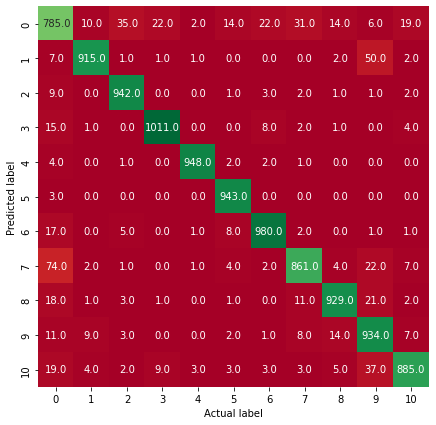



Decision Tree Classifier 



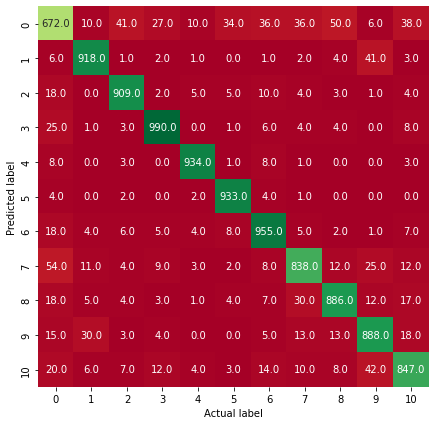



Random Forest Classifier 



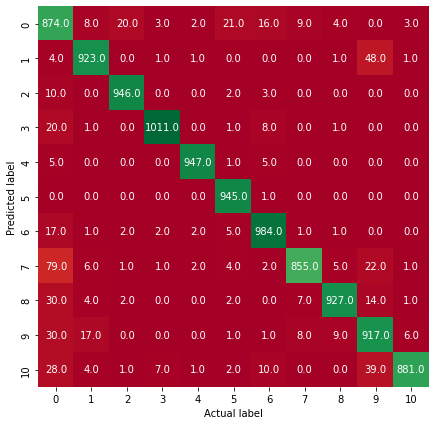



SVM Classifier 



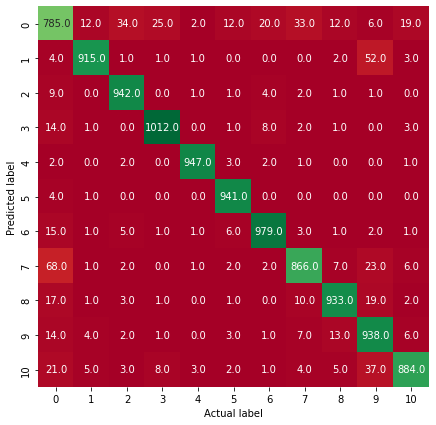



Naive Bayes Classifier 



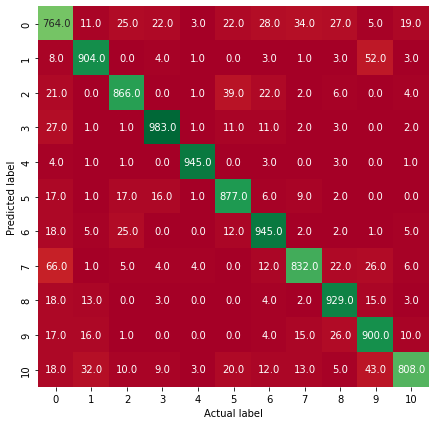

In [ ]:
# Visualize Confusion Matrix with heatmap

print('Logistic Regression \n')
plot_heatmap(y_test,y_pred_logreg_model)
print('\n')
print('Decision Tree Classifier \n')
plot_heatmap(y_test,y_pred_dt_model)
print('\n')
print('Random Forest Classifier \n')
plot_heatmap(y_test,y_pred_rf_model)
print('\n')
print('SVM Classifier \n')
plot_heatmap(y_test,y_pred_svm_model)
print('\n')
print('Naive Bayes Classifier \n')
plot_heatmap(y_test,y_pred_nbayes_model)
print('\n')

XGB Classifier 



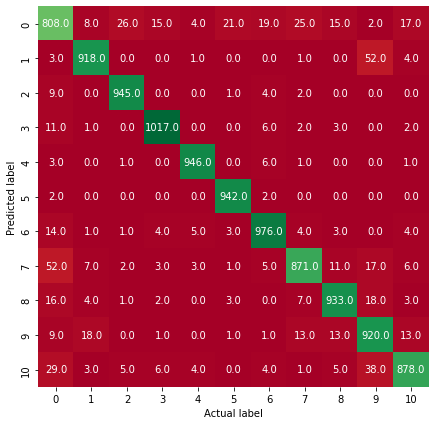



LGBM Classifier 



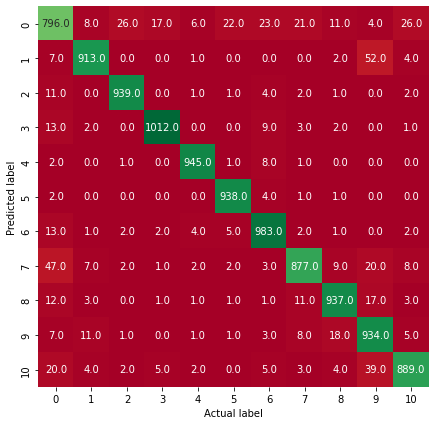

In [ ]:
# Visualize Confusion Matrix with heatmap

# print('Gradient Boost Classifier \n')
# plot_heatmap(y_test,y_pred_gb_model)
# print('\n')
# print('Ada Boost Classifier \n')
# plot_heatmap(y_test,y_pred_ab_model)
# print('\n')
print('XGB Classifier \n')
plot_heatmap(y_test,y_pred_xgb_model)
print('\n')
# print('Cat Boost Classifier \n')
# plot_heatmap(y_test,y_pred_cgb_model)
# print('\n')
print('LGBM Classifier \n')
plot_heatmap(y_test,y_pred_lgb_model)
print('\n')

#### Classification Report for each model
Print the Classification report for each of the model against each Class

In [ ]:
#  Print Classification Report for the models
print('Logistic Regression \n')
print(classification_report(y_test, y_pred_logreg_model))
print('\n')

print('Decision Tree Classifier \n')
print(classification_report(y_test, y_pred_dt_model))
print('\n')

print('Random Forest Classifier \n')
print(classification_report(y_test, y_pred_rf_model))
print('\n')

print('SVM Classifier \n')
print(classification_report(y_test, y_pred_svm_model))
print('\n')

print('Naive Bayes Classifier \n')
print(classification_report(y_test, y_pred_nbayes_model))
print('\n')

# print('Gradient Boost Classifier \n')
# print(classification_report(y_test, y_pred_gb_model))
# print('\n')

# print('Ada Boost Classifier \n')
# print(classification_report(y_test, y_pred_ab_model))
# print('\n')

print('XG Boost Classifier \n')
print(classification_report(y_test, y_pred_xgb_model))
print('\n')

# print('Cat Boost Classifier \n')
# print(classification_report(y_test, y_pred_cgb_model))
# print('\n')

print('Light GBM Classifier \n')
print(classification_report(y_test, y_pred_lgb_model))
print('\n')

Logistic Regression 

              precision    recall  f1-score   support

       GRP_0       0.82      0.82      0.82       960
      GRP_12       0.97      0.93      0.95       979
      GRP_19       0.95      0.98      0.96       961
       GRP_2       0.97      0.97      0.97      1042
      GRP_24       0.99      0.99      0.99       958
GRP_30_31_48       0.96      1.00      0.98       946
    GRP_3_33       0.96      0.97      0.96      1015
    GRP_C_CL       0.93      0.88      0.91       978
     GRP_ERP       0.96      0.94      0.95       987
 GRP_JOBFAIL       0.87      0.94      0.91       989
       GRP_L       0.95      0.91      0.93       973

    accuracy                           0.94     10788
   macro avg       0.94      0.94      0.94     10788
weighted avg       0.94      0.94      0.94     10788



Decision Tree Classifier 

              precision    recall  f1-score   support

       GRP_0       0.78      0.70      0.74       960
      GRP_12       0.93    

#### Metrics comparison

In [ ]:
# # Create a dataframe to store F1 Scores of all models we will build
# model_acore_summary_df = pd.DataFrame([{'Model': 'Logistic Regression',
#                          'Train Accuracy Score (untuned)': format(btr_score_logreg, '0.2%'),
#                          'Train Accuracy Score (tuned)': format(atu_score_logreg, '0.2%'),
#                          'Prediction Accuracy Score (tuned)': format(acc_logreg_tuned, '0.2%'), 
#                          'Prediction F1 Score (tuned)': format(f1_logreg_tuned, '0.2%')}])
# model_acore_summary_df.loc[len(model_acore_summary_df.index)] = ['Decision Tree Classifier', format(btr_score_dt, '0.2%'),format(atu_score_dt, '0.2%'),format(acc_dt_tuned, '0.2%'),format(f1_dt_tuned, '0.2%')]
# model_acore_summary_df.loc[len(model_acore_summary_df.index)] = ['Random Forest Classifier', format(btr_score_rf, '0.2%'),format(atu_score_rf, '0.2%'),format(acc_rf_tuned, '0.2%'),format(f1_rf_tuned, '0.2%')]
# model_acore_summary_df.loc[len(model_acore_summary_df.index)] = ['SVM Classifier', format(btr_score_svm, '0.2%'),format(atu_score_svm, '0.2%'),format(acc_svm_tuned, '0.2%'),format(f1_svm_tuned, '0.2%')]
# model_acore_summary_df.loc[len(model_acore_summary_df.index)] = ['Naive Bayes Classifier', format(btr_score_nbayes, '0.2%'),format(atu_score_nbayes, '0.2%'),format(acc_nbayes_tuned, '0.2%'),format(f1_nbayes_tuned, '0.2%')]



In [ ]:
# model_acore_summary_df

###Build Deep Learning Models

####Build Corpus and get Vocabulary Size

In [ ]:
import nltk
from nltk.tokenize import word_tokenize
nltk.download('punkt')

corpus = []
for text in new_df3['Lemmatized_clean_upd']:
    words = [word.lower() for word in word_tokenize(text)] 
    corpus.append(words)
num_words = len(corpus)
print(num_words)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
43151


#### Test Train Split and required Embeddings/Vectorization

In [ ]:
encoder = LabelEncoder()
transformed_label = encoder.fit_transform(Y)
print(transformed_label)

[0 0 0 ... 5 5 5]


In [ ]:
# one hot encode output variable
Y = to_categorical(transformed_label)

In [ ]:
print(Y)

[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [ ]:
# Train, Test Split
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.25, random_state=79)

In [ ]:
max_len = 100
tokenizer = Tokenizer(num_words)
tokenizer.fit_on_texts(X_train)

X_train = tokenizer.texts_to_sequences(X_train)
X_train = pad_sequences(X_train, maxlen=max_len, truncating='post', padding='post')

X_test = tokenizer.texts_to_sequences(X_test)
X_test = pad_sequences(X_test, maxlen=max_len, truncating='post', padding='post')

In [ ]:
y_train_onehot = y_train
y_test_onehot = y_test

In [ ]:
word_index = tokenizer.word_index
print("Number of unique words: {}".format(len(word_index)))

Number of unique words: 14799


#####Create a weight matrix using GloVe embedding

In [ ]:
embedding = {}
glove_twitter_27B_100d_file = '/content/drive/MyDrive/Colab Notebooks/11_NLP/Project 12/Data/glove.twitter.27B.100d.txt'
# glove_twitter_27B_200d_file = '/content/drive/MyDrive/Colab Notebooks/11_NLP/Project 12/Data/glove.twitter.27B.200d.txt'
# glove_twitter_27B_100d_file = '/content/drive/MyDrive/AIML/Projects/Capstone/Data/glove.twitter.27B.100d.txt'

glove_twitter_27B_file = glove_twitter_27B_100d_file
# if (max_len == 200):
#   glove_twitter_27B_file = glove_twitter_27B_200d_file 

with open(glove_twitter_27B_file) as file:
    for line in file:
        values = line.split()
        word = values[0]
        vectors = np.asarray(values[1:], 'float32')
        embedding[word] = vectors
file.close()

In [ ]:
len(tokenizer.index_word.items())

14799

In [ ]:
len(tokenizer.word_index.items())

14799

In [ ]:
num_words

43151

In [ ]:
embedding_matrix = np.zeros((num_words, max_len))
for i, word in tokenizer.index_word.items():
    if i < (num_words+1):
        vector = embedding.get(word)
        if vector is not None:
            embedding_matrix[i] = vector

In [ ]:
embedding_matrix.shape
# (8386, 100)

(43151, 100)

In [ ]:
# input_dim=len(X[0])
num_words

43151

####Building a CNN model

In [ ]:
CNN_model = tf.keras.Sequential([
    tf.keras.layers.Embedding(num_words, max_len, input_length = max_len),
    tf.keras.layers.Conv1D(256, 5, activation='relu'),
    tf.keras.layers.Conv1D(128, 5, activation='relu'),
    tf.keras.layers.Conv1D(64, 5, activation='relu'),
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(24, activation='relu'),
    tf.keras.layers.Dense(CLASS_COUNT, activation='softmax')
])
CNN_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 100, 100)          4315100   
                                                                 
 conv1d (Conv1D)             (None, 96, 256)           128256    
                                                                 
 conv1d_1 (Conv1D)           (None, 92, 128)           163968    
                                                                 
 conv1d_2 (Conv1D)           (None, 88, 64)            41024     
                                                                 
 global_average_pooling1d (G  (None, 64)               0         
 lobalAveragePooling1D)                                          
                                                                 
 dense (Dense)               (None, 24)                1560      
                                                        

In [ ]:
#Keras
def IoULoss(y_true, y_pred, smooth=1e-6):
    
    #flatten label and prediction tensors
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
   
    intersection = K.sum(y_true_f * y_pred_f, axis=-1)
    total = K.sum(y_true_f + y_pred_f, axis=-1)
    union = total - intersection

    IoU = (intersection + smooth) / (union + smooth)

    return 1 - IoU

In [ ]:
def dice_coef_12cat(y_true, y_pred, smooth=1e-7):
    '''
    Dice coefficient for 12 categories.
    Pass to model as metric during compile statement
    '''
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersect = K.sum(y_true_f * y_pred_f, axis=-1)
    denom = K.sum(y_true_f + y_pred_f, axis=-1)
    return K.mean(( (2. * intersect + smooth )/ (denom + smooth)))

def dice_coef_12cat_loss(y_true, y_pred):
    '''
    Dice loss to minimize. Pass to model as loss during compile statement
    '''
    return 1 - dice_coef_12cat(y_true, y_pred)

In [ ]:

opt = Adam(lr=0.005)


In [ ]:
auc_metrics = tf.keras.metrics.AUC(
    num_thresholds=200,
    curve="ROC",
    summation_method="interpolation",
    name=None,
    dtype=None,
    thresholds=None,
    multi_label=True,
    num_labels=CLASS_COUNT,
    label_weights=None,
    from_logits=False,
)

recall_metrics = tf.keras.metrics.Recall()

In [ ]:
early_stopping = callbacks.EarlyStopping(monitor ="val_loss", mode ="min", patience=5)
reduce_lr = callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, verbose=0, mode='auto', min_delta=0.0001,cooldown=0, min_lr=0.00001)



In [ ]:
## Loss- Categorical Cross Entropy

CNN_model.compile(loss='categorical_crossentropy',optimizer=opt,metrics=['accuracy',recall_metrics,auc_metrics])

#Training
start = time.perf_counter()

CNN_history_1 = CNN_model.fit(X_train, y_train_onehot, epochs=40, validation_data=(X_test, y_test_onehot), callbacks = [early_stopping,reduce_lr], verbose=1)

elapsed = time.perf_counter() - start
print('Elapsed %.3f seconds.' % elapsed)

Epoch 1/40
1012/1012 [==============================] - 19s 8ms/step - loss: 1.0274 - accuracy: 0.6574 - recall: 0.5375 - auc: 0.9370 - val_loss: 0.4545 - val_accuracy: 0.8642 - val_recall: 0.8143 - val_auc: 0.9846 - lr: 0.0050
Epoch 2/40
1012/1012 [==============================] - 8s 8ms/step - loss: 0.3556 - accuracy: 0.8983 - recall: 0.8700 - auc: 0.9887 - val_loss: 0.3484 - val_accuracy: 0.9067 - val_recall: 0.8689 - val_auc: 0.9897 - lr: 0.0050
Epoch 3/40
1012/1012 [==============================] - 8s 8ms/step - loss: 0.2254 - accuracy: 0.9369 - recall: 0.9228 - auc: 0.9942 - val_loss: 0.2902 - val_accuracy: 0.9241 - val_recall: 0.9152 - val_auc: 0.9903 - lr: 0.0050
Epoch 4/40
1012/1012 [==============================] - 8s 8ms/step - loss: 0.1819 - accuracy: 0.9485 - recall: 0.9397 - auc: 0.9958 - val_loss: 0.3003 - val_accuracy: 0.9259 - val_recall: 0.9146 - val_auc: 0.9898 - lr: 0.0050
Epoch 5/40
1012/1012 [==============================] - 8s 8ms/step - loss: 0.1342 - accura

In [ ]:
## Loss - Dice Coefficient
opt = Adam(lr=0.005)

CNN_model.compile(loss=dice_coef_12cat_loss,optimizer=opt,metrics=['accuracy',recall_metrics,auc_metrics])

#Training
start = time.perf_counter()

CNN_history_2 = CNN_model.fit(X_train, y_train_onehot, epochs=40, validation_data=(X_test, y_test_onehot), callbacks = [early_stopping,reduce_lr], verbose=1)

elapsed = time.perf_counter() - start
print('Elapsed %.3f seconds.' % elapsed)

Epoch 1/40
1012/1012 [==============================] - 9s 8ms/step - loss: 0.0388 - accuracy: 0.9621 - recall: 0.9493 - auc: 0.9848 - val_loss: 0.0925 - val_accuracy: 0.9079 - val_recall: 0.9079 - val_auc: 0.9555 - lr: 0.0050
Epoch 2/40
1012/1012 [==============================] - 8s 8ms/step - loss: 0.0495 - accuracy: 0.9508 - recall: 0.9507 - auc: 0.9766 - val_loss: 0.0830 - val_accuracy: 0.9172 - val_recall: 0.9169 - val_auc: 0.9588 - lr: 0.0050
Epoch 3/40
1012/1012 [==============================] - 8s 8ms/step - loss: 0.0757 - accuracy: 0.9246 - recall: 0.9245 - auc: 0.9622 - val_loss: 0.0965 - val_accuracy: 0.9038 - val_recall: 0.9038 - val_auc: 0.9499 - lr: 0.0050
Epoch 4/40
1012/1012 [==============================] - 8s 8ms/step - loss: 0.0703 - accuracy: 0.9297 - recall: 0.9297 - auc: 0.9635 - val_loss: 0.1142 - val_accuracy: 0.8859 - val_recall: 0.8858 - val_auc: 0.9396 - lr: 0.0050
Epoch 5/40
1012/1012 [==============================] - 8s 8ms/step - loss: 0.0962 - accurac

In [ ]:
## Loss - IOU
opt = Adam(lr=0.005)
CNN_model.compile(loss=IoULoss,optimizer=opt,metrics=['accuracy',recall_metrics,auc_metrics])

#Training
import time
from tensorflow.keras import layers, callbacks
start = time.perf_counter()

CNN_history_3 = CNN_model.fit(X_train, y_train_onehot, epochs=40, validation_data=(X_test, y_test_onehot), callbacks = [early_stopping,reduce_lr], verbose=1)

elapsed = time.perf_counter() - start
print('Elapsed %.3f seconds.' % elapsed)

Epoch 1/40
1012/1012 [==============================] - 9s 8ms/step - loss: 0.2880 - accuracy: 0.8063 - recall: 0.8200 - auc: 0.9022 - val_loss: 0.9206 - val_accuracy: 0.1453 - val_recall: 0.1453 - val_auc: 0.5308 - lr: 0.0050
Epoch 2/40
1012/1012 [==============================] - 8s 7ms/step - loss: 0.4005 - accuracy: 0.7055 - recall: 0.7054 - auc: 0.8387 - val_loss: 0.2064 - val_accuracy: 0.8820 - val_recall: 0.8820 - val_auc: 0.9357 - lr: 0.0050
Epoch 3/40
1012/1012 [==============================] - 8s 8ms/step - loss: 0.5469 - accuracy: 0.5522 - recall: 0.5522 - auc: 0.7542 - val_loss: 0.4903 - val_accuracy: 0.6703 - val_recall: 0.6702 - val_auc: 0.8214 - lr: 0.0050
Epoch 4/40
1012/1012 [==============================] - 8s 8ms/step - loss: 0.3744 - accuracy: 0.7608 - recall: 0.7608 - auc: 0.8687 - val_loss: 0.4094 - val_accuracy: 0.7384 - val_recall: 0.7384 - val_auc: 0.8573 - lr: 0.0050
Epoch 5/40
1012/1012 [==============================] - 8s 8ms/step - loss: 0.2034 - accurac

In [ ]:
#Presentation of accuracy, recall and loss
def show_acc_recall_loss_chart(history):

  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']

  recal = history.history['recall']
  val_recal = history.history['val_recall']

  loss = history.history['loss']
  val_loss = history.history['val_loss']

  epochs_range = range(1, len(val_acc)+1)
  plt.figure(figsize=(18, 6))

  plt.subplot(1, 3, 1)
  plt.plot(epochs_range, acc, label='Training Accuracy')
  plt.plot(epochs_range, val_acc, label='Validation Accuracy')
  plt.legend(loc='center right')
  plt.xlim(1, len(val_acc)+1)
  plt.title('Training and Validation Accuracy')

  plt.subplot(1, 3, 2)
  plt.plot(epochs_range, recal, label='Training Recall')
  plt.plot(epochs_range, val_recal, label='Validation Recall')
  plt.legend(loc='center right')
  plt.xlim(1, len(val_recal)+1)
  plt.title('Training and Validation Recall')

  plt.subplot(1, 3, 3)
  plt.plot(epochs_range, loss, label='Training Loss')
  plt.plot(epochs_range, val_loss, label='Validation Loss')
  plt.legend(loc='center right')
  plt.xlim(1, len(val_recal)+1)
  plt.title('Training and Validation Loss')
  plt.show()

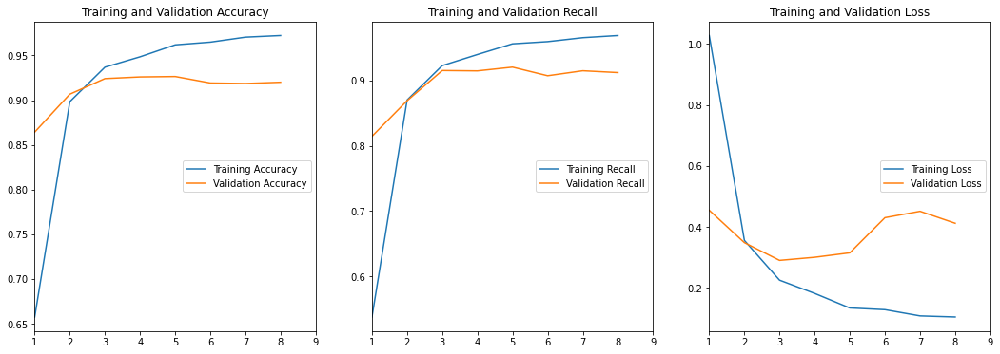

In [ ]:
#Presentation of accuracy and loss
show_acc_recall_loss_chart(CNN_history_1)

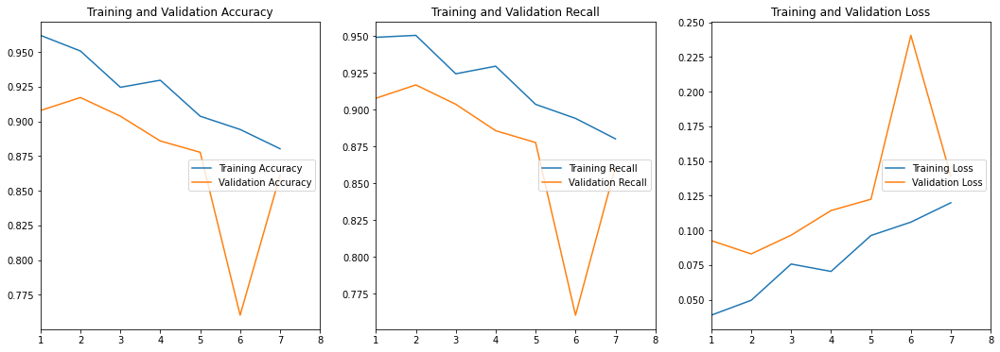

In [ ]:
#Presentation of accuracy and loss
show_acc_recall_loss_chart(CNN_history_2)

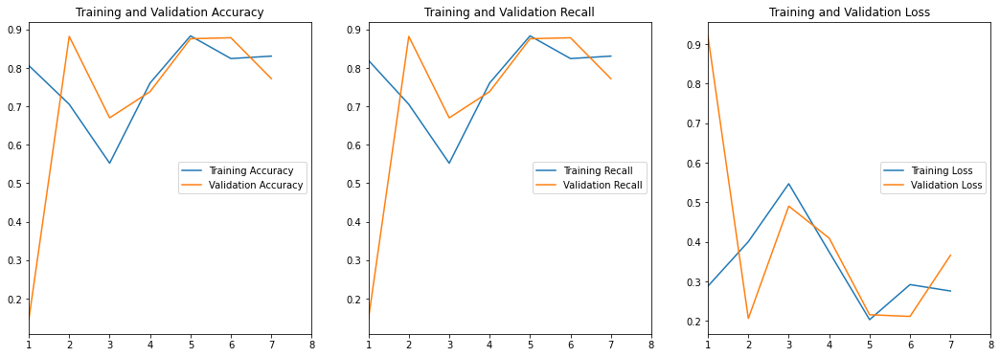

In [ ]:
#Presentation of accuracy and loss
show_acc_recall_loss_chart(CNN_history_3)

Tried comparing all the three loss functions and in these 'categorical_crossentropy' loss is helping to improvise the accuracy in predictions

In [ ]:
# from sklearn import metrics
# metrics.plot_roc_curve(CNN_model,X_test,y_test_onehot)

In [ ]:
# # AUC_ROC curve - need to plot
# from sklearn.preprocessing import LabelBinarizer
# from sklearn.metrics import roc_curve
# y_score = CNN_model.predict(X_test).ravel()
# # fpr_keras, tpr_keras, thresholds_keras = roc_curve(y_test_onehot, y_score)

# # from sklearn.metrics import auc
# # auc_keras = auc(fpr_keras, tpr_keras)

# import numpy as np
# from scipy import interp
# import matplotlib.pyplot as plt
# from itertools import cycle
# from sklearn.metrics import roc_curve, auc

# # Plot linewidth.
# lw = 2
# n_classes = CLASS_COUNT

# # Compute ROC curve and ROC area for each class
# fpr = dict()
# tpr = dict()
# roc_auc = dict()

# lb = LabelBinarizer()
# lb.fit(y_test_onehot)
# y_test = lb.transform(y_test_onehot)
# y_score = lb.transform(y_score)

# for i in range(n_classes):
#     fpr[i], tpr[i], _ = roc_curve(y_test_onehot[:,i], y_score[:,i])
#     roc_auc[i] = auc(fpr[i], tpr[i])

# # Compute micro-average ROC curve and ROC area
# fpr["micro"], tpr["micro"], _ = roc_curve(y_test_onehot.ravel(), y_score.ravel())
# roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# # Compute macro-average ROC curve and ROC area

# # First aggregate all false positive rates
# all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# # Then interpolate all ROC curves at this points
# mean_tpr = np.zeros_like(all_fpr)
# for i in range(n_classes):
#     mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# # Finally average it and compute AUC
# mean_tpr /= n_classes

# fpr["macro"] = all_fpr
# tpr["macro"] = mean_tpr
# roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# # Plot all ROC curves
# plt.figure(1)
# plt.plot(fpr["micro"], tpr["micro"],
#          label='micro-average ROC curve (area = {0:0.2f})'
#                ''.format(roc_auc["micro"]),
#          color='deeppink', linestyle=':', linewidth=4)

# plt.plot(fpr["macro"], tpr["macro"],
#          label='macro-average ROC curve (area = {0:0.2f})'
#                ''.format(roc_auc["macro"]),
#          color='navy', linestyle=':', linewidth=4)

# colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
# for i, color in zip(range(n_classes), colors):
#     plt.plot(fpr[i], tpr[i], color=color, lw=lw,
#              label='ROC curve of class {0} (area = {1:0.2f})'
#              ''.format(i, roc_auc[i]))

# plt.plot([0, 1], [0, 1], 'k--', lw=lw)
# plt.xlim([0.0, 1.0])
# plt.ylim([0.0, 1.05])
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Some extension of Receiver operating characteristic to multi-class')
# plt.legend(loc="lower right")
# plt.show()


# # Zoom in view of the upper left corner.
# plt.figure(2)
# plt.xlim(0, 0.2)
# plt.ylim(0.8, 1)
# plt.plot(fpr["micro"], tpr["micro"],
#          label='micro-average ROC curve (area = {0:0.2f})'
#                ''.format(roc_auc["micro"]),
#          color='deeppink', linestyle=':', linewidth=4)

# plt.plot(fpr["macro"], tpr["macro"],
#          label='macro-average ROC curve (area = {0:0.2f})'
#                ''.format(roc_auc["macro"]),
#          color='navy', linestyle=':', linewidth=4)

# colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
# for i, color in zip(range(n_classes), colors):
#     plt.plot(fpr[i], tpr[i], color=color, lw=lw,
#              label='ROC curve of class {0} (area = {1:0.2f})'
#              ''.format(i, roc_auc[i]))

# plt.plot([0, 1], [0, 1], 'k--', lw=lw)
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Some extension of Receiver operating characteristic to multi-class')
# plt.legend(loc="lower right")
# plt.show()

In [ ]:
model_score_summary_df = ML_models_hpt_recall_acc_score_df

In [ ]:
CNN_val_acc = np.max(CNN_history_1.history['val_accuracy'])*100
CNN_val_recall = np.max(CNN_history_1.history['val_recall'])*100
CNN_val_auc = np.max(CNN_history_1.history['val_auc'])*100
# Create a dataframe to store F1 Scores of all models we will build
# model_score_summary_df = pd.DataFrame([{'Model': 'CNN',
#                          'Prediction Accuracy Score': format(CNN_val_acc, '0.2%'),
#                          'Prediction Recall Score': format(CNN_val_recall, '0.2%'),
#                          'Prediction AUC Score': format(CNN_val_auc, '0.2%')   
#                          }])
model_score_summary_df.loc[len(model_score_summary_df.index)] = ['CNN', format(CNN_val_acc, '0.1f'),format(CNN_val_recall, '0.1f'),format(CNN_val_auc, '0.1f')]


In [ ]:
model_score_summary_df

,Model,Prediction Accuracy Score,Prediction Recall Score,Preduction AUC Score
0,Logistic Regression,93.9,93.9,NaN
1,Decision Tree,90.6,90.6,NaN
2,Random Forest,94.6,94.6,NaN
3,SVM,94.0,94.0,NaN
4,NBayes,90.4,90.4,NaN
5,XGBoost,94.1,94.1,NaN
6,LightGB,94.2,94.2,NaN
7,CNN,92.6,92.0,99.0


####Building a simple forward LSTM model

In [ ]:
fwd_lstm_model = Sequential()

fwd_lstm_model.add(Embedding(input_dim=num_words, output_dim=max_len, embeddings_initializer=Constant(embedding_matrix),input_length=max_len, trainable=False))
fwd_lstm_model.add(LSTM(128, dropout=0.3))
# fwd_lstm_model.add(LSTM(64, dropout=0.2))
# fwd_lstm_model.add(Dense(32, activation='tanh'))
fwd_lstm_model.add(Dense(32, activation='relu'))
fwd_lstm_model.add(Dense(CLASS_COUNT, activation='softmax'))

fwd_lstm_model.compile(loss='categorical_crossentropy', optimizer=Adam(lr=0.01), metrics=['accuracy',recall_metrics,auc_metrics])
fwd_lstm_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 100, 100)          4315100   
                                                                 
 lstm (LSTM)                 (None, 128)               117248    
                                                                 
 dense_2 (Dense)             (None, 32)                4128      
                                                                 
 dense_3 (Dense)             (None, 11)                363       
                                                                 
Total params: 4,436,839
Trainable params: 121,739
Non-trainable params: 4,315,100
_________________________________________________________________


In [ ]:
#Training
start = time.perf_counter()

fwd_lstm_history = fwd_lstm_model.fit(X_train, y_train, epochs=200, batch_size=1024, validation_data=(X_test, y_test),callbacks = [early_stopping,reduce_lr])

elapsed = time.perf_counter() - start
print('Elapsed %.3f seconds.' % elapsed)

Epoch 1/200
32/32 [==============================] - 5s 56ms/step - loss: 2.3684 - accuracy: 0.1119 - recall: 0.2004 - auc: 0.6771 - val_loss: 2.3363 - val_accuracy: 0.1170 - val_recall: 0.0210 - val_auc: 0.5787 - lr: 0.0100
Epoch 2/200
32/32 [==============================] - 1s 31ms/step - loss: 2.3581 - accuracy: 0.1232 - recall: 0.0272 - auc: 0.5348 - val_loss: 2.7341 - val_accuracy: 0.1159 - val_recall: 0.0153 - val_auc: 0.5314 - lr: 0.0100
Epoch 3/200
32/32 [==============================] - 1s 31ms/step - loss: 2.3747 - accuracy: 0.1175 - recall: 0.0192 - auc: 0.5279 - val_loss: 2.3440 - val_accuracy: 0.1134 - val_recall: 0.0237 - val_auc: 0.5311 - lr: 0.0100
Epoch 4/200
32/32 [==============================] - 1s 31ms/step - loss: 2.3352 - accuracy: 0.1224 - recall: 0.0253 - auc: 0.5295 - val_loss: 2.3257 - val_accuracy: 0.1255 - val_recall: 0.0276 - val_auc: 0.5350 - lr: 0.0100
Epoch 5/200
32/32 [==============================] - 1s 31ms/step - loss: 2.3103 - accuracy: 0.1347 

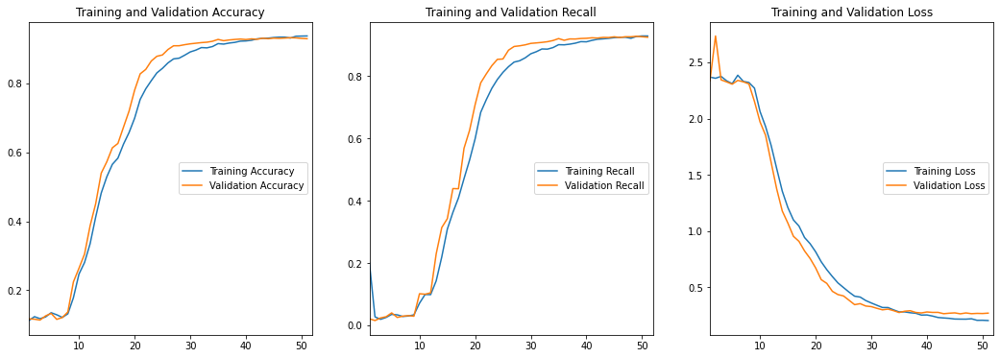

In [ ]:
#Presentation of accuracy and loss
show_acc_recall_loss_chart(fwd_lstm_history)

In [ ]:
FLSTM_val_acc = np.max(fwd_lstm_history.history['val_accuracy'])*100
FLSTM_val_recall = np.max(fwd_lstm_history.history['val_recall'])*100
FLSTM_val_auc = np.max(fwd_lstm_history.history['val_auc'])*100

model_score_summary_df.loc[len(model_score_summary_df.index)] = ['Forwd LSTM', format(FLSTM_val_acc, '0.1f'),format(FLSTM_val_recall, '0.1f'),format(FLSTM_val_auc, '0.1f')]


In [ ]:
model_score_summary_df

,Model,Prediction Accuracy Score,Prediction Recall Score,Preduction AUC Score
0,Logistic Regression,93.9,93.9,NaN
1,Decision Tree,90.6,90.6,NaN
2,Random Forest,94.6,94.6,NaN
3,SVM,94.0,94.0,NaN
4,NBayes,90.4,90.4,NaN
5,XGBoost,94.1,94.1,NaN
6,LightGB,94.2,94.2,NaN
7,CNN,92.6,92.0,99.0
8,Forwd LSTM,93.2,92.8,99.1


In [ ]:
fwd_lstm_model_1 = Sequential()

fwd_lstm_model_1.add(Embedding(input_dim=num_words, output_dim=max_len, embeddings_initializer=Constant(embedding_matrix),input_length=max_len, trainable=False))
fwd_lstm_model_1.add(LSTM(128, dropout=0.3))
# fwd_lstm_model.add(LSTM(64, dropout=0.2))
# fwd_lstm_model.add(Dense(32, activation='tanh'))
fwd_lstm_model_1.add(Dense(32, activation='relu'))
fwd_lstm_model_1.add(Dense(CLASS_COUNT, activation='softmax'))

fwd_lstm_model_1.compile(loss= dice_coef_12cat_loss, optimizer=Adam(lr=0.01), metrics=['accuracy',recall_metrics,auc_metrics])
fwd_lstm_model_1.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 100, 100)          4315100   
                                                                 
 lstm_1 (LSTM)               (None, 128)               117248    
                                                                 
 dense_4 (Dense)             (None, 32)                4128      
                                                                 
 dense_5 (Dense)             (None, 11)                363       
                                                                 
Total params: 4,436,839
Trainable params: 121,739
Non-trainable params: 4,315,100
_________________________________________________________________


In [ ]:
#Training
start = time.perf_counter()

fwd_lstm_1_history = fwd_lstm_model_1.fit(X_train, y_train, epochs=200, batch_size=1024, validation_data=(X_test, y_test),callbacks = [early_stopping,reduce_lr])

elapsed = time.perf_counter() - start
print('Elapsed %.3f seconds.' % elapsed)

Epoch 1/200
32/32 [==============================] - 4s 56ms/step - loss: 0.9034 - accuracy: 0.0980 - recall: 0.2866 - auc: 0.6491 - val_loss: 0.9028 - val_accuracy: 0.0961 - val_recall: 0.0961 - val_auc: 0.5072 - lr: 0.0100
Epoch 2/200
32/32 [==============================] - 1s 31ms/step - loss: 0.9015 - accuracy: 0.0985 - recall: 0.0985 - auc: 0.5052 - val_loss: 0.9008 - val_accuracy: 0.0988 - val_recall: 0.0988 - val_auc: 0.5114 - lr: 0.0100
Epoch 3/200
32/32 [==============================] - 1s 31ms/step - loss: 0.8940 - accuracy: 0.1072 - recall: 0.1069 - auc: 0.5097 - val_loss: 0.8888 - val_accuracy: 0.1111 - val_recall: 0.1111 - val_auc: 0.5118 - lr: 0.0100
Epoch 4/200
32/32 [==============================] - 1s 31ms/step - loss: 0.8875 - accuracy: 0.1128 - recall: 0.1128 - auc: 0.5124 - val_loss: 0.8876 - val_accuracy: 0.1125 - val_recall: 0.1125 - val_auc: 0.5118 - lr: 0.0100
Epoch 5/200
32/32 [==============================] - 1s 31ms/step - loss: 0.8880 - accuracy: 0.1122 

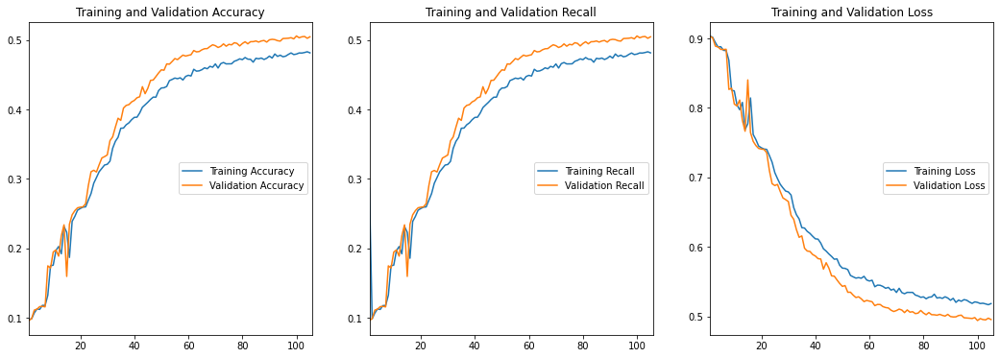

In [ ]:
#Presentation of accuracy and loss
show_acc_recall_loss_chart(fwd_lstm_1_history)

#### Bi directional LSTM model

In [ ]:
biLSTM = Sequential()

biLSTM.add(Embedding(input_dim=num_words, output_dim=max_len, embeddings_initializer=Constant(embedding_matrix), input_length=max_len, trainable=False))
# biLSTM.add(Bidirectional(LSTM(units=128, recurrent_dropout = 0.3, dropout = 0.3, return_sequences = True)))
biLSTM.add(Bidirectional(LSTM(units=128, recurrent_dropout = 0.3, dropout = 0.3, return_sequences = True)))
biLSTM.add(Bidirectional(LSTM(units=64, recurrent_dropout = 0.1, dropout = 0.1)))
# biLSTM.add(Dense(16, activation='relu' ))
biLSTM.add(Dense(32, activation='tanh' ))
biLSTM.add(Dense(CLASS_COUNT, activation='sigmoid'))

biLSTM.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 0.005), loss='categorical_crossentropy', metrics=['accuracy',recall_metrics,auc_metrics])

biLSTM.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 100, 100)          4315100   
                                                                 
 bidirectional (Bidirectiona  (None, 100, 256)         234496    
 l)                                                              
                                                                 
 bidirectional_1 (Bidirectio  (None, 128)              164352    
 nal)                                                            
                                                                 
 dense_6 (Dense)             (None, 32)                4128      
                                                                 
 dense_7 (Dense)             (None, 11)                363       
                                                                 
Total params: 4,718,439
Trainable params: 403,339
Non-

In [ ]:
#Training
start = time.perf_counter()

early_stopping = callbacks.EarlyStopping(monitor ="val_loss", mode ="min", patience=5)

biLSTM_history = biLSTM.fit(X_train, y_train, epochs=10, batch_size=1024, validation_data=(X_test, y_test),callbacks = [early_stopping,reduce_lr])

elapsed = time.perf_counter() - start
print('Elapsed %.3f seconds.' % elapsed)

Epoch 1/10
32/32 [==============================] - 48s 1s/step - loss: 1.6245 - accuracy: 0.4469 - recall: 0.7866 - auc: 0.7829 - val_loss: 1.1248 - val_accuracy: 0.6362 - val_recall: 0.9571 - val_auc: 0.9116 - lr: 0.0050
Epoch 2/10
32/32 [==============================] - 38s 1s/step - loss: 0.9710 - accuracy: 0.6846 - recall: 0.9684 - auc: 0.9287 - val_loss: 0.6638 - val_accuracy: 0.7976 - val_recall: 0.9827 - val_auc: 0.9615 - lr: 0.0050
Epoch 3/10
32/32 [==============================] - 38s 1s/step - loss: 0.6308 - accuracy: 0.8011 - recall: 0.9857 - auc: 0.9647 - val_loss: 0.4435 - val_accuracy: 0.8723 - val_recall: 0.9896 - val_auc: 0.9783 - lr: 0.0050
Epoch 4/10
32/32 [==============================] - 38s 1s/step - loss: 0.4376 - accuracy: 0.8687 - recall: 0.9910 - auc: 0.9787 - val_loss: 0.3375 - val_accuracy: 0.9047 - val_recall: 0.9918 - val_auc: 0.9843 - lr: 0.0050
Epoch 5/10
32/32 [==============================] - 38s 1s/step - loss: 0.3298 - accuracy: 0.9034 - recall: 

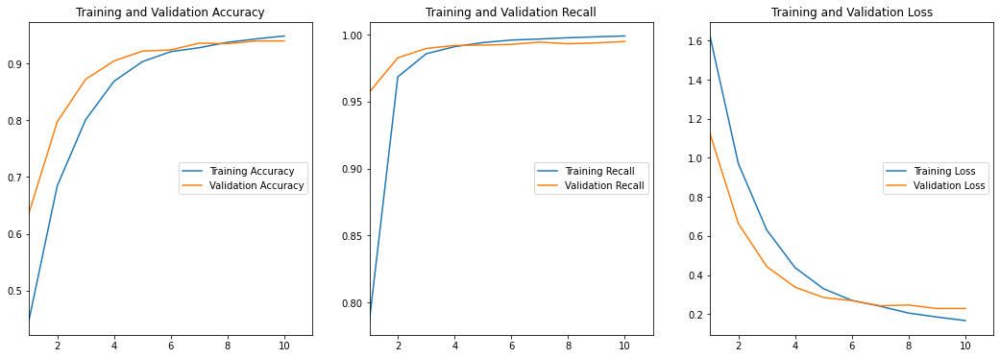

In [ ]:
#Presentation of accuracy and loss
show_acc_recall_loss_chart(biLSTM_history)

In [ ]:
np.max(biLSTM_history.history['val_accuracy'])

0.9399332404136658

In [ ]:
biLSTM_1 = Sequential()

biLSTM_1.add(Embedding(input_dim=num_words, output_dim=max_len, embeddings_initializer=Constant(embedding_matrix), input_length=max_len, trainable=False))
# biLSTM_1.add(Bidirectional(LSTM(units=256, recurrent_dropout = 0.3, dropout = 0.3, return_sequences = True)))
biLSTM_1.add(Bidirectional(LSTM(units=128, recurrent_dropout = 0.2, dropout = 0.2, return_sequences = True)))
biLSTM_1.add(Bidirectional(LSTM(units=64, recurrent_dropout = 0.1, dropout = 0.1)))
biLSTM_1.add(Dense(32, activation='tanh' ))
biLSTM_1.add(Dense(CLASS_COUNT, activation='softmax'))

biLSTM_1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 0.005), loss='categorical_crossentropy', metrics=['accuracy',recall_metrics,auc_metrics])

biLSTM_1.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_4 (Embedding)     (None, 100, 100)          4315100   
                                                                 
 bidirectional_2 (Bidirectio  (None, 100, 256)         234496    
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 128)              164352    
 nal)                                                            
                                                                 
 dense_8 (Dense)             (None, 32)                4128      
                                                                 
 dense_9 (Dense)             (None, 11)                363       
                                                                 
Total params: 4,718,439
Trainable params: 403,339
Non-

In [ ]:
#Training
start = time.perf_counter()

early_stopping = callbacks.EarlyStopping(monitor ="val_loss", mode ="min", patience=5)

biLSTM_1_history = biLSTM_1.fit(X_train, y_train, epochs=20, batch_size=1024, validation_data=(X_test, y_test),callbacks = [early_stopping,reduce_lr])

elapsed = time.perf_counter() - start
print('Elapsed %.3f seconds.' % elapsed)

Epoch 1/20
32/32 [==============================] - 49s 1s/step - loss: 1.5901 - accuracy: 0.4650 - recall: 0.4273 - auc: 0.8126 - val_loss: 1.0588 - val_accuracy: 0.6575 - val_recall: 0.5009 - val_auc: 0.9346 - lr: 0.0050
Epoch 2/20
32/32 [==============================] - 38s 1s/step - loss: 0.9074 - accuracy: 0.7113 - recall: 0.5933 - auc: 0.9499 - val_loss: 0.6421 - val_accuracy: 0.8066 - val_recall: 0.7367 - val_auc: 0.9731 - lr: 0.0050
Epoch 3/20
32/32 [==============================] - 38s 1s/step - loss: 0.5577 - accuracy: 0.8297 - recall: 0.7755 - auc: 0.9791 - val_loss: 0.3979 - val_accuracy: 0.8883 - val_recall: 0.8600 - val_auc: 0.9872 - lr: 0.0050
Epoch 4/20
32/32 [==============================] - 38s 1s/step - loss: 0.3937 - accuracy: 0.8822 - recall: 0.8546 - auc: 0.9877 - val_loss: 0.3198 - val_accuracy: 0.9086 - val_recall: 0.8906 - val_auc: 0.9900 - lr: 0.0050
Epoch 5/20
32/32 [==============================] - 37s 1s/step - loss: 0.2955 - accuracy: 0.9130 - recall: 

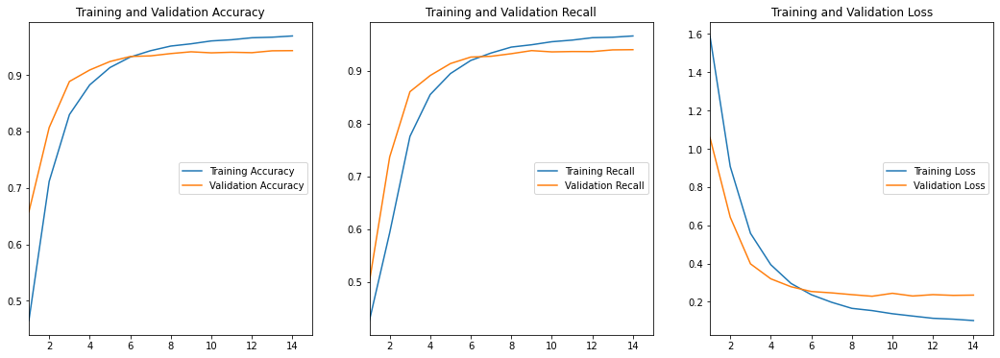

In [ ]:
#Presentation of accuracy and loss
show_acc_recall_loss_chart(biLSTM_1_history)

In [ ]:
np.max(biLSTM_1_history.history['val_accuracy'])

0.9428995251655579

In [ ]:
biLSTM_2 = Sequential()

biLSTM_2.add(Embedding(input_dim=num_words, output_dim=max_len, embeddings_initializer=Constant(embedding_matrix), input_length=max_len, trainable=False))
# biLSTM_1.add(Bidirectional(LSTM(units=256, recurrent_dropout = 0.3, dropout = 0.3, return_sequences = True)))
biLSTM_2.add(Bidirectional(LSTM(units=128, recurrent_dropout = 0.2, dropout = 0.2, return_sequences = True)))
biLSTM_2.add(Bidirectional(LSTM(units=64, recurrent_dropout = 0.1, dropout = 0.1)))
biLSTM_2.add(Dense(32, activation='relu' ))
biLSTM_2.add(Dense(CLASS_COUNT, activation='softmax'))

# load weights -- these models are running pretty fast (using google collab pro), so commented the checkpoint code, weights loading code 
# biLSTM_2.load_weights("weights.best.hdf5")


In [ ]:
# blstm_weights_filepath = "blstm_weights.best.hdf5"
# checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')


In [ ]:
biLSTM_2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 0.01), loss='categorical_crossentropy', metrics=['accuracy',recall_metrics,auc_metrics])
# biLSTM_2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 0.01), loss='categorical_crossentropy', metrics=['accuracy',recall_metrics,auc_metrics,checkpoint])


biLSTM_2.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_5 (Embedding)     (None, 100, 100)          4315100   
                                                                 
 bidirectional_4 (Bidirectio  (None, 100, 256)         234496    
 nal)                                                            
                                                                 
 bidirectional_5 (Bidirectio  (None, 128)              164352    
 nal)                                                            
                                                                 
 dense_10 (Dense)            (None, 32)                4128      
                                                                 
 dense_11 (Dense)            (None, 11)                363       
                                                                 
Total params: 4,718,439
Trainable params: 403,339
Non-

In [ ]:
#Training
start = time.perf_counter()

early_stopping = callbacks.EarlyStopping(monitor ="val_loss", mode ="min", patience=5)

biLSTM_2_history = biLSTM_2.fit(X_train, y_train, epochs=40, batch_size=1024, validation_data=(X_test, y_test),callbacks = [early_stopping,reduce_lr])

elapsed = time.perf_counter() - start
print('Elapsed %.3f seconds.' % elapsed)

Epoch 1/40
32/32 [==============================] - 48s 1s/step - loss: 1.6905 - accuracy: 0.4114 - recall: 0.3856 - auc: 0.8940 - val_loss: 1.1058 - val_accuracy: 0.6289 - val_recall: 0.4822 - val_auc: 0.9280 - lr: 0.0100
Epoch 2/40
32/32 [==============================] - 38s 1s/step - loss: 0.8566 - accuracy: 0.7207 - recall: 0.6176 - auc: 0.9546 - val_loss: 0.5320 - val_accuracy: 0.8357 - val_recall: 0.7847 - val_auc: 0.9802 - lr: 0.0100
Epoch 3/40
32/32 [==============================] - 38s 1s/step - loss: 0.4388 - accuracy: 0.8667 - recall: 0.8326 - auc: 0.9854 - val_loss: 0.3135 - val_accuracy: 0.9071 - val_recall: 0.8922 - val_auc: 0.9899 - lr: 0.0100
Epoch 4/40
32/32 [==============================] - 37s 1s/step - loss: 0.2909 - accuracy: 0.9140 - recall: 0.8978 - auc: 0.9919 - val_loss: 0.2743 - val_accuracy: 0.9248 - val_recall: 0.9140 - val_auc: 0.9916 - lr: 0.0100
Epoch 5/40
32/32 [==============================] - 38s 1s/step - loss: 0.2165 - accuracy: 0.9355 - recall: 

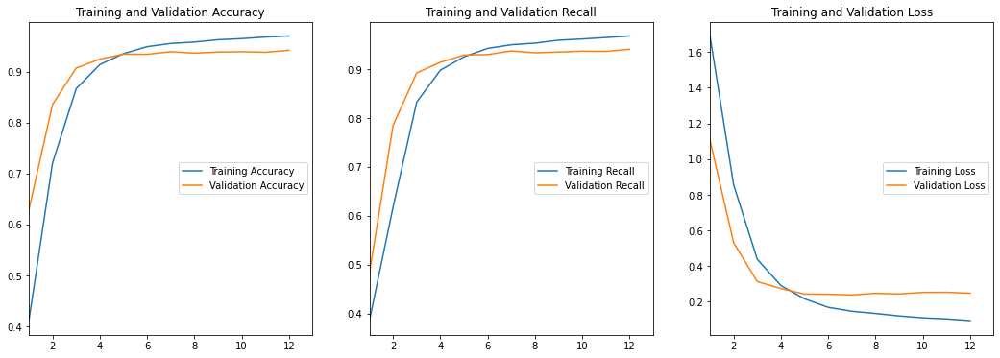

In [ ]:
#Presentation of accuracy and loss
show_acc_recall_loss_chart(biLSTM_2_history) 

In [ ]:
np.max(biLSTM_2_history.history['val_accuracy'])

0.9420652389526367

In [ ]:
biLSTM_3 = Sequential()
biLSTM_3.add(Embedding(input_dim=num_words, output_dim=max_len, embeddings_initializer=Constant(embedding_matrix), input_length=max_len, trainable=False))
biLSTM_3.add(Bidirectional(LSTM(units=128, recurrent_dropout = 0.2, dropout = 0.2, return_sequences = True)))
biLSTM_3.add(Bidirectional(LSTM(units=64, recurrent_dropout = 0.1, dropout = 0.1)))
biLSTM_3.add(Dense(32, activation='relu' ))
biLSTM_3.add(Dense(CLASS_COUNT, activation='softmax'))



In [ ]:
biLSTM_3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 0.005), loss=dice_coef_12cat_loss, metrics=['accuracy',recall_metrics,auc_metrics])

biLSTM_3.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_6 (Embedding)     (None, 100, 100)          4315100   
                                                                 
 bidirectional_6 (Bidirectio  (None, 100, 256)         234496    
 nal)                                                            
                                                                 
 bidirectional_7 (Bidirectio  (None, 128)              164352    
 nal)                                                            
                                                                 
 dense_12 (Dense)            (None, 32)                4128      
                                                                 
 dense_13 (Dense)            (None, 11)                363       
                                                                 
Total params: 4,718,439
Trainable params: 403,339
Non-

In [ ]:
#Training
start = time.perf_counter()

early_stopping = callbacks.EarlyStopping(monitor ="val_loss", mode ="min", patience=5)

biLSTM_3_history = biLSTM_3.fit(X_train, y_train, epochs=10, batch_size=1024, validation_data=(X_test, y_test),callbacks = [early_stopping,reduce_lr])

elapsed = time.perf_counter() - start
print('Elapsed %.3f seconds.' % elapsed)

Epoch 1/10
32/32 [==============================] - 39s 1s/step - loss: 0.1555 - accuracy: 0.8451 - recall: 0.8451 - auc: 0.9180 - val_loss: 0.1671 - val_accuracy: 0.8331 - val_recall: 0.8329 - val_auc: 0.9121 - lr: 0.0050
Epoch 2/10
32/32 [==============================] - 37s 1s/step - loss: 0.1546 - accuracy: 0.8458 - recall: 0.8458 - auc: 0.9185 - val_loss: 0.1678 - val_accuracy: 0.8323 - val_recall: 0.8323 - val_auc: 0.9114 - lr: 0.0050
Epoch 3/10
32/32 [==============================] - 37s 1s/step - loss: 0.1552 - accuracy: 0.8452 - recall: 0.8451 - auc: 0.9188 - val_loss: 0.1701 - val_accuracy: 0.8302 - val_recall: 0.8301 - val_auc: 0.9114 - lr: 0.0050
Epoch 4/10
32/32 [==============================] - 37s 1s/step - loss: 0.1550 - accuracy: 0.8453 - recall: 0.8452 - auc: 0.9186 - val_loss: 0.1682 - val_accuracy: 0.8319 - val_recall: 0.8319 - val_auc: 0.9119 - lr: 0.0050
Epoch 5/10
32/32 [==============================] - 37s 1s/step - loss: 0.1550 - accuracy: 0.8455 - recall: 

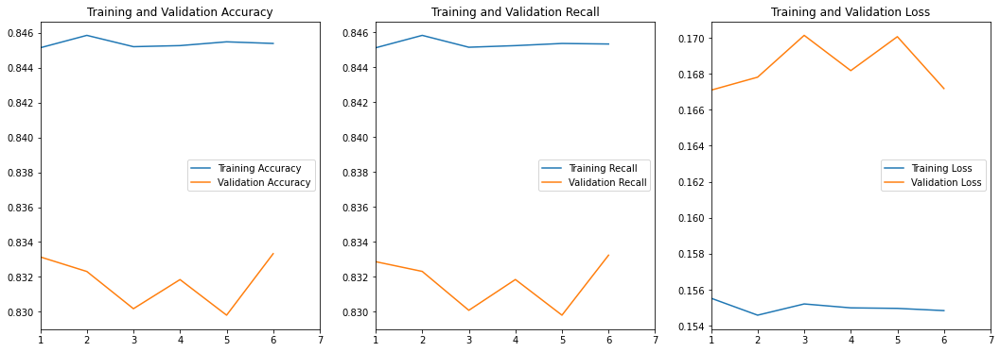

In [ ]:
#Presentation of accuracy and loss
show_acc_recall_loss_chart(biLSTM_3_history) 

In [ ]:
np.max(biLSTM_3_history.history['val_accuracy'])

0.8333333134651184

This model is comparitively better to other BiLSTMs - using Relu and Softmax

In [ ]:
BiLSTM_val_acc = np.max(biLSTM_2_history.history['val_accuracy'])*100
BiLSTM_val_recall = np.max(biLSTM_2_history.history['val_recall'])*100
BiLSTM_val_auc = np.max(biLSTM_2_history.history['val_auc'])*100

model_score_summary_df.loc[len(model_score_summary_df.index)] = ['BiDirectional LSTM', format(BiLSTM_val_acc, '0.1f'),format(BiLSTM_val_recall, '0.1f'),format(BiLSTM_val_auc, '0.1f')]


In [ ]:
model_score_summary_df

,Model,Prediction Accuracy Score,Prediction Recall Score,Preduction AUC Score
0,Logistic Regression,93.9,93.9,NaN
1,Decision Tree,90.6,90.6,NaN
2,Random Forest,94.6,94.6,NaN
3,SVM,94.0,94.0,NaN
4,NBayes,90.4,90.4,NaN
5,XGBoost,94.1,94.1,NaN
6,LightGB,94.2,94.2,NaN
7,CNN,92.6,92.0,99.0
8,Forwd LSTM,93.2,92.8,99.1
9,BiDirectional LSTM,94.2,94.1,99.2


Relu ativation and Softmax activation for the output layer is overall better in BiLSTM; 

#### BERT model

In [ ]:
new_df3.shape

In [ ]:
encoder = LabelEncoder()
transformed_label = encoder.fit_transform(new_df3['New Assignment group'])
print(transformed_label)

In [ ]:
# one hot encode output variable
labels = to_categorical(transformed_label)

sentences = new_df3['Lemmatized_clean_upd'].values

In [ ]:
new_df3.head(), labels, sentences

In [ ]:
PRE_TRAINED_MODEL_NAME = 'bert-base-uncased'
tokenizer = BertTokenizer.from_pretrained(PRE_TRAINED_MODEL_NAME,do_lower_case = True)

def encoder(sentences):
  ids = []
  for sentence in sentences:
    encoding = tokenizer.encode_plus(
    sentence,
    max_length=16,
    truncation = True,
    add_special_tokens=True,
    return_token_type_ids=False,
    pad_to_max_length=True,
    return_attention_mask=False)
    ids.append(encoding['input_ids'])
  return ids

#Train test split
train_sents,test_sents, train_labels, test_labels  = train_test_split(sentences,labels,test_size=0.25)

train_ids = encoder(train_sents)
test_ids = encoder(test_sents) 

In [ ]:
train_ids = tf.convert_to_tensor(train_ids)
test_ids = tf.convert_to_tensor(test_ids)
test_labels = tf.convert_to_tensor(test_labels)
train_labels = tf.convert_to_tensor(train_labels)

In [ ]:
test_ids

In [ ]:
test_labels

In [ ]:
bert_encoder = TFBertModel.from_pretrained('bert-base-uncased')
input_word_ids = tf.keras.Input(shape=(16,), dtype=tf.int32, name="input_word_ids")  
embedding = bert_encoder([input_word_ids])
dense = tf.keras.layers.Lambda(lambda seq: seq[:, 0, :])(embedding[0])
dense = tf.keras.layers.Dense(128, activation='relu')(dense)
dense = tf.keras.layers.Dropout(0.2)(dense)   
output = tf.keras.layers.Dense(CLASS_COUNT, activation='softmax')(dense)    

bert_model = tf.keras.Model(inputs=[input_word_ids], outputs=output) 

In [ ]:
bert_model.compile(tf.keras.optimizers.Adam(1e-5), loss='categorical_crossentropy',metrics=['accuracy',recall_metrics,auc_metrics])
bert_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_word_ids (InputLayer)  [(None, 16)]             0         
                                                                 
 tf_bert_model (TFBertModel)  TFBaseModelOutputWithPoo  109482240
                             lingAndCrossAttentions(l            
                             ast_hidden_state=(None,             
                             16, 768),                           
                              pooler_output=(None, 76            
                             8),                                 
                              past_key_values=None, h            
                             idden_states=None, atten            
                             tions=None, cross_attent            
                             ions=None)                          
                                                             

In [ ]:
bert_history = bert_model.fit(x = train_ids, y = train_labels, epochs = 10, verbose = 1, batch_size = 32, validation_data = (test_ids, test_labels))

Epoch 1/10
1012/1012 [==============================] - 128s 111ms/step - loss: 0.2023 - accuracy: 0.9414 - recall: 0.9311 - auc: 0.9950 - val_loss: 0.2187 - val_accuracy: 0.9433 - val_recall: 0.9405 - val_auc: 0.9922
Epoch 2/10
1012/1012 [==============================] - 109s 108ms/step - loss: 0.1424 - accuracy: 0.9582 - recall: 0.9528 - auc: 0.9972 - val_loss: 0.2277 - val_accuracy: 0.9422 - val_recall: 0.9392 - val_auc: 0.9915
Epoch 3/10
1012/1012 [==============================] - 110s 108ms/step - loss: 0.1091 - accuracy: 0.9672 - recall: 0.9640 - auc: 0.9980 - val_loss: 0.2356 - val_accuracy: 0.9442 - val_recall: 0.9416 - val_auc: 0.9910
Epoch 4/10
1012/1012 [==============================] - 108s 107ms/step - loss: 0.0901 - accuracy: 0.9721 - recall: 0.9694 - auc: 0.9986 - val_loss: 0.2443 - val_accuracy: 0.9455 - val_recall: 0.9433 - val_auc: 0.9898
Epoch 5/10
1012/1012 [==============================] - 109s 108ms/step - loss: 0.0746 - accuracy: 0.9762 - recall: 0.9744 - auc

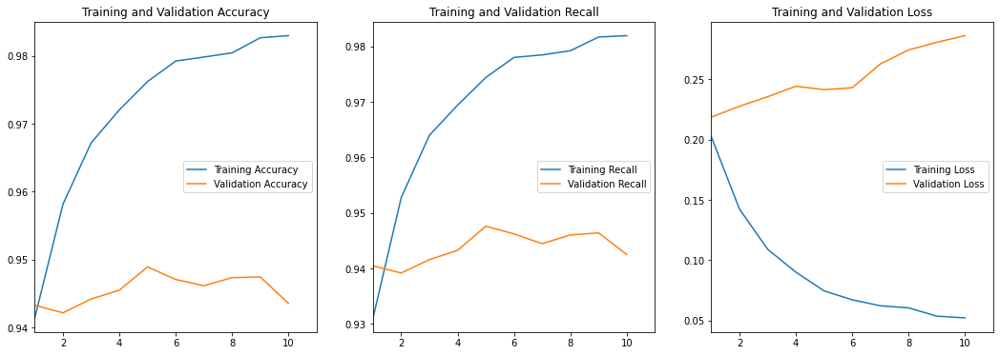

In [ ]:
#Presentation of accuracy and loss
show_acc_recall_loss_chart(bert_history) # Run 1 

In [ ]:
bert_history = bert_model.fit(x = train_ids, y = train_labels, epochs = 5, verbose = 1, batch_size = 32, validation_data = (test_ids, test_labels))

Epoch 1/5
1012/1012 [==============================] - 113s 112ms/step - loss: 0.0514 - accuracy: 0.9828 - recall: 0.9818 - auc: 0.9994 - val_loss: 0.2839 - val_accuracy: 0.9461 - val_recall: 0.9451 - val_auc: 0.9872
Epoch 2/5
1012/1012 [==============================] - 109s 107ms/step - loss: 0.0494 - accuracy: 0.9843 - recall: 0.9831 - auc: 0.9993 - val_loss: 0.2907 - val_accuracy: 0.9457 - val_recall: 0.9443 - val_auc: 0.9872
Epoch 3/5
1012/1012 [==============================] - 109s 107ms/step - loss: 0.0449 - accuracy: 0.9851 - recall: 0.9842 - auc: 0.9995 - val_loss: 0.2807 - val_accuracy: 0.9469 - val_recall: 0.9446 - val_auc: 0.9878
Epoch 4/5
1012/1012 [==============================] - 108s 107ms/step - loss: 0.0471 - accuracy: 0.9839 - recall: 0.9827 - auc: 0.9994 - val_loss: 0.2962 - val_accuracy: 0.9464 - val_recall: 0.9448 - val_auc: 0.9867
Epoch 5/5
1012/1012 [==============================] - 108s 107ms/step - loss: 0.0433 - accuracy: 0.9845 - recall: 0.9835 - auc: 0.9

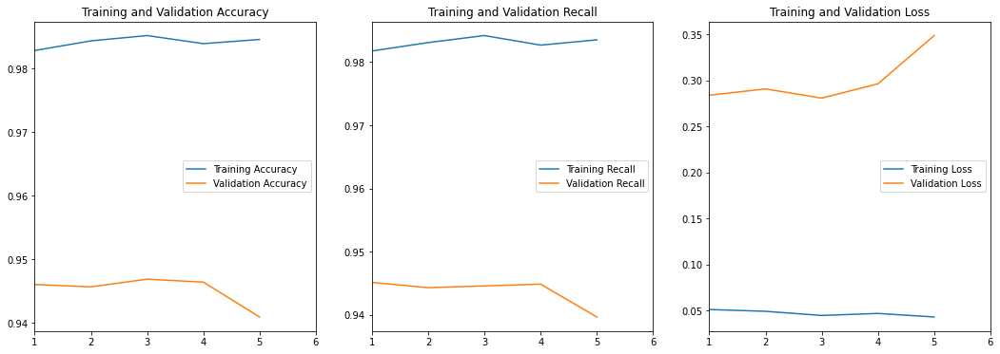

In [ ]:
#Presentation of accuracy and loss
show_acc_recall_loss_chart(bert_history) # Run 2

In [ ]:
np.max(bert_history.history['val_accuracy'])

0.948924720287323

In [ ]:
bert_encoder = TFBertModel.from_pretrained('bert-base-uncased')
input_word_ids = tf.keras.Input(shape=(16,), dtype=tf.int32, name="input_word_ids")  
embedding = bert_encoder([input_word_ids])
dense = tf.keras.layers.Lambda(lambda seq: seq[:, 0, :])(embedding[0])
dense = tf.keras.layers.Dense(128, activation='relu')(dense)
dense = tf.keras.layers.Dropout(0.2)(dense)   
output = tf.keras.layers.Dense(CLASS_COUNT, activation='softmax')(dense)    

bert_model_1 = tf.keras.Model(inputs=[input_word_ids], outputs=output)

Some layers from the model checkpoint at bert-base-uncased were not used when initializing TFBertModel: ['mlm___cls', 'nsp___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel were initialized from the model checkpoint at bert-base-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


In [ ]:
bert_model_1.compile(tf.keras.optimizers.Adam(1e-5), loss=dice_coef_12cat_loss ,metrics=['accuracy',recall_metrics,auc_metrics])
bert_model_1.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_word_ids (InputLayer)  [(None, 16)]             0         
                                                                 
 tf_bert_model_1 (TFBertMode  TFBaseModelOutputWithPoo  109482240
 l)                          lingAndCrossAttentions(l            
                             ast_hidden_state=(None,             
                             16, 768),                           
                              pooler_output=(None, 76            
                             8),                                 
                              past_key_values=None, h            
                             idden_states=None, atten            
                             tions=None, cross_attent            
                             ions=None)                          
                                                           

In [ ]:
bert_model_1_history = bert_model_1.fit(x = train_ids, y = train_labels, epochs = 5, verbose = 1, batch_size = 32, validation_data = (test_ids, test_labels))

Epoch 1/5
1012/1012 [==============================] - 130s 110ms/step - loss: 0.5135 - accuracy: 0.5002 - recall: 0.6017 - auc: 0.8508 - val_loss: 0.2986 - val_accuracy: 0.7116 - val_recall: 0.7041 - val_auc: 0.8780
Epoch 2/5
1012/1012 [==============================] - 109s 108ms/step - loss: 0.2512 - accuracy: 0.7561 - recall: 0.7537 - auc: 0.8933 - val_loss: 0.2151 - val_accuracy: 0.7863 - val_recall: 0.7856 - val_auc: 0.8974
Epoch 3/5
1012/1012 [==============================] - 112s 111ms/step - loss: 0.2033 - accuracy: 0.7998 - recall: 0.7986 - auc: 0.9064 - val_loss: 0.1906 - val_accuracy: 0.8103 - val_recall: 0.8102 - val_auc: 0.9086
Epoch 4/5
1012/1012 [==============================] - 109s 107ms/step - loss: 0.1764 - accuracy: 0.8267 - recall: 0.8256 - auc: 0.9226 - val_loss: 0.1471 - val_accuracy: 0.8540 - val_recall: 0.8530 - val_auc: 0.9395
Epoch 5/5
1012/1012 [==============================] - 108s 107ms/step - loss: 0.1215 - accuracy: 0.8822 - recall: 0.8812 - auc: 0.9

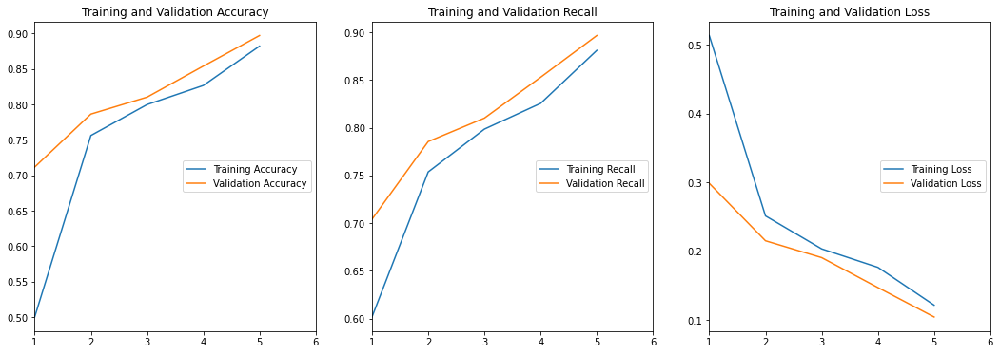

In [ ]:
#Presentation of accuracy and loss
show_acc_recall_loss_chart(bert_model_1_history) # Run 1

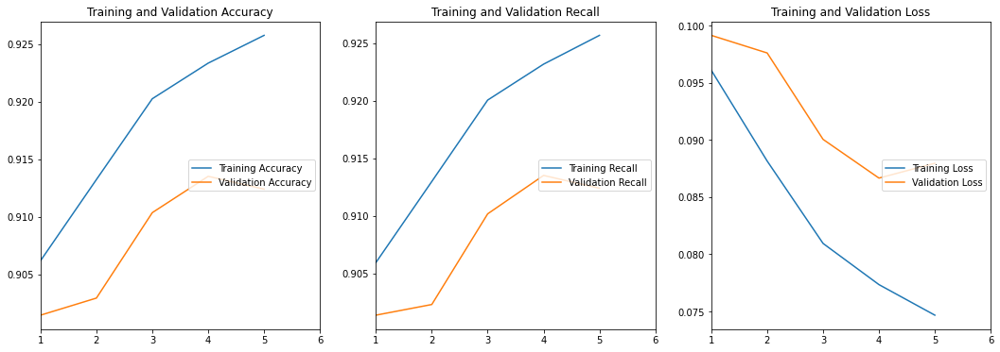

In [ ]:
#Presentation of accuracy and loss
show_acc_recall_loss_chart(bert_model_1_history) # Run 2 ; 5 more epochs

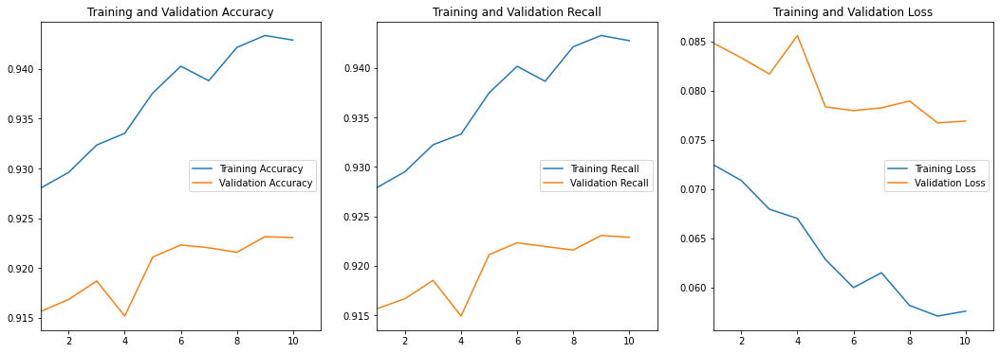

In [ ]:
#Presentation of accuracy and loss
show_acc_recall_loss_chart(bert_model_1_history) # Run 3v ; 10 more epochs

In [ ]:
bert_model_1_history = bert_model_1.fit(x = train_ids, y = train_labels, epochs = 10, verbose = 1, batch_size = 32, validation_data = (test_ids, test_labels))

Epoch 1/10
1012/1012 [==============================] - 108s 107ms/step - loss: 0.0725 - accuracy: 0.9280 - recall: 0.9279 - auc: 0.9645 - val_loss: 0.0848 - val_accuracy: 0.9156 - val_recall: 0.9156 - val_auc: 0.9591
Epoch 2/10
1012/1012 [==============================] - 107s 106ms/step - loss: 0.0709 - accuracy: 0.9296 - recall: 0.9295 - auc: 0.9653 - val_loss: 0.0833 - val_accuracy: 0.9169 - val_recall: 0.9167 - val_auc: 0.9588
Epoch 3/10
1012/1012 [==============================] - 108s 106ms/step - loss: 0.0679 - accuracy: 0.9324 - recall: 0.9322 - auc: 0.9666 - val_loss: 0.0817 - val_accuracy: 0.9187 - val_recall: 0.9185 - val_auc: 0.9603
Epoch 4/10
1012/1012 [==============================] - 107s 106ms/step - loss: 0.0670 - accuracy: 0.9335 - recall: 0.9333 - auc: 0.9673 - val_loss: 0.0856 - val_accuracy: 0.9152 - val_recall: 0.9149 - val_auc: 0.9578
Epoch 5/10
1012/1012 [==============================] - 108s 106ms/step - loss: 0.0628 - accuracy: 0.9376 - recall: 0.9375 - auc

In [ ]:
BERT_val_acc = np.max(bert_history.history['val_accuracy'])*100
BERT_val_recall = np.max(bert_history.history['val_recall'])*100
BERT_val_auc = np.max(bert_history.history['val_auc'])*100

model_score_summary_df.loc[len(model_score_summary_df.index)] = ['BERT model', format(BERT_val_acc, '0.1f'),format(BERT_val_recall, '0.1f'),format(BERT_val_auc, '0.1f')]


In [ ]:
model_score_summary_df

,Model,Prediction Accuracy Score,Prediction Recall Score,Preduction AUC Score
0,Logistic Regression,93.9,93.9,NaN
1,Decision Tree,90.6,90.6,NaN
2,Random Forest,94.6,94.6,NaN
3,SVM,94.0,94.0,NaN
4,NBayes,90.4,90.4,NaN
5,XGBoost,94.1,94.1,NaN
6,LightGB,94.2,94.2,NaN
7,CNN,92.6,92.0,99.0
8,Forwd LSTM,93.2,92.8,99.1
9,BiDirectional LSTM,94.2,94.1,99.2



#### Overall comparison of models for understanding the model performance

In [ ]:
accuracy = model_score_summary_df['Prediction Accuracy Score'].astype(str).astype(float)
# model_recall 

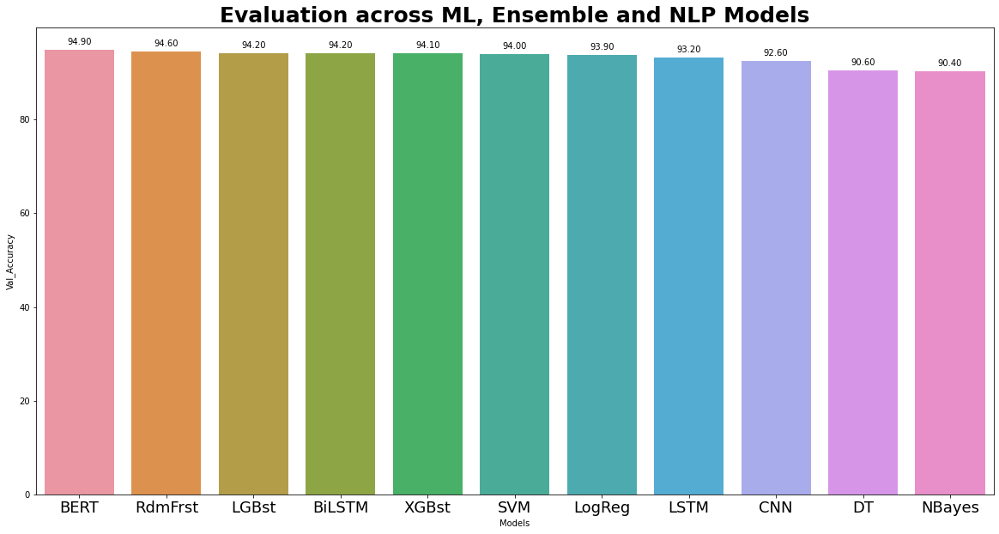

In [ ]:
conclusion = pd.DataFrame({
    'Models':[ 'LogReg', 'DT','RdmFrst','SVM','NBayes', 'XGBst', 'LGBst','CNN', 'LSTM', 'BiLSTM','BERT'], 
    'Accuracy':[accuracy[0], accuracy[1], accuracy[2],accuracy[3],accuracy[4],accuracy[5], 
                accuracy[6], accuracy[7],accuracy[8],accuracy[9] ,accuracy[10]]
                           })
conclusion['Accuracy'] = conclusion['Accuracy'].apply(lambda x: round(x,1))
conclusion.sort_values(by='Accuracy', inplace = True, ascending = False)

plt.figure(figsize=(20,10))
seaborn_plot = sns.barplot(conclusion.Models,conclusion.Accuracy)
for p in seaborn_plot.patches:
    seaborn_plot.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center',
                   va = 'center', xytext = (0, 9), textcoords = 'offset points')
plt.title("Evaluation across ML, Ensemble and NLP Models", weight='bold', size=25)
plt.xticks(size=18)
plt.xlabel("Models")
plt.ylabel("Val_Accuracy")
plt.show()



### To_Be_Done:





#### Done
EDA - Grp_0 - analysis and rehashing to subgroups to establish a more balanced dataset- done

Use Google Translator to convert other language content / text to English

used nlpaug to augment text/sentences to bring in balance to the dataset

Updated with few more ML Ensembling models (ADABoost, Catboost etc) to look for improvements

Build NLP models (CNN, forwardLSTM, BiLSTM, BERT) 

NLP models - finetuning (inprogress) - we can try few more options by chosing different loss functions; Need help on how to build and use Dice loss function.
Done

Planning to do some more finetuning on the ML / Ensemble models as well, if time permits.  Done


#### Planned



Pending

Try BERT text augmentor,  if we have time later. 

Create cascading model setup for ML and further use that for NLP models - Now wondering, if we need to do this?

Take the list of user ids / caller ids - remove them in the entire text - figure out a way to do that.

Explore based on cluster based new class definitions.


### Phase 2 work to continue




#### Cluster identification  (This will be explored more in phase 2 of the Capstone project )



In [ ]:
# We now Use TFIDF Vectorization method to convert the Words in the description to number vectors. Once done, we will use clustering mechanisms to see if there are clusters that can be visualized. We will use KMeans find out the Optimal number of Clusters and then visualize the same.

In [ ]:
def find_optimal_clusters(data, max_k):
  iters = range(2, max_k+1, 2)
  print ("Iters", iters)
  sse = []
  for k in iters:
      sse.append(MiniBatchKMeans(n_clusters=k, init_size=200, batch_size=300, random_state=20).fit(data).inertia_)
      print('Fit {} clusters'.format(k))
      
  f, ax = plt.subplots(1, 1,figsize=(15,5))
  
  ax.plot(iters, sse, marker='o')
  ax.set_xlabel('Cluster Centers')
  ax.set_xticks(iters)
  ax.set_xticklabels(iters)
  ax.set_ylabel('SSE')
  ax.set_title('SSE by Cluster Center Plot')
  #set_size(50,5)
  plt.show()

In [ ]:
## Function to PLot the Clusters using Tsne and PCA
def plot_tsne_pca(data, labels, size_d, component_count):
  max_label = max(labels)
  max_items = np.random.choice(range(data.shape[0]), size=size_d, replace=False)
  
  pca = PCA(n_components=component_count).fit_transform(data[max_items,:].todense())
  tsne = TSNE().fit_transform(PCA(n_components=component_count).fit_transform(data[max_items,:].todense()))
  
  
  idx = np.random.choice(range(pca.shape[0]), size=size_d, replace=False)
  label_subset = labels[max_items]
  label_subset = [cm.hsv(i/max_label) for i in label_subset[idx]]
  
  f, ax = plt.subplots(1, 2, figsize=(14, 6))
  
  ax[0].scatter(pca[idx, 0], pca[idx, 1], c=label_subset)
  ax[0].set_title('PCA Cluster Plot')
  
  ax[1].scatter(tsne[idx, 0], tsne[idx, 1], c=label_subset)
  ax[1].set_title('TSNE Cluster Plot')

In [ ]:
  # create teh vectorizer
tfidf = TfidfVectorizer(min_df=5 ,use_idf=True )


## fitting the vectorizer
tfidf.fit(incident_df_final.Lemmatized_clean_upd)
text = tfidf.transform(incident_df_final.Lemmatized_clean_upd)

## Get Feature Names and Store the values in a Dataframe
tf_matrix = text.toarray()
vocab = tfidf.get_feature_names()
tf_df = pd.DataFrame(np.round(tf_matrix, 2), columns=vocab)

## View the nunmber of Features
tf_df.columns

Index(['aa', 'ab', 'abap', 'abend', 'abended', 'ability', 'abort', 'aborted',
       'absolutely', 'ac',
       ...
       'zokivdfa', 'zone', 'zpmxgdcw', 'zrmlhkyq', 'zscr', 'zsd', 'zuxcfonv',
       'zwirhcol', 'zywoxerf', 'zz'],
      dtype='object', length=2258)

In [ ]:
tf_df.shape


(8386, 2258)

Iters range(2, 74, 2)
Fit 2 clusters
Fit 4 clusters
Fit 6 clusters
Fit 8 clusters
Fit 10 clusters
Fit 12 clusters
Fit 14 clusters
Fit 16 clusters
Fit 18 clusters
Fit 20 clusters
Fit 22 clusters
Fit 24 clusters
Fit 26 clusters
Fit 28 clusters
Fit 30 clusters
Fit 32 clusters
Fit 34 clusters
Fit 36 clusters
Fit 38 clusters
Fit 40 clusters
Fit 42 clusters
Fit 44 clusters
Fit 46 clusters
Fit 48 clusters
Fit 50 clusters
Fit 52 clusters
Fit 54 clusters
Fit 56 clusters
Fit 58 clusters
Fit 60 clusters
Fit 62 clusters
Fit 64 clusters
Fit 66 clusters
Fit 68 clusters
Fit 70 clusters
Fit 72 clusters


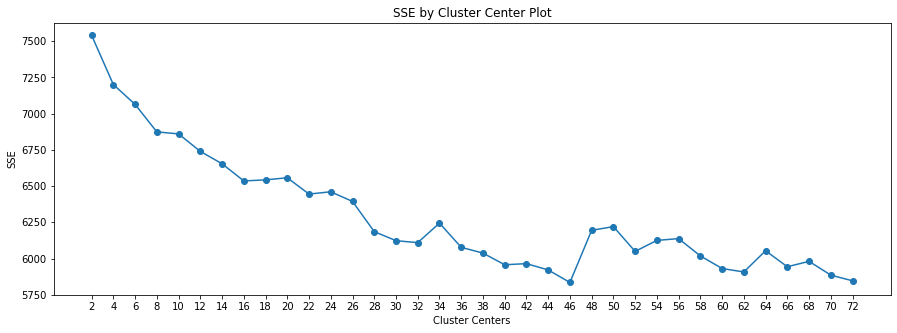

In [ ]:
find_optimal_clusters(text, 73)


In [ ]:
clusters = MiniBatchKMeans(n_clusters=34, init_size=100, batch_size=200, random_state=20).fit_predict(text)
clusters.shape

(8386,)

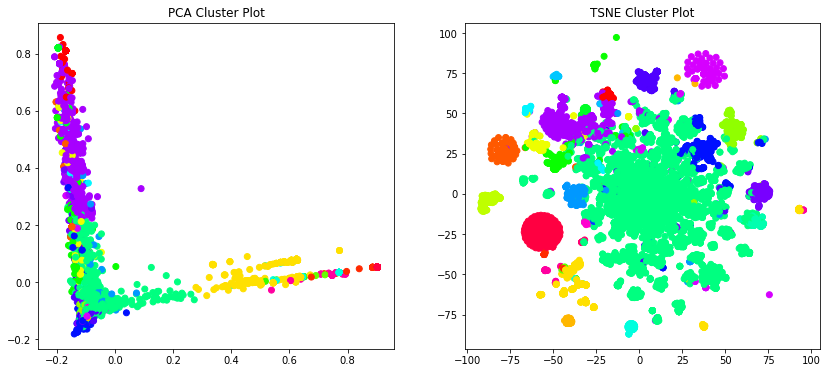

In [ ]:
import matplotlib.cm as cm
num_features = 8372
pca_comp_count = 100
plot_tsne_pca(text, clusters,num_features,pca_comp_count )


In [ ]:
df = incident_df_final.copy()
dfL = df[(df["New Assignment group"] == 'GRP_L')] 
dfC = df[(df['New Assignment group'] == "GRP_C")] 
dfCL = df[(df['New Assignment group'] == "GRP_CL")] 
dfCC = df[(df['New Assignment group'] == "GRP_CC")] 

# or (df['New Assignment group'] == "GRP_C") or (df['New Assignment group'] == "GRP_CL") or (df['New Assignment group'] == "GRP_CC")]

df1 = pd.concat( [dfL,dfC,dfCL,dfCC])
# df1 = pd..append( dfL,dfC,dfCL,dfCC)
df1

,Assignment group,New Assignment group,Full Description,Full Description - After Lemmatized,Language,Lemmatized_clean_upd
6,GRP_1,GRP_L,event: critical:HostName_221.company.com the v...,event critical hostname company value mountpoi...,en,event critical hostname company value mountpoi...
141,GRP_15,GRP_L,channel partner receiving multiple emails from...,channel partner receive multiple email erp urg...,en,channel partner receive multiple email erp urg...
201,GRP_22,GRP_L,msd crm assign crm and e4 license to nyrjkctu ...,msd crm assign crm e license nyrjkctu tbhkenlo...,en,msd crm assign crm e license nyrjkctu tbhkenlo...
206,GRP_23,GRP_L,unable to see the current course in ethics una...,current course ethic current course ethic id b...,en,current course ethic current course ethic id b...
247,GRP_27,GRP_L,"outlook crashing ic: welcome, our next availab...",outlook crash ic welcome next available agent ...,en,outlook crash ic welcome next available agent ...
...,...,...,...,...,...,...
8403,GRP_28,GRP_L,welcome screen in the germany lobby is not wor...,welcome screen germany lobby not work check,en,welcome screen germany lobby not work check
8430,GRP_22,GRP_L,zlxcsqdg ckpojwir cannot see all his customer ...,zlxcsqdg ckpojwir not customer account msd crm...,en,zlxcsqdg ckpojwir not customer account msd crm...
8437,GRP_15,GRP_L,erp crm(SID_39 web) sold-to accounts is saved ...,erp crm sid web sell account save without divi...,en,erp crm sid web sell account save without divi...
8459,GRP_15,GRP_L,erp crm complaint when is assigned generating ...,erp crm complaint assign generate duplicate em...,en,erp crm complaint assign generate duplicate em...


Iters range(2, 74, 2)
Fit 2 clusters
Fit 4 clusters
Fit 6 clusters
Fit 8 clusters
Fit 10 clusters
Fit 12 clusters
Fit 14 clusters
Fit 16 clusters
Fit 18 clusters
Fit 20 clusters
Fit 22 clusters
Fit 24 clusters
Fit 26 clusters
Fit 28 clusters
Fit 30 clusters
Fit 32 clusters
Fit 34 clusters
Fit 36 clusters
Fit 38 clusters
Fit 40 clusters
Fit 42 clusters
Fit 44 clusters
Fit 46 clusters
Fit 48 clusters
Fit 50 clusters
Fit 52 clusters
Fit 54 clusters
Fit 56 clusters
Fit 58 clusters
Fit 60 clusters
Fit 62 clusters
Fit 64 clusters
Fit 66 clusters
Fit 68 clusters
Fit 70 clusters
Fit 72 clusters


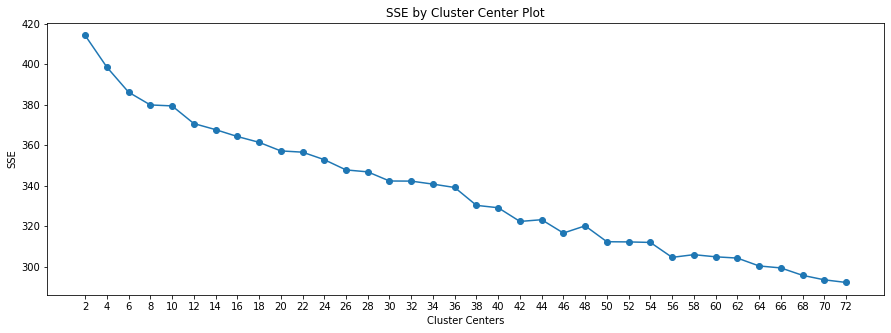

In [ ]:
tfidf = TfidfVectorizer(min_df=0., max_df=1., use_idf=True)
tfidf.fit(df1.Lemmatized_clean_upd)
text1 = tfidf.transform(df1.Lemmatized_clean_upd)

tf_matrix = text1.toarray()
vocab = tfidf.get_feature_names()
tf_df = pd.DataFrame(np.round(tf_matrix, 2), columns=vocab)
find_optimal_clusters(text1, 73)

In [ ]:
clusters = MiniBatchKMeans(n_clusters=32, init_size=100, batch_size=200, random_state=20).fit_predict(text1)
clusters.shape

(427,)

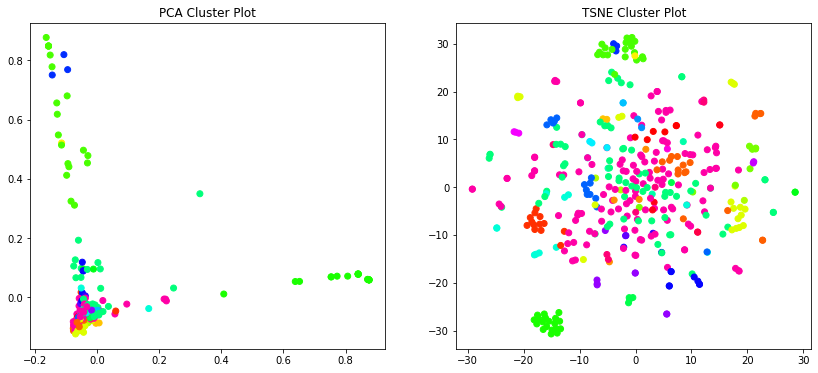

In [ ]:
num_features = 400
pca_comp_count = 100
plot_tsne_pca(text1, clusters,num_features,pca_comp_count )

We can try and do some analysis on the clustering for the data that are GRP_L, GRP_C, GRP_CL, GRP_CC


In [ ]:
## will be done in the coming week

### End of Code